# 1. Chọn 03 bộ dữ liệu, dùng xuyên suốt cho toàn bộ các yêu cầu

* 522H0093 + 522H0134 = 3 + 4 = 7 mod 7 = 0 => đề bắt buộc 0 (Online Retail Dataset)

* Đề chọn là đề 5 (Students Performance Dataset) và đề 1 (Adult Income Dataset (Census Income))

# Code 0: Online Retail Dataset



##Link data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
secret_path='/content/drive/MyDrive/Trực quan hóa dữ liệu_Huy_Nhân_063/Datasets/Online_Retail.csv'

## Import libraries

In [4]:
# Load data
import pandas as pd

# Visualization
import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Time
import datetime as dt

# 2. Khám phá dữ liệu (Exploratory Data Analysis - EDA)

##a. Tóm tắt thông tin dữ liệu:

### Show data

In [5]:
df = pd.read_csv(secret_path)

In [ ]:
print("Bảng dữ liệu có:")
df

Bảng dữ liệu có:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


### Kiểm tra số lượng bản ghi và số lượng biển số.

In [ ]:
so_luong_ban_ghi, so_luong_bien_so = df.shape

print(f"Số lượng bản ghi: {so_luong_ban_ghi}")
print(f"Số lượng biến số: {so_luong_bien_so}")

Số lượng bản ghi: 541909
Số lượng biến số: 8


### Kiểu dữ liệu của từng biến.

In [ ]:
print("\nThông tin kiểu dữ liệu:")
print(df.info())


Thông tin kiểu dữ liệu:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB
None


* Bộ dữ liệu Online Retail có chứa các thông tin sau:

* InvoiceNo: Mã đơn hàng (mỗi đơn hàng có một mã duy nhất).

* StockCode: Mã sản phẩm.

* Description: Mô tả sản phẩm.

* Quantity: Số lượng sản phẩm mua.

* InvoiceDate: Ngày thực hiện giao dịch.

* UnitPrice: Giá của sản phẩm tại thời điểm giao dịch.

* CustomerID: Mã khách hàng (nếu có).

* Country: Quốc gia của khách hàng

### Xử lý dữ liệu thiếu.

In [ ]:
print("\nSố lượng giá trị thiếu mỗi cột:")
missing_values = df.isnull().sum()
print(missing_values)


Số lượng giá trị thiếu mỗi cột:
InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64


In [ ]:
def missing_plot(dataset, key) -> None:
    '''
        Define missing plot to detect all missing values in dataset

        Args:
              Dataset(DataFrame): DataFrame of dataset
              key(String): Column name

        Return:
                None
    '''
    null_feat = pd.DataFrame(len(dataset[key]) - dataset.isnull().sum(), columns=['Count'])
    percentage_null = pd.DataFrame((len(dataset[key]) - (len(dataset[key]) - dataset.isnull().sum())) / len(dataset[key]) * 100, columns=['Count'])
    percentage_null = percentage_null.round(2)

    trace = go.Bar(
        x=null_feat.index,
        y=null_feat['Count'],
        opacity=0.8,
        text=percentage_null['Count'],
        textposition='auto',
        marker=dict(
            color='#7EC0EE',  # Change the color of bars
            line=dict(
                color='#000000',
                width=1.5
            )
        ),
        width=0.5,  # Adjust the width of bars
    )

    layout = dict(title="Missing Values (count & %)", plot_bgcolor='rgba(0,0,0,0)',  # Set plot background color to transparent
                  xaxis=dict(title="Features"), yaxis=dict(title="Count"))

    fig = go.Figure(data=[trace], layout=layout)
    py.iplot(fig)

In [ ]:
missing_plot(df, 'InvoiceNo')

In [ ]:
print("\nCác bản ghi chứa giá trị thiếu:")
df[df.isnull().any(axis=1)].head(10)


Các bản ghi chứa giá trị thiếu:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.00,NaN,United Kingdom
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,2010-12-01 14:32:00,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,2010-12-01 14:32:00,1.66,NaN,United Kingdom
1447,536544,21790,VINTAGE SNAP CARDS,9,2010-12-01 14:32:00,1.66,NaN,United Kingdom
1448,536544,21791,VINTAGE HEADS AND TAILS CARD GAME,2,2010-12-01 14:32:00,2.51,NaN,United Kingdom
1449,536544,21801,CHRISTMAS TREE DECORATION WITH BELL,10,2010-12-01 14:32:00,0.43,NaN,United Kingdom
1450,536544,21802,CHRISTMAS TREE HEART DECORATION,9,2010-12-01 14:32:00,0.43,NaN,United Kingdom
1451,536544,21803,CHRISTMAS TREE STAR DECORATION,11,2010-12-01 14:32:00,0.43,NaN,United Kingdom


In [ ]:
threshold = len(df) * 0.5  # Ngưỡng 50% giá trị thiếu
threshold

270954.5

* Xử lí bằng cách ffill, bfill

In [ ]:
# # Xử lý dữ liệu thiếu
# df = df.dropna(thresh=threshold, axis=1)  # Loại bỏ cột có quá nhiều giá trị thiếu
df = df.ffill().bfill()   # Điền dữ liệu thiếu

In [ ]:
missing_plot(df, 'CustomerID')

In [ ]:
# df.shape -> (536641,9) Xử lí bằng cách ffill,bfill

(536641, 9)

* Xử lí bằng cách drop dòng nào có dữ liệu thiếu

In [6]:
df.dropna(inplace=True)

In [ ]:
missing_plot(df, 'CustomerID')

In [ ]:
df.shape

(406829, 8)

In [ ]:
print("\nDữ liệu sau khi xử lý giá trị thiếu:")
print(df.isnull().sum())


Dữ liệu sau khi xử lý giá trị thiếu:
InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64


### Xử lí dữ liệu trùng lặp.

* Sau khi dùng ffill,bfill

In [ ]:
duplicated_rows = df[df.duplicated(keep=False)]
print("\nSố lượng bản ghi trùng lặp:", duplicated_rows.shape[0])


Số lượng bản ghi trùng lặp: 10147


In [ ]:
print("\nChi tiết các cột bị trùng lặp:")
duplicated_rows.sort_values(by=list(df.columns)).head(10)


Chi tiết các cột bị trùng lặp:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
494,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom
517,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom
485,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom
539,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom
489,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom
527,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom
521,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom
537,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom
578,536412,21448,12 DAISY PEGS IN WOOD BOX,1,2010-12-01 11:49:00,1.65,17920.0,United Kingdom
598,536412,21448,12 DAISY PEGS IN WOOD BOX,1,2010-12-01 11:49:00,1.65,17920.0,United Kingdom


In [ ]:
# Xóa bản ghi trùng lặp (nếu cần)
df = df.drop_duplicates()
print("\nDữ liệu sau khi loại bỏ trùng lặp:", df.shape)


Dữ liệu sau khi loại bỏ trùng lặp: (401604, 8)


In [7]:
import pandas as pd
import plotly.graph_objs as go
import plotly.offline as py

def duplicate_plot(dataset) -> None:
    '''
    Define duplicate plot to detect all duplicate rows in dataset

    Args:
          dataset (DataFrame): DataFrame of dataset

    Return:
          None
    '''
    total_rows = len(dataset)
    duplicate_rows = dataset.duplicated().sum()
    unique_rows = total_rows - duplicate_rows

    values = [unique_rows, duplicate_rows]
    labels = ['Unique Rows', 'Duplicate Rows']
    percentage = [round((v / total_rows) * 100, 2) for v in values]

    trace = go.Bar(
        x=labels,
        y=values,
        text=[f'{p}%' for p in percentage],
        textposition='auto',
        marker=dict(
            color=['#90EE90', '#FF7F7F'],  # Green for unique, red for duplicates
            line=dict(
                color='#000000',
                width=1.5
            )
        ),
        width=0.5,
        opacity=0.8
    )

    layout = dict(
        title="Duplicate Rows (count & %)",
        plot_bgcolor='rgba(0,0,0,0)',
        xaxis=dict(title="Row Type"),
        yaxis=dict(title="Count")
    )

    fig = go.Figure(data=[trace], layout=layout)
    py.iplot(fig)


In [8]:
duplicate_plot(df)

* Sau khi dùng dropna

In [ ]:
duplicated_rows = df[df.duplicated(keep=False)]
print("\nSố lượng bản ghi trùng lặp:", duplicated_rows.shape[0])


Số lượng bản ghi trùng lặp: 10062


In [ ]:
print("\nChi tiết các cột bị trùng lặp:")
duplicated_rows.sort_values(by=list(df.columns)).head(10)


Chi tiết các cột bị trùng lặp:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
494,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom
517,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,2010-12-01 11:45:00,1.25,17908.0,United Kingdom
485,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom
539,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,2010-12-01 11:45:00,4.95,17908.0,United Kingdom
489,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom
527,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,2010-12-01 11:45:00,2.10,17908.0,United Kingdom
521,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom
537,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,2010-12-01 11:45:00,2.95,17908.0,United Kingdom
578,536412,21448,12 DAISY PEGS IN WOOD BOX,1,2010-12-01 11:49:00,1.65,17920.0,United Kingdom
598,536412,21448,12 DAISY PEGS IN WOOD BOX,1,2010-12-01 11:49:00,1.65,17920.0,United Kingdom


In [9]:
# Xóa bản ghi trùng lặp (nếu cần)
df = df.drop_duplicates()
print("\nDữ liệu sau khi loại bỏ trùng lặp:", df.shape)


Dữ liệu sau khi loại bỏ trùng lặp: (401604, 8)


In [10]:
duplicate_plot(df)

### Số lượng các sản phẩm duy nhất

* Sau khi dùng ffill,bfill

In [ ]:
#How many different unique products ? -> 4223
df["Description"].nunique()

4223

* Sau khi dùng dropna

In [ ]:
#How many different unique products ?
df["Description"].nunique()

3896

### Coi ngày bắt đầu và ngày kết thúc

In [ ]:
print("Max date :",df["InvoiceDate"].max())
print("Min date :",df["InvoiceDate"].min())

Max date : 2011-12-09 12:50:00
Min date : 2010-12-01 08:26:00


## b. Phân tích thống kê mô tả:

### Tính các thống kê như trung bình,trung vị, độ lệch chuẩn, tứ phân vị.

* Sau khi dùng ffill,bfill

In [ ]:
print(df.describe())

            Quantity      UnitPrice     CustomerID
count  536641.000000  536641.000000  536641.000000
mean        9.620029       4.632656   15267.782221
std       219.130156      97.233118    1738.418025
min    -80995.000000  -11062.060000   12346.000000
25%         1.000000       1.250000   13784.000000
50%         3.000000       2.080000   15144.000000
75%        10.000000       4.130000   16794.000000
max     80995.000000   38970.000000   18287.000000


* Sau khi dùng dropna

In [ ]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,401604.000000,401604.000000,401604.000000
mean,12.183273,3.474064,15281.160818
std,250.283037,69.764035,1714.006089
min,-80995.000000,0.000000,12346.000000
25%,2.000000,1.250000,13939.000000
50%,5.000000,1.950000,15145.000000
75%,12.000000,3.750000,16784.000000
max,80995.000000,38970.000000,18287.000000


1. Trung bình (Mean)

* Công thức:

    * Trung bình (x̄) = (∑xᵢ) / n

    * Trong đó:

          * ∑xᵢ là tổng của tất cả các giá trị trong tập dữ liệu.

          * n là số lượng giá trị trong tập dữ liệu.

2. Trung vị (Median)

  * Sắp xếp tập dữ liệu theo thứ tự tăng dần.

  * Nếu số lượng giá trị (n) là lẻ:

    * Trung vị là giá trị ở vị trí (n + 1) / 2.

  * Nếu số lượng giá trị (n) là chẵn:

    * Trung vị là trung bình của hai giá trị ở vị trí n / 2 và (n / 2) + 1.

3. Độ lệch chuẩn (Standard Deviation)

  * Công thức:

    * Độ lệch chuẩn (s) = √[∑(xᵢ - x̄)² / (n - 1)]

    * Trong đó:

       * xᵢ là mỗi giá trị trong tập dữ liệu.
        
       * x̄ là giá trị trung bình của tập dữ liệu.

       * n là số lượng giá trị trong tập dữ liệu.

4. Tứ phân vị (Quartiles)

* Sắp xếp tập dữ liệu theo thứ tự tăng dần.

* Tứ phân vị thứ nhất (Q1):

  * Là trung vị của nửa đầu tập dữ liệu.

* Tứ phân vị thứ hai (Q2):

  * Là trung vị của toàn bộ tập dữ liệu (tương đương với trung vị).

* Tứ phân vị thứ ba (Q3):

  * Là trung vị của nửa sau tập dữ liệu.

* Khoảng tứ phân vị (IQR):

  * IQR = Q3 - Q1

### Trực quan hoá bằng các biểu đồ phù hợp (ít nhất 3 loại biểu đồ) để nhận diện xu hướng dữ liệu.

### Lấy 10 sản phẩn được ưa thích nhất

* Sau khi dùng ffill,bfill

In [ ]:
# Get the top 10 most preferred products
most_preferred_products = df['Description'].value_counts()[:10]

# Create the bar plot
fig = px.bar(x=most_preferred_products.index,
             y=most_preferred_products.values,
             color=most_preferred_products.index,
             text=most_preferred_products.values,
             title="Top 10 Most Preferred Products Per Shop",
             labels={'x': 'Product', 'y': 'Count'})

# Update layout for better appearance
fig.update_layout(
    xaxis_title="Product",
    yaxis_title="Count",
    font=dict(size=12, family="Arial"),
    title_font=dict(size=16, family="Arial")
)

# Show the plot
fig.show()

* Sau khi dùng dropna

In [ ]:
def plot_top_preferred_products(df) -> None:
    '''
    Hàm hiển thị biểu đồ về 10 sản phẩm phổ biến nhất dựa trên cột 'Description'.

    Args:
          df (DataFrame): DataFrame chứa dữ liệu về các sản phẩm.

    Returns:
          None
    '''

    # Lấy 10 sản phẩm phổ biến nhất
    most_preferred_products = df['Description'].value_counts()[:10]

    # Tạo biểu đồ cột
    fig = px.bar(
        x=most_preferred_products.index,
        y=most_preferred_products.values,
        color=most_preferred_products.index,
        text=most_preferred_products.values,
        title="Top 10 Most Preferred Products Per Shop",
        labels={'x': 'Product', 'y': 'Count'}
    )

    # Tùy chỉnh giao diện
    fig.update_layout(
        xaxis_title="Product",
        yaxis_title="Count",
        font=dict(size=12, family="Arial"),
        title_font=dict(size=16, family="Arial")
    )

    # Hiển thị biểu đồ
    fig.show()

In [ ]:
plot_top_preferred_products(df)

In [ ]:
print(most_preferred_products.index)


Index(['WHITE HANGING HEART T-LIGHT HOLDER', 'REGENCY CAKESTAND 3 TIER',
       'JUMBO BAG RED RETROSPOT', 'PARTY BUNTING',
       'ASSORTED COLOUR BIRD ORNAMENT', 'LUNCH BAG RED RETROSPOT',
       'SET OF 3 CAKE TINS PANTRY DESIGN ', 'POSTAGE',
       'LUNCH BAG  BLACK SKULL.', 'PACK OF 72 RETROSPOT CAKE CASES'],
      dtype='object', name='Description')


'Người giữ ánh sáng TEGING TANG TRẮNG', 'Regency Cakestand 3 tầng',
       'Túi Jumbo Retspot Red Retrospot', 'Party Bunting',
       'Các loại vật trang trí chim màu', 'túi ăn trưa retrospot',
       'Bộ 3 bánh hộp đựng thiết kế phòng đựng thức ăn', 'bưu chính',
       'Túi ăn trưa Sọ đen.', 'Gói 72 trường hợp bánh retrospot'

* Lí do:

* Giá cả phù hợp với giá trị cảm nhận: Khách hàng sẵn sàng chi trả nếu cảm thấy sản phẩm xứng đáng với số tiền bỏ ra, dù giá cao hay thấp.

* Nhu cầu sử dụng cao và phổ biến: Các sản phẩm thiết yếu hoặc được sử dụng thường xuyên sẽ có tần suất mua cao hơn.

* Bán theo gói hoặc combo lớn: Việc đóng gói sản phẩm theo set (như "Pack of 72" hoặc "Set of 3") giúp tăng số lượng bán ra mà vẫn giữ được mức giá hợp lý.

* Đối tượng khách hàng đặc biệt: Các khách hàng mua sỉ, cửa hàng nhỏ hoặc quán cà phê thường mua với số lượng lớn để phục vụ hoạt động kinh doanh.

* Thiết kế đẹp và giá trị thẩm mỹ: Những sản phẩm có hình thức bắt mắt, trang trí tốt hoặc mang thông điệp cảm xúc sẽ thu hút người mua hơn.


In [ ]:

def plot_avg_price_of_top_products(df) -> None:
    '''
    Hàm hiển thị biểu đồ giá trung bình của 10 sản phẩm phổ biến nhất.

    Args:
          df (DataFrame): DataFrame chứa dữ liệu về các sản phẩm và giá.

    Returns:
          None
    '''

    # Lấy top 10 sản phẩm phổ biến nhất
    top_products = df['Description'].value_counts().head(10).index

    # Lọc dữ liệu tương ứng
    top_df = df[df['Description'].isin(top_products)]

    # Tính giá trung bình cho từng sản phẩm
    avg_prices = top_df.groupby('Description')['UnitPrice'].mean().reindex(top_products)

    # Vẽ biểu đồ
    fig_price = px.bar(
        x=avg_prices.index,
        y=avg_prices.values,
        color=avg_prices.index,
        text=avg_prices.round(2),
        title="Average Unit Price of Top 10 Products",
        labels={'x': 'Product', 'y': 'Average Unit Price'}
    )

    fig_price.update_layout(
        xaxis_title="Product",
        yaxis_title="Average Unit Price",
        font=dict(size=12, family="Arial"),
        title_font=dict(size=16, family="Arial")
    )

    # Hiển thị biểu đồ
    fig_price.show()

In [ ]:
plot_avg_price_of_top_products(df)

* Tôi đề xuất có nhữg đợt khuyến mãi những món phổ biến

* Những đồ này là đồ thiết yếu , nên tập trung nhập hàng nhiều

### Top 10 đồ không phổ biến

In [ ]:
def plot_least_preferred_products(df) -> None:
    '''
    Hàm hiển thị biểu đồ về 10 sản phẩm ít được mua nhất, loại trừ NaN nếu có.

    Args:
          df (DataFrame): DataFrame chứa dữ liệu về các sản phẩm.

    Returns:
          None
    '''

    # Loại trừ NaN trong cột 'Description' và lấy 10 sản phẩm ít được mua nhất
    least_preferred_products = df['Description'].dropna().value_counts(ascending=True).head(10)

    # Tạo biểu đồ thanh
    fig = px.bar(
        x=least_preferred_products.index,
        y=least_preferred_products.values,
        color=least_preferred_products.index,
        text=least_preferred_products.values,
        title="Top 10 Least Preferred Products Per Shop",
        labels={'x': 'Product', 'y': 'Count'}
    )

    # Tùy chỉnh giao diện
    fig.update_layout(
        xaxis_title="Product",
        yaxis_title="Count",
        font=dict(size=12, family="Arial"),
        title_font=dict(size=16, family="Arial")
    )

    # Hiển thị biểu đồ
    fig.show()



In [ ]:
plot_least_preferred_products(df)

* Nên có những sự loại bỏ món hàng không thật sự cần thiết, không cần chương trình khuyến mãi hay marketing

* Nếu muốn cải thiện thì tập trung bán theo mùa , dịp lễ

* Thận trọng trong việc nhập hàng

In [ ]:
import plotly.express as px

def plot_least_preferred_product_prices(df) -> None:
    '''
    Hàm hiển thị biểu đồ về giá của 10 sản phẩm ít được mua nhất.

    Args:
          df (DataFrame): DataFrame chứa dữ liệu về các sản phẩm và giá.

    Returns:
          None
    '''

    # Lấy 10 sản phẩm ít được mua nhất
    least_preferred_products = df['Description'].value_counts(ascending=True).head(10)

    # Lọc các sản phẩm ít được mua
    least_preferred_df = df[df['Description'].isin(least_preferred_products.index)]

    # Lấy cột 'Description' và 'UnitPrice'
    least_preferred_prices = least_preferred_df[['Description', 'UnitPrice']].drop_duplicates(subset='Description')

    # Tạo biểu đồ
    fig = px.bar(
        x=least_preferred_prices['Description'],
        y=least_preferred_prices['UnitPrice'],
        color=least_preferred_prices['Description'],
        text=least_preferred_prices['UnitPrice'],
        title="UnitPrice of Top 10 Least Preferred Products",
        labels={'x': 'Product', 'y': 'Unit Price'}
    )

    # Tùy chỉnh giao diện
    fig.update_layout(
        xaxis_title="Product",
        yaxis_title="Unit Price",
        font=dict(size=12, family="Arial"),
        title_font=dict(size=16, family="Arial")
    )

    # Hiển thị biểu đồ
    fig.show()




In [ ]:
plot_least_preferred_product_prices(df)

In [ ]:
# Lấy 10 sản phẩm ít được mua nhất
least_preferred_products = df['Description'].value_counts(ascending=True).head(10)

# In ra tên của 10 sản phẩm ít phổ biến nhất
print(least_preferred_products.index)


Index(['CROCHET LILAC/RED BEAR KEYRING', 'MIDNIGHT BLUE CRYSTAL DROP EARRINGS',
       'WHITE STONE/CRYSTAL EARRINGS', 'UNION JACK HOT WATER BOTTLE ',
       'FLOWER SHOP DESIGN MUG', 'BLACK VINT ART DEC CRYSTAL BRACELET',
       'LETTER "Z" BLING KEY RING', 'LETTER "W" BLING KEY RING',
       'SILVER AND BLACK ORBIT NECKLACE', 'CHRISTMAS CRAFT HEART STOCKING '],
      dtype='object', name='Description')


'Crochet lilac/red gấu Keyring', 'Midnight Blue Crystal Drop Pore',
       'Đá trắng/hoa tai pha lê', 'Chai nước nóng Union Jack',
       'Thiết kế cửa hàng hoa Mug', 'Vòng đeo tay nghệ thuật đen Vint Dec màu đen',
       'Thư "Z" BLING KEY RING', 'Thư "W" BLING KEY RING',
       'Vòng cổ quỹ đạo màu bạc và đen', 'Chuông trái tim thủ công Giáng sinh

### Lấy 10 quốc gia đầu với cơ sở khách hàng cao nhất

* Sau khi dùng ffill,bfill

In [ ]:
# Get the top 10 countries with the highest customer base
countries = df['Country'].value_counts()[:10]

# Create the bar plot
fig = px.bar(x=countries.index,
             y=countries.values,
             color=countries.index,
             text=countries.values,
             title="Customer Base by Countries",
             labels={'x': 'Country', 'y': 'Count'})

# Update layout for better appearance
fig.update_layout(
    xaxis_title="Country",
    yaxis_title="Count",
    font=dict(size=12, family="Arial"),
    title_font=dict(size=16, family="Arial")
)

# Show the plot
fig.show()

* Sau khi dùng dropna

In [ ]:
import plotly.express as px

def plot_top_countries(df) -> None:
    '''
    Hàm hiển thị biểu đồ về top 10 quốc gia có lượng khách hàng cao nhất.

    Args:
          df (DataFrame): DataFrame chứa dữ liệu về các quốc gia và khách hàng.

    Returns:
          None
    '''

    # Lấy 10 quốc gia có lượng khách hàng cao nhất
    countries = df['Country'].value_counts().head(10)

    # Tạo biểu đồ cột
    fig = px.bar(
        x=countries.index,
        y=countries.values,
        color=countries.index,
        text=countries.values,
        title="Customer Base by Countries",
        labels={'x': 'Country', 'y': 'Count'}
    )

    # Tùy chỉnh giao diện
    fig.update_layout(
        xaxis_title="Country",
        yaxis_title="Count",
        font=dict(size=12, family="Arial"),
        title_font=dict(size=16, family="Arial")
    )

    # Hiển thị biểu đồ
    fig.show()



In [ ]:
plot_top_countries(df)

* Tập trung nhiều ở UK

* Đang tập trung cơ sở ở UK

* Nhưng vẫn có rải tác ở khắp nơi

* Cần đẩy mạnh những chiến lược phát triển trong nước UK vì lượng mua tập trung ở đây


### Top 10 khách hàng hay mua

In [ ]:
import plotly.express as px

def plot_top_customers_by_id(df) -> None:
    '''
    Hàm hiển thị biểu đồ top 10 khách hàng phổ biến nhất theo CustomerID.

    Args:
          df (DataFrame): DataFrame chứa dữ liệu về khách hàng.

    Returns:
          None
    '''

    # Lấy top 10 khách hàng phổ biến nhất dựa trên CustomerID
    top_customers = df['CustomerID'].value_counts().head(10)

    # Tạo biểu đồ cột
    fig = px.bar(
        x=top_customers.index.astype(str),  # Đảm bảo CustomerID là chuỗi để dễ đọc trên biểu đồ
        y=top_customers.values,
        color=top_customers.index.astype(str),  # Đặt màu theo CustomerID
        text=top_customers.values,
        title="Top 10 Most Popular Customers (by CustomerID)",
        labels={'x': 'Customer ID', 'y': 'Purchase Count'}
    )

    # Tùy chỉnh giao diện
    fig.update_layout(
        xaxis_title="Customer ID",
        yaxis_title="Purchase Count",
        font=dict(size=12, family="Arial"),
        title_font=dict(size=16, family="Arial")
    )

    # Hiển thị biểu đồ
    fig.show()


In [ ]:
plot_top_customers_by_id(df)

* Vì là online chúng ta nên phân chia cấp bậc rank cho khách hàng.

* Tôi đề xuất mua bao nhiêu sản phẩm 1 tháng sẽ tương ứng với thứ bậc , thứ bậc đó giúp ích phần trăm giảm giá bill.

* Nâng cao chăm sóc cho khách hàng hạng bậc cao , quan tâm nhu cầu feedback của khách.

* Có những quà tặng tri ân, và quà sinh nhật thể hiện sự quan tâm của mình đối với khách.

In [ ]:
df["InvoiceNo"].nunique()

22190

## c. Phát hiện dữ liệu ngoại lai: Trình bày các phương pháp để xác định giá trị ngoại lai và đề xuất phương pháp xử lý.

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

# Đọc dữ liệu
df = pd.read_csv(secret_path)

# Hiển thị thông tin cơ bản
print(df.describe())
print(df.info())


            Quantity      UnitPrice     CustomerID
count  541909.000000  541909.000000  406829.000000
mean        9.552250       4.611114   15287.690570
std       218.081158      96.759853    1713.600303
min    -80995.000000  -11062.060000   12346.000000
25%         1.000000       1.250000   13953.000000
50%         3.000000       2.080000   15152.000000
75%        10.000000       4.130000   16791.000000
max     80995.000000   38970.000000   18287.000000
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
d

In [ ]:
# Lấy ra danh sách cột kiểu số
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

numeric_cols = [col for col in numeric_cols if col != 'CustomerID']
print("Các cột số liệu có thể dùng phân tích outlier:", numeric_cols)


Các cột số liệu có thể dùng phân tích outlier: ['Quantity', 'UnitPrice']


In [ ]:
def detect_outliers_iqr(data, column) -> object:
    '''
        Phát hiện giá trị ngoại lai

        Args:
              data(DataFrame): dataset
              columns(String): columns contain outliers

        Return:
                outliers:  object

    '''
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower) | (data[column] > upper)]
    return outliers


In [ ]:
for col in numeric_cols:
    outliers = detect_outliers_iqr(df, col)
    if not outliers.empty:
        print(f"Cột {col} có {len(outliers)} giá trị ngoại lai")

Cột Quantity có 58619 giá trị ngoại lai
Cột UnitPrice có 39627 giá trị ngoại lai


In [ ]:
from scipy import stats

for col in numeric_cols:
    z_scores = stats.zscore(df[col])
    outliers_z = df[abs(z_scores) > 3]
    print(f"Outliers ở cột {col}:")
    print(outliers_z[[col]])  # chỉ in ra cột đang xét


Outliers ở cột Quantity:
        Quantity
4287       -9360
4850        1824
4945        2880
4946        1400
6365        1440
...          ...
540061       698
540070      1500
540071      1200
540421     80995
540422    -80995

[346 rows x 1 columns]
Outliers ở cột UnitPrice:
        UnitPrice
1814       569.77
3041       607.49
4989       295.00
5685       498.47
6165       887.52
...           ...
536834    1008.96
537254    1683.75
539368     938.59
540908     933.17
541540    1714.17

[374 rows x 1 columns]


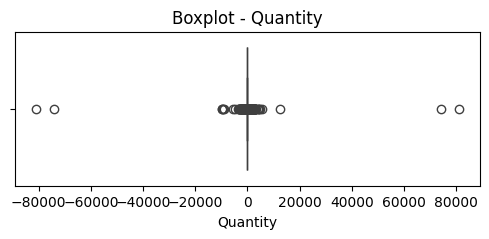

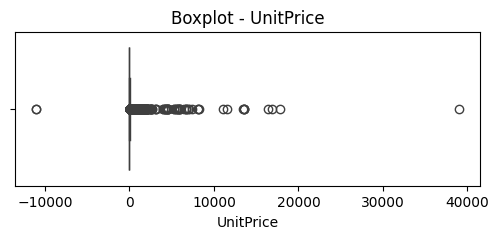

In [ ]:
for col in numeric_cols:
    plt.figure(figsize=(6, 2))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot - {col}')
    plt.show()

* Phát hiện có giá trị âm và có cả giá trị cao bất thường

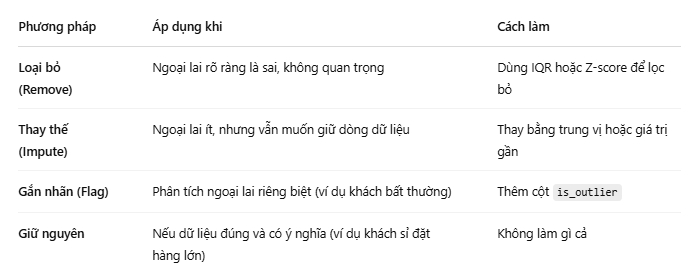

### Trong trường hợp này tôi sẽ xử lí chúng bằng cách loại bỏ ngoại lai

* Tại tôi đã biết ngưỡng mình nên làm thủ công nhưng tôi không khuyến khích các bạn làm vậy

In [ ]:
def filter_data(df, min_quantity=0, max_quantity=10000, min_price=0, max_price=10000) -> pd.DataFrame:
    '''
    Hàm lọc dữ liệu dựa trên các giá trị của Quantity và UnitPrice.

    Args:
        df (DataFrame): Dữ liệu cần lọc.
        min_quantity (int, optional): Giá trị tối thiểu cho Quantity (mặc định là 0).
        max_quantity (int, optional): Giá trị tối đa cho Quantity (mặc định là 10000).
        min_price (float, optional): Giá trị tối thiểu cho UnitPrice (mặc định là 0).
        max_price (float, optional): Giá trị tối đa cho UnitPrice (mặc định là 10000).

    Returns:
        pd.DataFrame: DataFrame sau khi lọc.
    '''
    # Lọc dữ liệu theo các điều kiện đã cho
    df_filtered = df[(df['Quantity'] >= min_quantity) & (df['Quantity'] <= max_quantity)]
    df_filtered = df_filtered[(df_filtered['UnitPrice'] >= min_price) & (df_filtered['UnitPrice'] <= max_price)]

    return df_filtered



In [ ]:
df = filter_data(df, min_quantity=0, max_quantity=10000, min_price=0, max_price=10000)

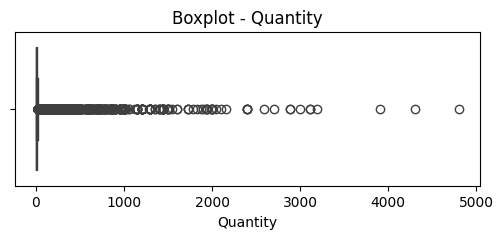

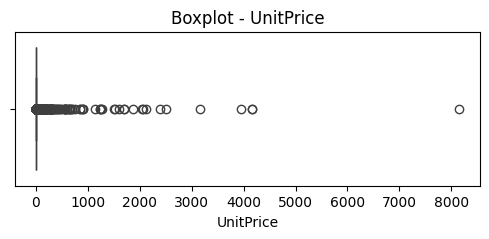

In [ ]:
for col in numeric_cols:
    plt.figure(figsize=(6, 2))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot - {col}')
    plt.show()

* Sau khi làm thì tôi vẫn cần lọc tiếp Quantity với ngưỡng 3500 và Unit Price ở 2800

In [ ]:
df = filter_data(df, min_quantity=0, max_quantity=3500, min_price=0, max_price=2800)

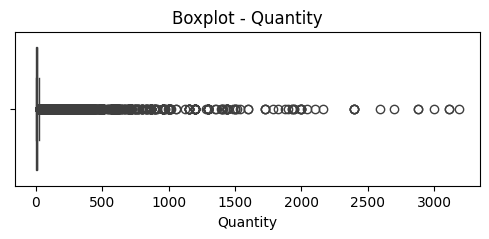

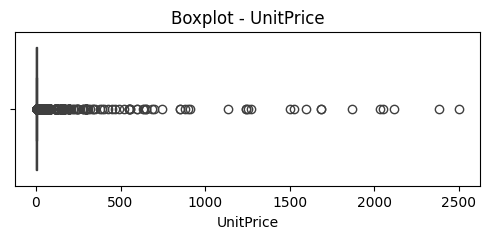

In [ ]:
for col in numeric_cols:
    plt.figure(figsize=(6, 2))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot - {col}')
    plt.show()

* Nhận thấy: Dữ liệu chắc chắn đã không còn giá trị ngoại lai bằng mắt thường .

In [ ]:
df = remove_outliers_iqr(df, 'UnitPrice')
df = remove_outliers_iqr(df, 'Quantity')

UnitPrice: giữ lại từ -6.25 đến 11.25
Quantity: giữ lại từ -28.0 đến 42.0


In [ ]:
df = filter_data(df, min_quantity=0, max_quantity=42.0, min_price=0, max_price=11.25)

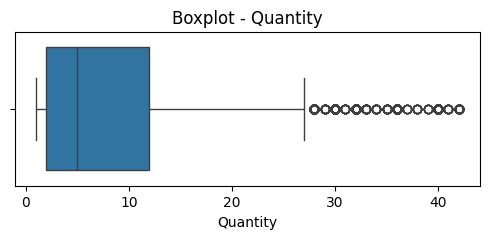

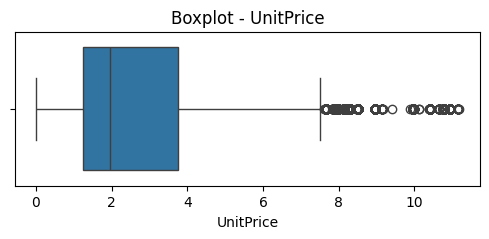

In [ ]:
for col in numeric_cols:
    plt.figure(figsize=(6, 2))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot - {col}')
    plt.show()

* À tôi sẽ khuyến khích bạn loại bỏ bằng cách loại bỏ và gán dẫn có logic qua tứ phân vị(chỉ là đề xuất cải thiện)

In [ ]:
def flag_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[f'{col}_is_outlier'] = (df[col] < lower_bound) | (df[col] > upper_bound)
    return df

In [ ]:
def remove_outliers_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

## d. Nhận xét tổng quan về tập dữ liệu:Đưa ra các đặc điểm nổi bật của dữ liệu dựa trên các phân tích trên.

* Nhận Xét Chung

    * Xu hướng mua sắm: Phân tích các sản phẩm phổ biến và ít phổ biến giúp ta hiểu rõ hơn về xu hướng tiêu dùng. Các sản phẩm bán chạy nhất có thể đại diện cho những gì khách hàng tìm kiếm nhiều, trong khi những sản phẩm ít phổ biến cho thấy những mặt hàng không phù hợp với nhu cầu hiện tại hoặc không được quảng bá đúng cách.

    * Chăm sóc khách hàng: Việc nhận diện những khách hàng phổ biến giúp công ty có thể tập trung vào các chiến lược chăm sóc khách hàng, từ đó xây dựng các chương trình khách hàng thân thiết hoặc các ưu đãi đặc biệt để duy trì mối quan hệ lâu dài.

    * Tiềm năng mở rộng thị trường: Dữ liệu về các quốc gia có cơ sở khách hàng lớn giúp công ty xác định các thị trường tiềm năng. Công ty có thể điều chỉnh chiến lược kinh doanh cho từng quốc gia cụ thể, từ việc tối ưu hóa kênh phân phối đến cải thiện dịch vụ khách hàng.

    * Lợi ích từ phân tích: Các phân tích này không chỉ giúp công ty hiểu rõ về thị trường hiện tại mà còn giúp dự đoán xu hướng tương lai, từ đó đưa ra các quyết định kinh doanh thông minh. Việc xác định sản phẩm bán chạy và khách hàng phổ biến giúp công ty tối ưu hóa nguồn lực và chiến lược marketing của mình.

# 3. Phân tích phân phối xác suất

* Tôi chọn Amount là nhân cột Unitprice với Quantity . Nó phản ánh rất sát tình hình doanh thu thực tế mà việc bán hàng online có phân phối chuẩn không?

In [ ]:
def check_distribution(df)  -> None:
    '''
        Kiểm tra phân phối xác suất của cột Amount (tính từ UnitPrice và Quantity).

        Args:
            df (DataFrame): Dữ liệu cần phân tích.
        Return:
              None

    '''
    # Tính cột Amount
    df['Amount'] = df['UnitPrice'] * df['Quantity']

    # Vẽ histogram với KDE để kiểm tra phân phối
    plt.figure(figsize=(10, 6))
    sns.histplot(df['Amount'], kde=True)
    plt.title('Histogram of Amount')
    plt.show()

    # Kiểm tra phân phối chuẩn bằng Shapiro-Wilk test
    stat, p_value = stats.shapiro(df['Amount'].dropna())
    print(f'Shapiro-Wilk test statistic: {stat}, p-value: {p_value}')

    # Kiểm tra phân phối Exponential bằng KS test
    lambda_exp = 1 / df['Amount'].mean()  # Ước tính tham số của phân phối Exponential
    exp_dist = stats.expon(loc=0, scale=1/lambda_exp)
    ks_stat, ks_p_value = stats.kstest(df['Amount'].dropna(), exp_dist.cdf)
    print(f'KS test with Exponential distribution: {ks_stat}, p-value: {ks_p_value}')


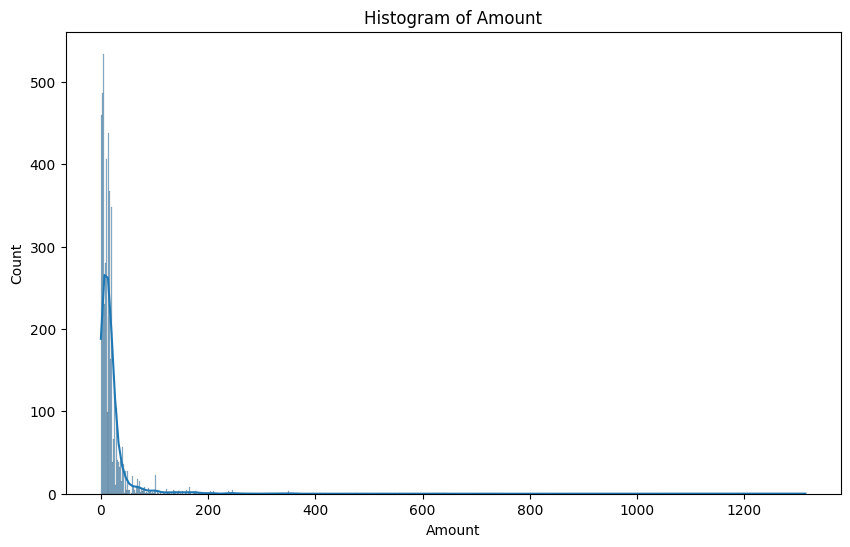

Shapiro-Wilk test statistic: 0.33107047593646166, p-value: 1.4373885960089014e-86
KS test with Exponential distribution: 0.15976044001185674, p-value: 5.960321300147196e-112


In [ ]:
sample_df = df.sample(n=5000, random_state=42)  # Lấy mẫu ngẫu nhiên 5000 bản ghi
check_distribution(sample_df)


Shapiro-Wilk test:

* Statistic = 0.331, p-value ≈ 1.4e-86

* 👉 p-value rất nhỏ → Bác bỏ giả thuyết H₀ (dữ liệu tuân theo phân phối chuẩn).

* ✅ Kết luận: Dữ liệu không tuân theo phân phối chuẩn (Normal distribution).

Kolmogorov-Smirnov test với phân phối Exponential:

* KS statistic = 0.159, p-value ≈ 5.96e-112

* 👉 p-value rất nhỏ → Bác bỏ giả thuyết H₀ (dữ liệu tuân theo phân phối exponential).

* ✅ Kết luận: Dữ liệu cũng không tuân theo phân phối exponential.

Vậy Amount có tuân theo Poisson không?

* Không, bởi vì:

* Amount là giá trị liên tục (liên quan đến tiền), trong khi Poisson chỉ dùng cho biến rời rạc kiểu đếm (số lượng sự kiện).

* Poisson yêu cầu giá trị không âm, nguyên, còn Amount có thể là số thập phân.

### Phản ánh thực tế


* Cột Amount lệch trái rất mạnh, nghĩa là hầu hết đơn hàng có giá trị thấp, nhưng có một số ít đơn hàng giá trị rất cao.

* Đây là điều thường thấy trong dữ liệu bán lẻ: khách hàng thường mua số lượng nhỏ, nhưng đôi khi có người mua sỉ, gây ra outlier.

* Vì không theo phân phối chuẩn, các phân tích thống kê nên dùng các phương pháp phi tham số, hoặc chuẩn hóa/log transform trước khi xử lý.

* Dữ liệu phản ánh thực tế kinh doanh: đa phần giao dịch có giá trị nhỏ, số ít lớn bất thường.

* Có thể là tín hiệu cho việc cần phân tích nhóm khách hàng khác nhau (thường mua lẻ vs mua sỉ).

### Đề xuất cải thiện


* Không thể áp dụng các mô hình giả định phân phối chuẩn

→ Bạn không nên dùng các phương pháp thống kê như kiểm định t, hồi quy tuyến tính truyền thống, v.v. nếu không xử lý thêm.

* Dữ liệu có thể chứa outlier, lệch mạnh hoặc phân phối phức tạp

→ Ví dụ như Amount thường lệch trái và có nhiều giao dịch nhỏ, ít giao dịch cực lớn.

* Cần chuyển đổi dữ liệu hoặc dùng phương pháp phi tham số

→ Có thể áp dụng:

* Log-transform để làm dữ liệu gần chuẩn hơn.

* Dùng các kỹ thuật phi tham số như Spearman, Wilcoxon, hoặc mô hình học máy không giả định phân phối.

* Tôi sẽ ưu tiên dùng Spearman ở câu 5


# 4. Kiểm định giả thuyết

## a. Tìm hiểu và trình bày các kiểm định thống kê: t-test, Chi-square và ANOVA.

1. t-test (Kiểm định t).

* Dùng để so sánh giá trị trung bình giữa hai nhóm.

* Ví dụ: so sánh giá trị Amount trung bình giữa khách hàng ở Anh và Đức.

* Điều kiện: dữ liệu gần phân phối chuẩn hoặc có số lượng mẫu lớn (theo định lý trung tâm giới hạn).

2. Chi-square test (Kiểm định Chi bình phương)

* Dùng để kiểm tra sự phụ thuộc giữa hai biến phân loại (categorical).

* Ví dụ: khách hàng đến từ các quốc gia khác nhau có xu hướng hủy đơn hàng khác nhau không?

3. ANOVA (Analysis of Variance)

* Dùng để so sánh trung bình nhiều hơn 2 nhóm.

* Ví dụ: so sánh Amount trung bình giữa 3 quốc gia khác nhau

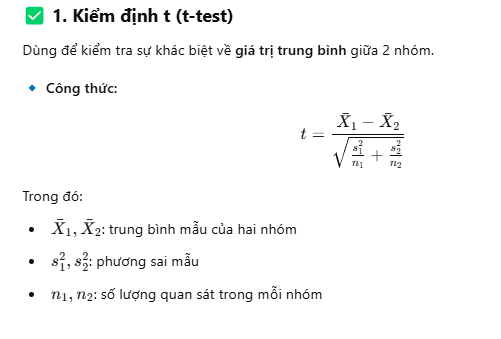

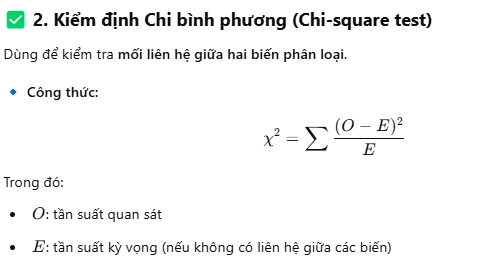

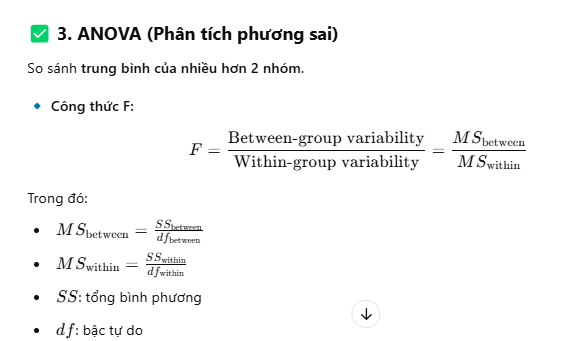

## b. Đề xuất một câu hỏi nghiên cứu có thể kiểm định bằng dữ liệu cho bộ dữ liệu đã chọn (ví dụ: "Có sự khác biệt về điểm trung bình giữa sinh viên nam và nữ không?"). Áp dụng kiểm định thống kê để trả lời câu hỏi.

* Giả thuyết đặt ra là : "Có sự khác biệt về giá trị đơn hàng trung bình (Amount) giữa khách hàng thuộc các nhóm quốc gia khác nhau hay không ?"

In [ ]:
def perform_statistical_tests(df) -> None:
    '''
    Hàm thực hiện kiểm định thống kê ANOVA, T-test và Chi-square trên bộ dữ liệu.

    Args:
        df (DataFrame): Bộ dữ liệu chứa các cột 'UnitPrice', 'Quantity' và 'Country' để phân tích.

    Return:
        None
    '''
    # Tính toán cột 'Amount' từ 'UnitPrice' và 'Quantity'
    df['Amount'] = df['UnitPrice'] * df['Quantity']
    df = df[df['Amount'] > 0]  # Loại bỏ những giá trị 'Amount' <= 0
    df = df[df['Country'].isin(['United Kingdom', 'Germany', 'France'])]  # Lọc ra 3 quốc gia cụ thể

    # Tạo cột phân loại mức giá trị đơn hàng cho kiểm định Chi-square (High/Low)
    median_amount = df['Amount'].median()  # Tính trung vị của Amount
    df['AmountLevel'] = df['Amount'].apply(lambda x: 'High' if x > median_amount else 'Low')  # Phân loại

    # Kiểm định ANOVA: So sánh trung bình 'Amount' giữa các quốc gia (UK, Germany, France)
    uk = df[df['Country'] == 'United Kingdom']['Amount']
    de = df[df['Country'] == 'Germany']['Amount']
    fr = df[df['Country'] == 'France']['Amount']
    f_stat, p_anova = stats.f_oneway(uk, de, fr)  # Kiểm định ANOVA
    print(f"ANOVA test: F = {f_stat:.4f}, p-value = {p_anova:.4e}")

    # Kiểm định T-test: So sánh giá trị đơn hàng trung bình giữa UK và Germany
    t_stat, p_ttest = stats.ttest_ind(uk, de, equal_var=False)  # Welch's t-test (không giả định phương sai bằng nhau)
    print(f"T-test (UK vs DE): t = {t_stat:.4f}, p-value = {p_ttest:.4e}")

    # Kiểm định Chi-square: Liên hệ giữa quốc gia và mức đơn hàng (High/Low)
    contingency_table = pd.crosstab(df['Country'], df['AmountLevel'])  # Tạo bảng chéo giữa quốc gia và mức Amount
    chi2, p_chi, dof, expected = stats.chi2_contingency(contingency_table)  # Kiểm định Chi-square
    print(f"Chi-square test: Chi2 = {chi2:.4f}, p-value = {p_chi:.4e}, dof = {dof}")

    # Vẽ biểu đồ Boxplot để so sánh giá trị đơn hàng giữa các quốc gia
    plt.figure(figsize=(8,5))
    sns.boxplot(x='Country', y='Amount', data=df)
    plt.title('Giá trị đơn hàng theo Quốc gia')
    plt.show()

    # Vẽ Heatmap cho bảng chéo (Chi-square test)
    sns.heatmap(contingency_table, annot=True, cmap='Blues', fmt='d')
    plt.title('Bảng chéo Quốc gia vs Mức Amount')
    plt.show()


ANOVA test: F = 20.3565, p-value = 1.4447e-09
T-test (UK vs DE): t = -12.8402, p-value = 1.6643e-37
Chi-square test: Chi2 = 5702.3192, p-value = 0.0000e+00, dof = 2


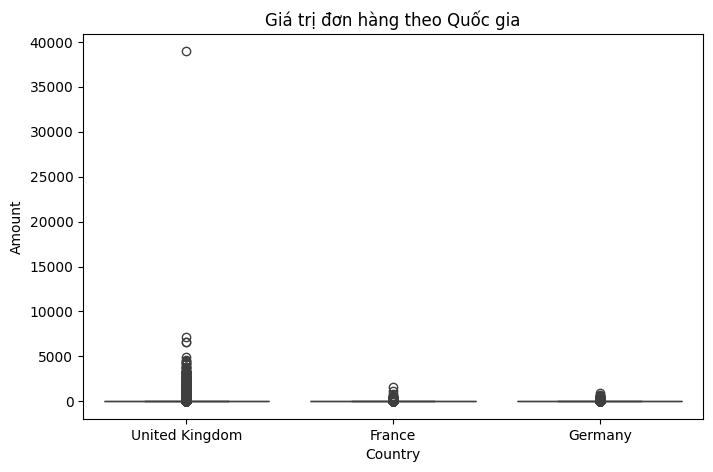

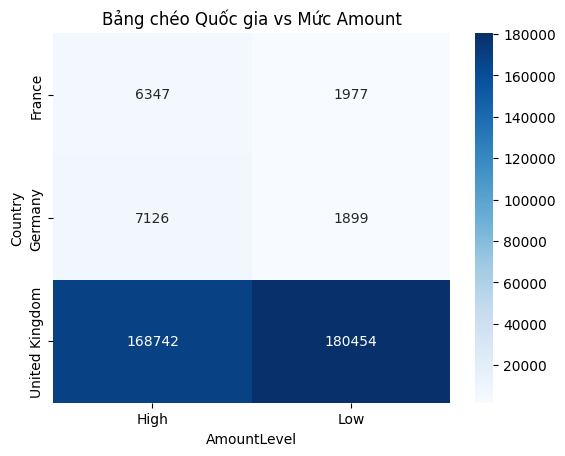

In [ ]:
 perform_statistical_tests(df)

* Tôi thấy có giá trị bất thường cần loại bỏ

In [ ]:
def perform_statistical_tests(df) -> None:
    '''
    Hàm thực hiện kiểm định thống kê ANOVA, T-test và Chi-square trên bộ dữ liệu.

    Args:
        df (DataFrame): Bộ dữ liệu chứa các cột 'UnitPrice', 'Quantity' và 'Country' để phân tích.

    Return:
        None
    '''
    # Tính toán cột 'Amount' từ 'UnitPrice' và 'Quantity'
    df['Amount'] = df['UnitPrice'] * df['Quantity']
    df = df[df['Amount'] > 0]  # Loại bỏ những giá trị 'Amount' <= 0
    df = df[df['Country'].isin(['United Kingdom', 'Germany', 'France'])]  # Lọc ra 3 quốc gia cụ thể

    # Lọc các giá trị ngoại lai, ví dụ: loại bỏ những giá trị 'Amount' > 35000 (hoặc giá trị tùy chỉnh)
    df = df[df['Amount'] <= 35000]

    # Tạo cột phân loại mức giá trị đơn hàng cho kiểm định Chi-square (High/Low)
    median_amount = df['Amount'].median()  # Tính trung vị của Amount
    df['AmountLevel'] = df['Amount'].apply(lambda x: 'High' if x > median_amount else 'Low')  # Phân loại

    # Kiểm định ANOVA: So sánh trung bình 'Amount' giữa các quốc gia (UK, Germany, France)
    uk = df[df['Country'] == 'United Kingdom']['Amount']
    de = df[df['Country'] == 'Germany']['Amount']
    fr = df[df['Country'] == 'France']['Amount']
    f_stat, p_anova = stats.f_oneway(uk, de, fr)  # Kiểm định ANOVA
    print(f"ANOVA test: F = {f_stat:.4f}, p-value = {p_anova:.4e}")

    # Kiểm định T-test: So sánh giá trị đơn hàng trung bình giữa UK và Germany
    t_stat, p_ttest = stats.ttest_ind(uk, de, equal_var=False)  # Welch's t-test (không giả định phương sai bằng nhau)
    print(f"T-test (UK vs DE): t = {t_stat:.4f}, p-value = {p_ttest:.4e}")

    # Kiểm định Chi-square: Liên hệ giữa quốc gia và mức đơn hàng (High/Low)
    contingency_table = pd.crosstab(df['Country'], df['AmountLevel'])  # Tạo bảng chéo giữa quốc gia và mức Amount
    chi2, p_chi, dof, expected = stats.chi2_contingency(contingency_table)  # Kiểm định Chi-square
    print(f"Chi-square test: Chi2 = {chi2:.4f}, p-value = {p_chi:.4e}, dof = {dof}")

    # Vẽ biểu đồ Boxplot để so sánh giá trị đơn hàng giữa các quốc gia
    plt.figure(figsize=(8,5))
    sns.boxplot(x='Country', y='Amount', data=df)
    plt.title('Giá trị đơn hàng theo Quốc gia')
    plt.show()

    # Vẽ Heatmap cho bảng chéo (Chi-square test)
    sns.heatmap(contingency_table, annot=True, cmap='Blues', fmt='d')
    plt.title('Bảng chéo Quốc gia vs Mức Amount')
    plt.show()


ANOVA test: F = 43.2741, p-value = 1.6164e-19
T-test (UK vs DE): t = -13.4648, p-value = 5.3015e-41
Chi-square test: Chi2 = 5703.6635, p-value = 0.0000e+00, dof = 2


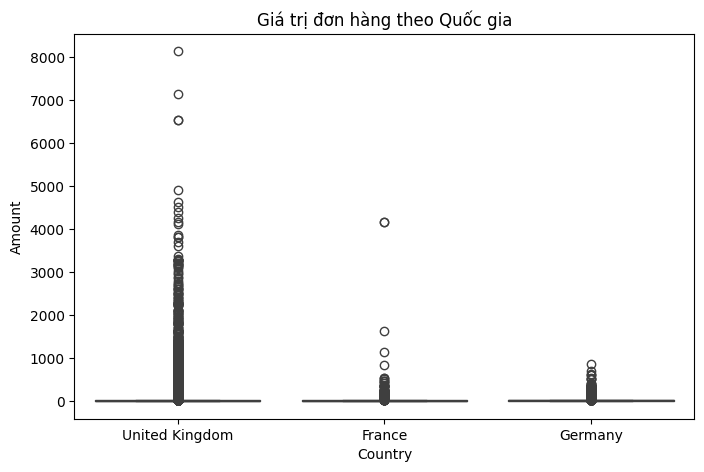

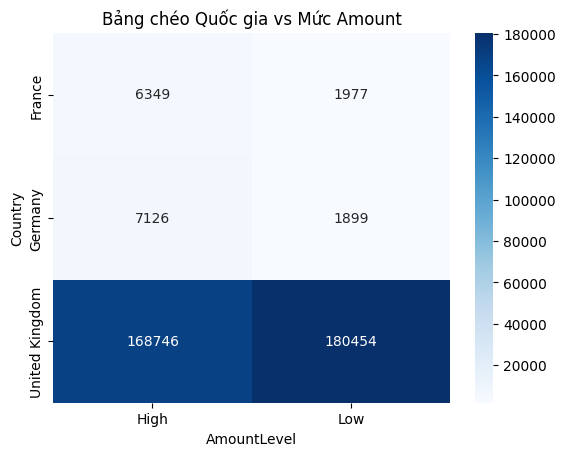

In [ ]:
 perform_statistical_tests(df)

* ANOVA được dùng để kiểm tra sự khác biệt giữa ba nhóm quốc gia (UK, Germany, France).

* T-test so sánh sự khác biệt trung bình giữa hai quốc gia (UK và Germany).

* Chi-square kiểm tra sự phụ thuộc giữa quốc gia và phân loại mức giá trị đơn hàng (High/Low).

## c. Giải thích kết quả kiểm định.

ANOVA:

* Kết quả F = 20.3565, p-value = 1.4447e-09 cho thấy có sự khác biệt đáng kể giữa ba nhóm quốc gia về giá trị đơn hàng. Ví dụ, khách hàng từ UK có thể chi tiêu nhiều hơn so với khách hàng từ Germany hoặc France.

T-test (UK vs DE):

* Kết quả t = -12.8402, p-value = 1.6643e-37 chỉ ra rằng giá trị đơn hàng trung bình của khách hàng từ UK và Germany có sự khác biệt rất lớn. Nếu bạn so sánh giá trị đơn hàng của hai nhóm này, bạn sẽ thấy khách hàng từ UK có xu hướng chi tiêu cao hơn.

Chi-square:

* Kết quả Chi2 = 5702.3192, p-value = 0.0000e+00 cho thấy rằng quốc gia có mối quan hệ mạnh với mức độ giá trị đơn hàng (High/Low). Ví dụ, khách hàng từ UK có thể có tỷ lệ "High" (giá trị đơn hàng cao) cao hơn so với khách hàng từ các quốc gia khác.

Từ các kết quả trên, chúng ta có thể kết luận rằng giả thuyết ban đầu là hợp lý.

# 5. Phân tích tương quan giữa các biến

## a. Tìm hiểu và trình bày hệ số tương quan Pearson hoặc Spearman.

* Hệ số tương quan Pearson: Được sử dụng để đo lường mối quan hệ tuyến tính giữa hai biến số. Giá trị của hệ số này nằm trong khoảng từ -1 đến 1. Nếu giá trị gần 1, có mối quan hệ mạnh mẽ và dương, còn nếu gần -1, mối quan hệ là âm. Nếu bằng 0, không có mối quan hệ tuyến tính.

* Hệ số tương quan Spearman: Được sử dụng khi mối quan hệ không phải là tuyến tính hoặc khi các biến không có phân phối chuẩn. Spearman đo lường mối quan hệ đơn điệu (monotonic) giữa các biến số. Giá trị cũng nằm trong khoảng từ -1 đến 1.

Giả sử bạn có dữ liệu về giá trị đơn hàng (Amount) và số lượng (Quantity) của các sản phẩm bán ra. Bạn muốn tìm hiểu mối quan hệ giữa hai yếu tố này.

Hệ số tương quan Pearson:

* Nếu hệ số tương quan Pearson giữa Quantity và Amount là 0.8, điều này có nghĩa là có mối quan hệ tuyến tính mạnh mẽ và dương: khi số lượng sản phẩm bán ra tăng, giá trị đơn hàng cũng có xu hướng tăng.

Hệ số tương quan Spearman:

* Nếu hệ số Spearman giữa Quantity và Amount là 0.7, điều này có nghĩa là khi số lượng sản phẩm bán ra tăng, giá trị đơn hàng cũng có xu hướng tăng, mặc dù không phải là mối quan hệ tuyến tính.










## b. Áp dụng tính hệ số tương quan Pearson hoặc Spearman giữa các biến số trong bộ dữ liệu đã chọn.

In [ ]:
def calculate_corr(df, cols) -> None:
    '''
        Tính toán hệ số tương quan Pearson và Spearman giữa các cột trong DataFrame.

        Args:
            df (DataFrame): Dữ liệu cần tính toán.
            cols (list): Danh sách các cột cần tính toán tương quan.

        Returns:
            None
    '''
    # Tính toán hệ số tương quan Pearson và Spearman
    pearson_corr = df[cols].corr(method='pearson')
    spearman_corr = df[cols].corr(method='spearman')

    # In kết quả tương quan
    print("Pearson Correlation Matrix:\n", pearson_corr)
    print("Spearman Correlation Matrix:\n", spearman_corr)


In [ ]:
calculate_corr(df, ['UnitPrice', 'Quantity'])

Pearson Correlation Matrix:
            UnitPrice  Quantity
UnitPrice   1.000000 -0.031215
Quantity   -0.031215  1.000000
Spearman Correlation Matrix:
            UnitPrice  Quantity
UnitPrice   1.000000 -0.414734
Quantity   -0.414734  1.000000


## c. Sử dụng biểu đồ scatter plot, heatmap để trực quan hóa mối quan hệ giữa các biến.

In [ ]:
def plot_corr(df, cols) -> None:
    '''
        Sử dụng biểu đồ scatter plot, heatmap để trực quan hóa mối quan hệ giữa các biến.

        Args:
            df (DataFrame): Dữ liệu cần tính toán.
            cols (list): Danh sách các cột cần tính toán tương quan.

        Returns:
            None
    '''
    # Tính toán hệ số tương quan Pearson và Spearman
    pearson_corr = df[cols].corr(method='pearson')
    spearman_corr = df[cols].corr(method='spearman')

    # Vẽ scatter plot
    sns.pairplot(df[cols])
    plt.suptitle('Pairwise Scatter Plots', y=1.02)
    plt.show()

    # Vẽ heatmap cho Pearson Correlation
    plt.figure(figsize=(8, 6))
    sns.heatmap(pearson_corr, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title("Pearson Correlation Heatmap")
    plt.show()

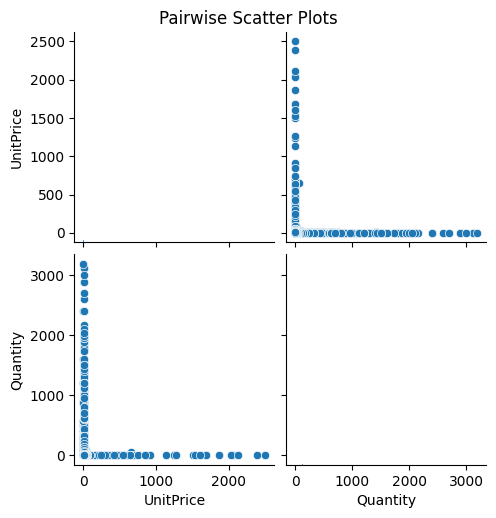

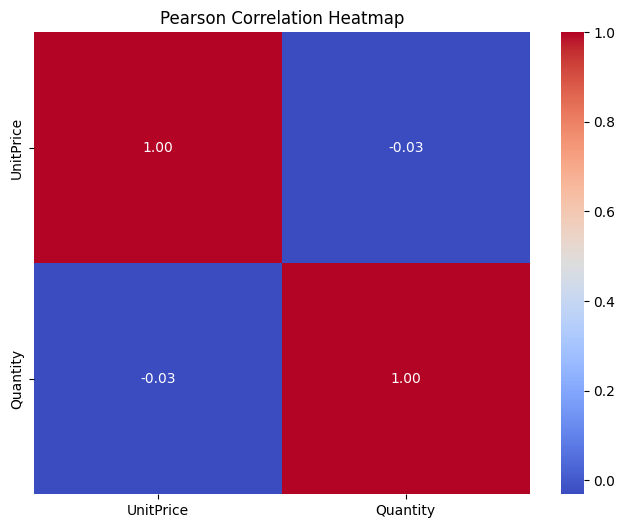

In [ ]:
plot_corr(df, ['UnitPrice', 'Quantity'])

## d. Đưa ra nhận xét về ý nghĩa thực tiễn của các mối tương quan.

Dựa trên ma trận tương quan:

Pearson Correlation giữa UnitPrice và Quantity là -0.0312, cho thấy mối quan hệ gần như không có giữa hai biến này. Điều này có thể chỉ ra rằng giá của sản phẩm không ảnh hưởng mạnh đến số lượng bán ra.

Spearman Correlation giữa UnitPrice và Quantity là -0.4147, cho thấy một mối quan hệ nghịch chiều yếu. Khi giá trị của sản phẩm tăng, số lượng bán có thể giảm, nhưng mối quan hệ này không hoàn toàn tuyến tính.

Nhận xét thực tế: Có thể có các yếu tố khác ảnh hưởng đến số lượng bán ngoài giá trị sản phẩm, và mối quan hệ giữa giá và số lượng bán có thể không hoàn toàn tuyến tính

# Cải thiện thêm phần thống kê (Muốn đi sâu hơn về khía cạnh hành vi của khách hàng)

In [ ]:
# Đảm bảo cột 'Date' là kiểu datetime
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Tính tổng doanh thu ('Amount') theo ngày
revenue_by_date = df.groupby('InvoiceDate')['Amount'].sum().reset_index()

# Hiển thị bảng doanh thu theo ngày
print(revenue_by_date)


              InvoiceDate  Amount
0     2010-12-01 08:26:00  139.12
1     2010-12-01 08:28:00   22.20
2     2010-12-01 08:34:00  348.78
3     2010-12-01 08:35:00   17.85
4     2010-12-01 08:45:00  855.86
...                   ...     ...
20455 2011-12-09 12:23:00  124.60
20456 2011-12-09 12:25:00  140.64
20457 2011-12-09 12:31:00  329.05
20458 2011-12-09 12:49:00  339.20
20459 2011-12-09 12:50:00  249.45

[20460 rows x 2 columns]


In [ ]:
# date, month, week, time
# Convert 'InvoiceDate' column to datetime format
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Create 'date', 'month', 'week', and 'time' columns
df['date'] = df['InvoiceDate'].dt.strftime('%m/%d/%Y')
df['month'] = df['InvoiceDate'].dt.strftime('%B')
df['week'] = df['InvoiceDate'].dt.strftime('%A')
df['time'] = df['InvoiceDate'].dt.strftime('%H')

In [ ]:
df.head()


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,date,month,week,time
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,12/01/2010,December,Wednesday,08
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,12/01/2010,December,Wednesday,08
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,12/01/2010,December,Wednesday,08
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,12/01/2010,December,Wednesday,08
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,12/01/2010,December,Wednesday,08


In [ ]:
df["TotalPrice"] = df["Quantity"] * df["UnitPrice"]


In [ ]:
df.groupby("InvoiceNo").agg({"TotalPrice": "sum"}).sort_values("TotalPrice", ascending=False).head()

,TotalPrice
InvoiceNo,
581483,168469.60
541431,77183.60
556444,38970.00
567423,31698.16
556917,22775.93


In [ ]:
df.drop(df[df['UnitPrice'] == 0.0].index, inplace=True)

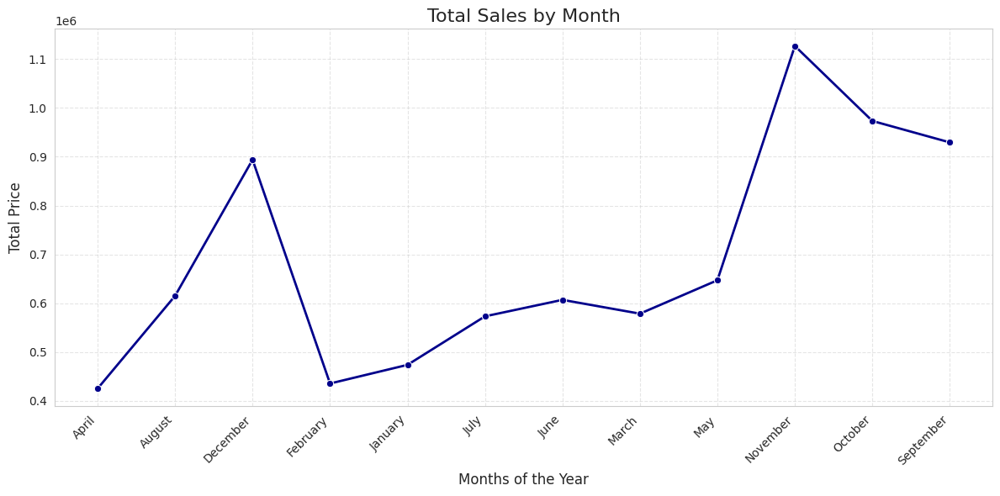

In [ ]:
# Calculate the total sales by month
df_months = df.groupby('month').agg({'TotalPrice': 'sum'}).reset_index()

# Set the style
sns.set_style("whitegrid")

# Plot the line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_months, x='month', y='TotalPrice', marker='o', color='darkblue', linewidth=2)
plt.title('Total Sales by Month', fontsize=16)
plt.xlabel('Months of the Year', fontsize=12)
plt.ylabel('Total Price', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.5)  # Add grid lines
plt.tight_layout()
plt.show()

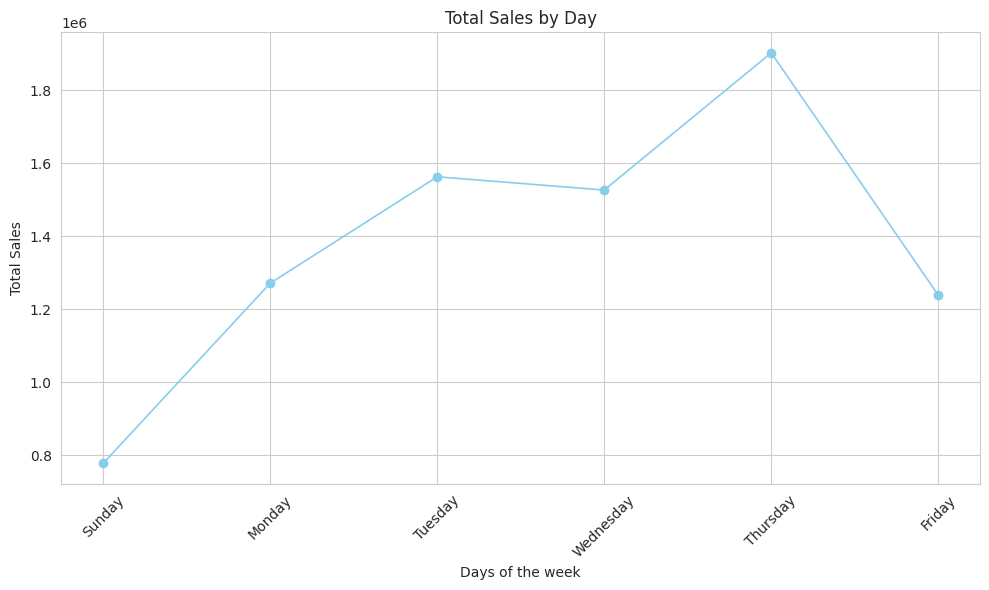

In [ ]:
daywise = df.groupby('week').agg({'TotalPrice': 'sum'}).reset_index()

# Reordering the table according to weekdays
daywise['week'] = pd.Categorical(daywise['week'], categories=["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], ordered=True)
daywise = daywise.sort_values('week')

# Line plot
plt.figure(figsize=(10, 6))
plt.plot(daywise['week'], daywise['TotalPrice'], marker='o', color='skyblue', linewidth=1.2, markersize=6)
plt.title('Total Sales by Day')
plt.xlabel('Days of the week')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

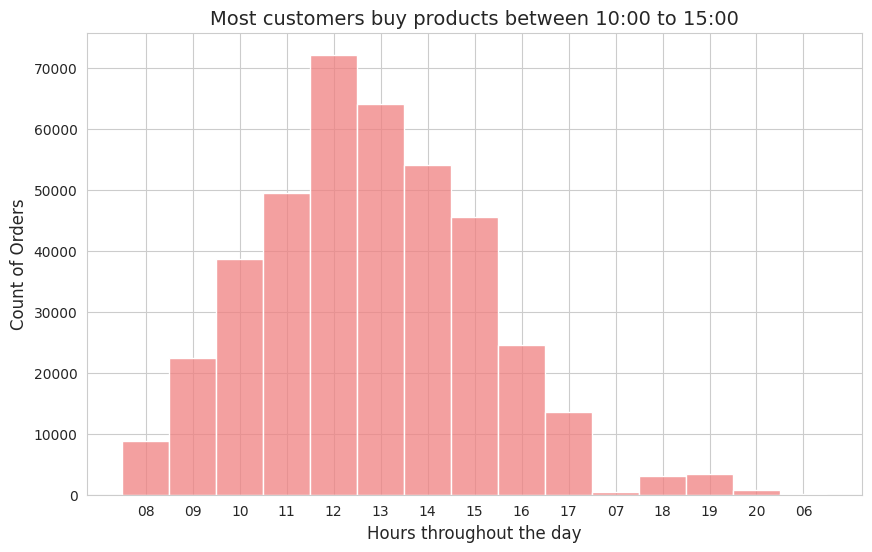

In [ ]:
sns.set_style("whitegrid")

# Plotting the histogram
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='time', bins=24, color='lightcoral', kde=False)
plt.xlabel('Hours throughout the day', fontsize=12)
plt.ylabel('Count of Orders', fontsize=12)
plt.title('Most customers buy products between 10:00 to 15:00', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True)
plt.show()

RFM là một phương pháp được sử dụng để phân tích và phân đoạn hành vi của khách hàng. RFM là viết tắt của  Recency, Frequency, and Monetary Value.

* Recency: Nó đề cập đến cách gần đây một khách hàng đã mua hàng. Nhiều khách hàng gần đây được coi là có giá trị hơn.

* Frequency: Nó cho biết tần suất khách hàng thực hiện mua hàng trong một khung thời gian nhất định. Khách hàng thực hiện mua hàng thường xuyên thường được coi là trung thành hơn hoặc tham gia.

* Monetary Value: Nó đại diện cho tổng giá trị mua hàng của khách hàng trong một khoảng thời gian cụ thể. Khách hàng chi nhiều tiền hơn thường có giá trị hơn cho doanh nghiệp.

* Phân tích RFM được thực hiện bằng cách gán điểm hoặc xếp hạng cho mỗi khách hàng dựa trên ba số liệu này. Khách hàng sau đó được nhóm thành các phân đoạn dựa trên điểm RFM của họ. Các phân khúc này có thể được sử dụng để điều chỉnh các chiến lược và chiến dịch tiếp thị để nhắm mục tiêu tốt hơn và phục vụ nhu cầu của các nhóm khách hàng khác nhau.

* Ví dụ, khách hàng có điểm RFM cao (gần đây, thường xuyên, giá trị tiền tệ cao) có thể được cung cấp các chương trình khách hàng thân thiết hoặc các ưu đãi đặc biệt để khuyến khích mua hàng lặp lại. Mặt khác, khách hàng có điểm RFM thấp (tần số thấp, giá trị tiền tệ thấp) có thể được nhắm mục tiêu với các chiến dịch tái tham gia để khuyến khích họ mua thêm.

In [ ]:
today_date = df['InvoiceDate'].max() + pd.Timedelta(days=1)


In [ ]:
df = df[df['TotalPrice'] > 0]

In [ ]:
df_rfm = df.groupby('CustomerID').agg(
        {'InvoiceDate': lambda date: (today_date - date.max()).days,
         'InvoiceNo': lambda num: num.nunique(),
         'TotalPrice': lambda price: price.sum()})

In [ ]:
df_rfm.columns = ['recency', 'frequency', "monetary"]  # Rename the aggregated columns
df_rfm.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,4338.0,92.536422,100.014169,1.00,18.0000,51.00,142.0000,374.00
frequency,4338.0,4.272015,7.697998,1.00,1.0000,2.00,5.0000,209.00
monetary,4338.0,2048.688081,8985.230220,3.75,306.4825,668.57,1660.5975,280206.02


In [ ]:
# Calculate recency score based on quantiles, assigning labels from 1 to 5 (1 being lowest recency)
df_rfm["recency_score"] = pd.qcut(df_rfm['recency'], 5, labels=[5, 4, 3, 2, 1])

# Calculate frequency score based on rank quantiles, assigning labels from 1 to 5 (1 being lowest frequency)
df_rfm["frequency_score"] = pd.qcut(df_rfm["frequency"].rank(method="first"), 5, labels=[1, 2, 3, 4, 5])

df_rfm.head()

,recency,frequency,monetary,recency_score,frequency_score
CustomerID,,,,,
12346.0,326,1,77183.60,1,1
12347.0,2,7,4310.00,5,5
12348.0,75,4,1797.24,2,4
12349.0,19,1,1757.55,4,1
12350.0,310,1,334.40,1,1


In [ ]:
# Combine recency and frequency scores to create RFM segment
df_rfm['segment'] = df_rfm['recency_score'].astype(str) + df_rfm['frequency_score'].astype(str)
df_rfm.head()

,recency,frequency,monetary,recency_score,frequency_score,segment
CustomerID,,,,,,
12346.0,326,1,77183.60,1,1,11
12347.0,2,7,4310.00,5,5,55
12348.0,75,4,1797.24,2,4,24
12349.0,19,1,1757.55,4,1,41
12350.0,310,1,334.40,1,1,11


 Cách hiểu mã RFM:

Ví dụ mã 25:

2: Recency (R) — mức trung bình (vừa mới mua gần đây).

5: Frequency/Monetary — mua thường xuyên hoặc chi tiêu nhiều

📊 Ý nghĩa từng regex:

[1-2][1-2]	'hibernating'	R và F/M đều thấp → lâu không mua, ít mua → cần đánh thức.

[1-2][3-4]	'at_risk'	Từng mua khá nhiều, nhưng gần đây im ắng → có nguy cơ rời bỏ.

[1-2] 5	'cant_loose'	Chi tiêu/mua rất nhiều, nhưng đã lâu không mua → không thể để mất họ.

3 [1-2]	'about_to_sleep'	Mua ít, không quá xa nhưng cũng không gần đây → sắp "ngủ quên".

3 3	'need_attention'	Ổn định, không nổi bật → cần chăm sóc thêm.

[3-4][4-5]	'loyal_customers'	Mua gần đây và thường xuyên → trung thành.

4 1	'promising'	Gần đây có mua nhưng tần suất còn thấp → có tiềm năng.

5 1	'new_customers'	Mới mua lần đầu gần đây → khách mới.

[4-5] [2-3]	'potential_loyalists'	Không quá gần đây nhưng mua thường xuyên → có thể thành trung thành.

5 [4-5]	'champions'	Gần đây, thường xuyên, chi tiêu cao → khách VIP.

In [ ]:
# Mapping of segments to their corresponding customer segments
seg_map = {
r'[1-2][1-2]': 'hibernating',
r'[1-2][3-4]': 'at_risk',
r'[1-2]5': 'cant_loose',
r'3[1-2]': 'about_to_sleep',
r'33': 'need_attention',
r'[3-4][4-5]': 'loyal_customers',
r'41': 'promising',
r'51': 'new_customers',
r'[4-5][2-3]': 'potential_loyalists',
r'5[4-5]': 'champions'
    }

# Map RFM segments to corresponding customer segments using predefined seg_map
df_rfm['segment'] = df_rfm['segment'].replace(seg_map, regex=True)

# Keep only relevant columns and return the resulting dataframe
df_rfm = df_rfm[["recency", "frequency", "monetary", "segment"]]

df_rfm.index = df_rfm.index.astype(int)  # Convert index to integer
df_rfm.head()

,recency,frequency,monetary,segment
CustomerID,,,,
12346,326,1,77183.60,hibernating
12347,2,7,4310.00,champions
12348,75,4,1797.24,at_risk
12349,19,1,1757.55,promising
12350,310,1,334.40,hibernating


In [ ]:
# Get the top 10 most preferred products
segments = df_rfm['segment'].value_counts()

# Create the bar plot
fig = px.bar(x=segments.index,
             y=segments.values,
             color=segments.index,
             text=segments.values,
             title="RFM Segments",
             labels={'x': 'Product', 'y': 'Count'})

# Update layout for better appearance
fig.update_layout(
    xaxis_title="Segment",
    yaxis_title="Count",
    font=dict(size=15, family="Arial"),
    title_font=dict(size=20, family="Arial")
)

# Show the plot
fig.show()

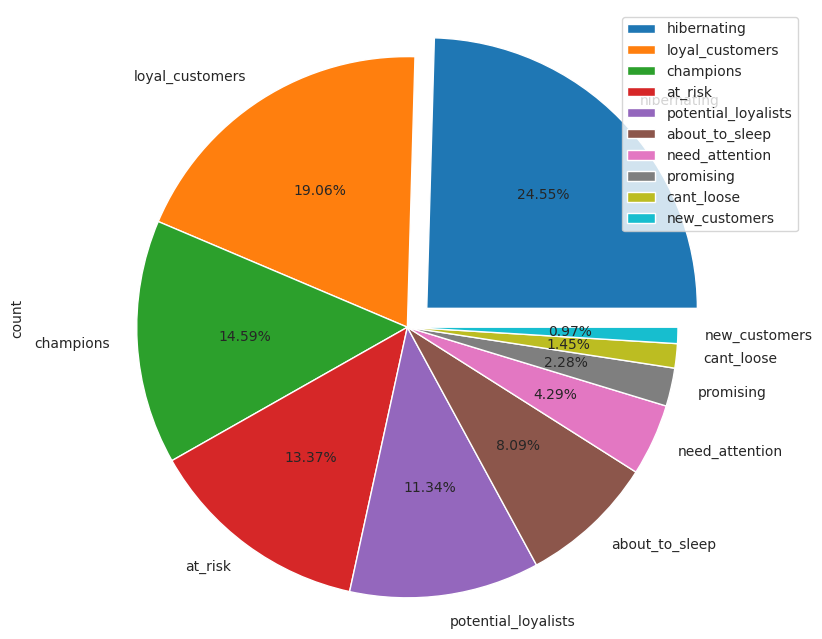

In [ ]:
plt.figure(figsize = (10, 8), )
explode = (0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0)

segments.plot(kind = 'pie',
            color=segments.index,
            explode = explode,
            autopct = '%1.2f%%')
plt.axis('equal')
plt.legend(labels = segments.index, loc = "best")
plt.show()

<ipython-input-126-a14fbd4e2fb0>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




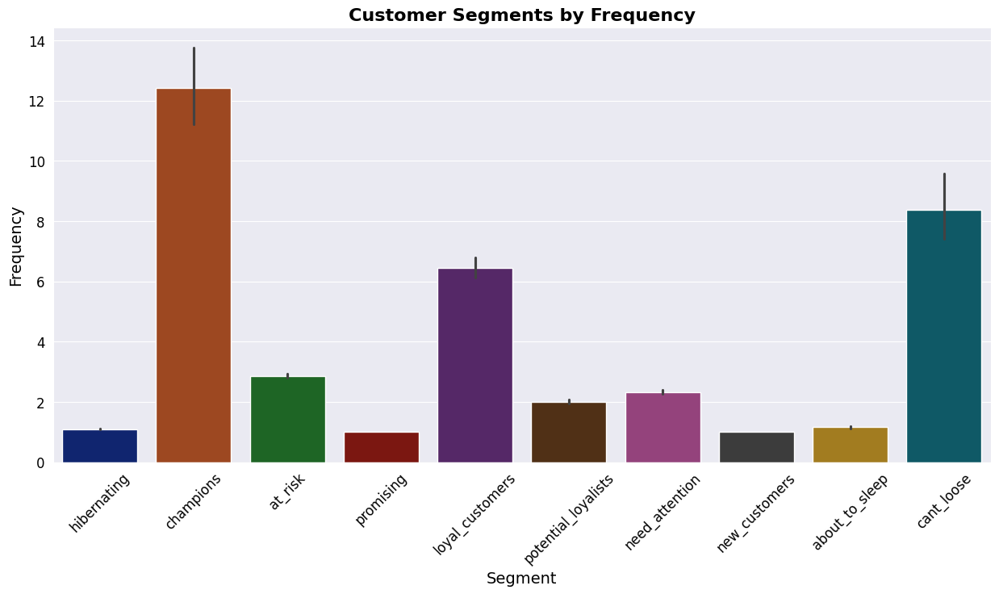

In [ ]:
# Set style
sns.set_style("darkgrid")

# Set color palette
colors = sns.color_palette("dark")

# Create the plot
plt.figure(figsize=(15, 7))
sns.barplot(x="segment", y="frequency", data=df_rfm, palette=colors)
plt.title("Customer Segments by Frequency", color='black', fontsize=16, fontweight='bold')
plt.xlabel("Segment", color='black', fontsize=14)
plt.ylabel("Frequency", color='black', fontsize=14)
plt.xticks(rotation=45, color='black', fontsize=12)
plt.yticks(color='black', fontsize=12)
plt.show()

In [ ]:
df_rfm[["segment","recency", "frequency", "monetary"]].groupby("segment").agg(["mean", "count","sum"])

recency                frequency              \
                           mean count     sum       mean count   sum   
segment                                                                
about_to_sleep        53.504274   351   18780   1.162393   351   408   
at_risk              155.062069   580   89936   2.863793   580  1661   
cant_loose           132.428571    63    8343   8.380952    63   528   
champions              5.876777   633    3720  12.413902   633  7858   
hibernating          217.897653  1065  232061   1.101408  1065  1173   
loyal_customers       33.469166   827   27679   6.458283   827  5341   
need_attention        53.064516   186    9870   2.327957   186   433   
new_customers          6.857143    42     288   1.000000    42    42   
potential_loyalists   17.123984   492    8425   2.010163   492   989   
promising             23.444444    99    2321   1.000000    99    99   

                        monetary                     
                            mean count          sum  
segment                                              
about_to_sleep        458.997464   351   161108.110  
at_risk              1072.889864   580   622276.121  
cant_loose           2790.101429    63   175776.390  
champions            6843.160521   633  4331720.610  
hibernating           486.687467  1065   518322.152  
loyal_customers      2848.333363   827  2355571.691  
need_attention        884.239516   186   164468.550  
new_customers         385.022381    42    16170.940  
potential_loyalists  1030.109004   492   506813.630  
promising             353.340404    99    34980.700

Customer Segmentation Analysis and Recommendations

About to Sleep

* Mean Recency: 53.504274 days (351 customers)

* Mean Frequency: 1.162393 (408 purchases)

* Mean Monetary Value: 458.997464 (Total: 161,108.110)

Recommendations:

* Offer loyalty rewards or VIP programs to further incentivize their frequent purchases.

* Provide exclusive offers or early access to new products/services to maintain their engagement.

At Risk

* Mean Recency: 155.062069 days (580 customers)

* Mean Frequency: 3.074 (1661 purchases)

* Mean Monetary Value: 1072.889864 (Total:622,276.121)

Recommendations:

* Implement targeted re-engagement campaigns to remind them of your value proposition.

* Offer personalized discounts or promotions to encourage repeat purchases.

New Customers

* Mean Recency: 6.857143 days (42 customers)

* Mean Frequency: 1.000 (42 purchases)

* Mean Monetary Value: 385.022381 (Total:16,170.940)

Recommendations:

* Welcome them with a special discount or promotion for their next purchase to encourage repeat business.

* Implement an onboarding email series to introduce them to your products/services.

Potential Loyalists

* Mean Recency: 17.123984 days (492 customers)

* Mean Frequency: 2.010163 (989 purchases)

* Mean Monetary Value: 1030.109004 (Total:506,813.630)

Recommendations:

* Offer incentives for increasing their frequency of purchases, such as referral bonuses or points-based rewards.

* Provide personalized product recommendations based on their past purchases to enhance their shopping experience.

Hibernating

* Mean Recency: 217.897653 days (1065 customers)

* Mean Frequency: 1.101408 (1173 purchases)

* Mean Monetary Value: 486.687467 (Total:518,322.152)

Recommendations:

* Reach out with personalized win-back offers or discounts to encourage them to return.

* Conduct surveys or feedback sessions to understand why they stopped purchasing and address any concerns.

* These recommendations are tailored to each segment's behavior and value, aiming to optimize marketing strategies and improve customer retention and satisfaction.

Phân tích và khuyến nghị phân khúc khách hàng

Sắp ngủ

Khuyến nghị:

* Cung cấp phần thưởng lòng trung thành hoặc các chương trình VIP để khuyến khích hơn nữa việc mua hàng thường xuyên của họ.

* Cung cấp ưu đãi độc quyền hoặc truy cập sớm vào các sản phẩm/dịch vụ mới để duy trì sự tham gia của họ.

Có nguy cơ

Khuyến nghị:

* Thực hiện các chiến dịch tái tham gia được nhắm mục tiêu để nhắc nhở họ về đề xuất giá trị của bạn.

* Cung cấp giảm giá cá nhân hoặc khuyến mãi để khuyến khích mua hàng lặp lại.

Khách hàng mới

Khuyến nghị:

* Chào mừng họ với mức giảm giá hoặc khuyến mãi đặc biệt cho giao dịch mua tiếp theo của họ để khuyến khích kinh doanh lặp lại.

* Thực hiện một chuỗi email trên tàu để giới thiệu chúng với các sản phẩm/dịch vụ của bạn.

Những người trung thành tiềm năng

Khuyến nghị:

* Cung cấp các ưu đãi cho việc tăng tần suất mua hàng của họ, chẳng hạn như tiền thưởng giới thiệu hoặc phần thưởng dựa trên điểm.

* Cung cấp các khuyến nghị sản phẩm được cá nhân hóa dựa trên các giao dịch mua trước đây của họ để nâng cao trải nghiệm mua sắm của họ.

Ngủ đông

Khuyến nghị:

* Tiếp cận với các ưu đãi hoặc giảm giá Win-Back được cá nhân hóa để khuyến khích họ trở lại.

* Tiến hành khảo sát hoặc phiên phản hồi để hiểu lý do tại sao họ ngừng mua và giải quyết bất kỳ mối quan tâm nào.

* Những khuyến nghị này được điều chỉnh theo hành vi và giá trị của từng phân khúc, nhằm mục đích tối ưu hóa các chiến lược tiếp thị và cải thiện sự duy trì và hài lòng của khách hàng.

# --------------------------------------------------------------------------------------------------------------------

# Code 1: Adult Dataset

# Load data and import libraries

Mã 1. Adult Income Dataset (Census Income)
* Nguồn: UCI Machine Learning Repository
* Số dòng: ~32,000
* Số biến: 15
* Miêu tả: Dự đoán thu nhập >50K/năm dựa trên thông tin nhân khẩu học.
* Link: https://archive.ics.uci.edu/ml/datasets/adult

Dự án này phân tích tập dữ liệu **Adult Income từ UCI**, nhằm khám phá mối quan hệ giữa các đặc điểm nhân khẩu học như **tuổi, học vấn, nghề nghiệp, giới tính, tình trạng hôn nhân với mức thu nhập.**

Thông qua các biểu đồ trực quan, dự án cung cấp cái nhìn thực tế giúp hiểu rõ hơn về **các yếu tố ảnh hưởng** đến thu nhập, từ đó hỗ trợ **định hướng chính sách và chiến lược phát triển nguồn nhân lực.**

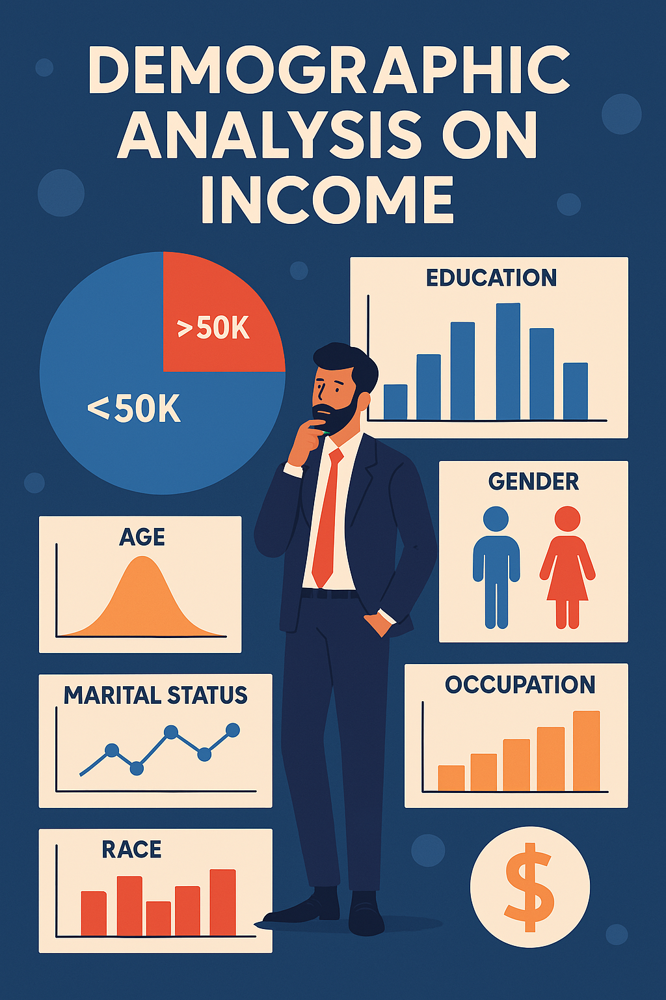

In [12]:
import pandas as pd
import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import norm, expon, poisson, shapiro, kstest, normaltest
from scipy.stats import norm
import numpy as np
import datetime as dt
import kagglehub
import shutil
import os
import pandas as pd
import re

In [13]:
# Tải dataset từ Kaggle
path = kagglehub.dataset_download("wenruliu/adult-income-dataset")

print("Path to dataset files:", path)

# Chuyển tất cả file trong thư mục vừa tải về sang /content/
destination_dir = '/content/'
for file_name in os.listdir(path):
    full_file_path = os.path.join(path, file_name)
    if os.path.isfile(full_file_path):
        shutil.copy(full_file_path, destination_dir)

Path to dataset files: /kaggle/input/adult-income-dataset


In [14]:
# Đọc file CSV vào pandas
csv_path = '/content/adult.csv'
df = pd.read_csv(csv_path)

# 2. Khám phá dữ liệu (Exploratory Data Analysis - EDA)

##a. Tóm tắt thông tin dữ liệu:

In [ ]:
df

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


### Kiểm tra số lượng bản ghi và số lượng biển số.

In [ ]:
so_luong_ban_ghi, so_luong_bien_so = df.shape

print(f"Số lượng bản ghi: {so_luong_ban_ghi}")
print(f"Số lượng biến số: {so_luong_bien_so}")

Số lượng bản ghi: 48842
Số lượng biến số: 15


Các giá trị có trong cột df

In [ ]:
print('workclass',df.workclass.unique())
print('education',df.education.unique())
print('marital-status',df['marital-status'].unique())
print('occupation',df.occupation.unique())
print('relationship',df.relationship.unique())
print('race',df.race.unique())
print('gender',df.gender.unique())
print('native-country',df['native-country'].unique())

workclass ['Private' 'Local-gov' 'Self-emp-not-inc' 'Federal-gov' 'State-gov'
 'Self-emp-inc' 'Without-pay']
education ['11th' 'HS-grad' 'Assoc-acdm' 'Some-college' '10th' 'Prof-school'
 '7th-8th' 'Bachelors' 'Masters' '5th-6th' 'Assoc-voc' '9th' 'Doctorate'
 '12th' '1st-4th' 'Preschool']
marital-status ['Never-married' 'Married-civ-spouse' 'Widowed' 'Separated' 'Divorced'
 'Married-spouse-absent' 'Married-AF-spouse']
occupation ['Machine-op-inspct' 'Farming-fishing' 'Protective-serv' 'Other-service'
 'Prof-specialty' 'Craft-repair' 'Adm-clerical' 'Exec-managerial'
 'Tech-support' 'Sales' 'Priv-house-serv' 'Transport-moving'
 'Handlers-cleaners' 'Armed-Forces']
relationship ['Own-child' 'Husband' 'Not-in-family' 'Unmarried' 'Wife' 'Other-relative']
race ['Black' 'White' 'Other' 'Amer-Indian-Eskimo' 'Asian-Pac-Islander']
gender ['Male' 'Female']
native-country ['United-States' 'Peru' 'Guatemala' 'Mexico' 'Dominican-Republic'
 'Ireland' 'Germany' 'Philippines' 'Thailand' 'Haiti' 'El-Salv

### Kiểu dữ liệu của từng biến.

In [ ]:
print("\nThông tin kiểu dữ liệu:")
print(df.info())


Thông tin kiểu dữ liệu:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              48842 non-null  int64 
 1   workclass        48842 non-null  object
 2   fnlwgt           48842 non-null  int64 
 3   education        48842 non-null  object
 4   educational-num  48842 non-null  int64 
 5   marital-status   48842 non-null  object
 6   occupation       48842 non-null  object
 7   relationship     48842 non-null  object
 8   race             48842 non-null  object
 9   gender           48842 non-null  object
 10  capital-gain     48842 non-null  int64 
 11  capital-loss     48842 non-null  int64 
 12  hours-per-week   48842 non-null  int64 
 13  native-country   48842 non-null  object
 14  income           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB
None


* age: Tuổi cá nhân (số nguyên).  
* workclass: Loại hình làm việc, như công chức, tư nhân... (chuỗi).  
* fnlwgt: Trọng số thống kê dân số (số nguyên).  
* education: Trình độ học vấn, như Bachelors, HS-grad... (chuỗi).  
* educational-num: Mã số tương ứng với học vấn (số nguyên).
<br><br>  
* marital-status: Tình trạng hôn nhân, như Married, Single... (chuỗi).  
* occupation: Nghề nghiệp (chuỗi).  
* relationship: Mối quan hệ gia đình, như chủ hộ, vợ/chồng... (chuỗi).  
* race: Chủng tộc (chuỗi).  
* gender: Giới tính: Nam/Nữ (chuỗi).  
<br><br>
* capital-gain: Lợi nhuận từ vốn (số nguyên).  
* capital-loss: Thua lỗ từ vốn (số nguyên).  
* hours-per-week: Giờ làm việc mỗi tuần (số nguyên).  
* native-country: Quốc gia xuất thân (chuỗi).  
* income: Mức thu nhập: <=50K hoặc >50K (chuỗi).


🔍 `fnlwgt` là gì?

**`fnlwgt` (Final Weight)** là **trọng số thống kê** do **Cục Điều tra Dân số Hoa Kỳ (US Census Bureau)** cung cấp, dùng để **ước lượng dân số thật** từ **mẫu điều tra**.

---

📌 Ý nghĩa chính:

- Mỗi cá nhân trong mẫu **đại diện cho nhiều người** trong dân số thật.
- Nếu `fnlwgt = 5,000` ⇒ cá nhân đó đại diện cho **5,000 người**.

---

🎯 Tại sao quan trọng?

- Giúp các thống kê như **tỷ lệ nghề nghiệp, học vấn, giới tính…** phản ánh đúng **quy mô dân số**.
- **Không sử dụng `fnlwgt`** trong mô hình **machine learning**, vì dễ gây **thiên lệch mô hình**.

---

✅ **Tóm lại:** `fnlwgt` rất quan trọng trong **phân tích thống kê mô tả**, nhưng nên **bỏ qua khi huấn luyện mô hình dự đoán**.


### Kiểm tra ký tự đặc biệt trong dataset

In [ ]:
# Định nghĩa tập ký tự đặc biệt cần tìm
special_chars_pattern = r"[~`!@#$%^&*()_+=\[\]{}|\\:;\"'<>,.?/]"

# Hàm kiểm tra ký tự đặc biệt trong cột
def check_special_chars(column):
    return df[column].astype(str).apply(lambda x: bool(re.search(special_chars_pattern, x)))

# Duyệt qua tất cả các cột và in ra kết quả
for col in df.columns:
    special_rows = df[check_special_chars(col)]
    if not special_rows.empty:
        print(f"\n🔎 Cột: '{col}' chứa {len(special_rows)} dòng có ký tự đặc biệt:")
        display(special_rows[[col]].drop_duplicates())


🔎 Cột: 'workclass' chứa 2799 dòng có ký tự đặc biệt:


,workclass
4,?



🔎 Cột: 'occupation' chứa 2809 dòng có ký tự đặc biệt:


,occupation
4,?



🔎 Cột: 'native-country' chứa 907 dòng có ký tự đặc biệt:


,native-country
19,?
3308,Trinadad&Tobago
3705,Outlying-US(Guam-USVI-etc)



🔎 Cột: 'income' chứa 48842 dòng có ký tự đặc biệt:


,income
0,<=50K
2,>50K


In [15]:
# Thay thế tất cả dấu '?' bằng NaN
df.replace('?', np.nan, inplace=True)


### Xử lý dữ liệu thiếu.

In [ ]:
print("\nSố lượng giá trị thiếu mỗi cột:")
missing_values = df.isnull().sum()
print(missing_values)


Số lượng giá trị thiếu mỗi cột:
age                   0
workclass          2799
fnlwgt                0
education             0
educational-num       0
marital-status        0
occupation         2809
relationship          0
race                  0
gender                0
capital-gain          0
capital-loss          0
hours-per-week        0
native-country      857
income                0
dtype: int64


Không có giá trị thiếu trong DataFrame.

In [ ]:
import pandas as pd
import plotly.graph_objs as go
import plotly.offline as py

def missing_plot(dataset) -> None:
    '''
        Trực quan hóa dữ liệu thiếu bằng biểu đồ cột, hiển thị số lượng giá trị không thiếu
        và phần trăm giá trị bị thiếu cho từng cột trong tập dữ liệu.

        Tham số:
            dataset (DataFrame): Bộ dữ liệu cần kiểm tra giá trị thiếu.

        Trả về:
            None
    '''

    # Calculate the number of non-missing (available) values per column
    non_null_counts = pd.DataFrame(dataset.notnull().sum(), columns=['Count'])

    # Calculate the percentage of missing values per column
    percentage_missing = pd.DataFrame(
        (dataset.isnull().sum() / len(dataset) * 100),
        columns=['Percentage']
    ).round(2)

    # Create a bar plot with non-missing counts and overlay percentage of missing values
    trace = go.Bar(
        x=non_null_counts.index,
        y=non_null_counts['Count'],
        text=percentage_missing['Percentage'].astype(str) + '%',
        textposition='auto',
        marker=dict(
            color='#7EC0EE',  # Light blue
            line=dict(color='#000000', width=1.5)  # Black border
        ),
        width=0.5,
        opacity=0.8
    )

    layout = dict(
        title="Missing Values (Non-Missing Count & Missing %)",
        plot_bgcolor='rgba(0,0,0,0)',  # Transparent background
        xaxis=dict(title="Features"),
        yaxis=dict(title="Non-Missing Value Count")
    )

    fig = go.Figure(data=[trace], layout=layout)
    py.iplot(fig)

In [ ]:
missing_plot(df)

In [16]:
df.dropna(inplace=True)

In [ ]:
missing_plot(df)

### Xử lí dữ liệu trùng lặp.

In [ ]:
duplicated_rows = df[df.duplicated(keep=False)]
print("\nSố lượng bản ghi trùng lặp:", duplicated_rows.shape[0])


Số lượng bản ghi trùng lặp: 91


In [17]:
duplicate_plot(dfA)

In [ ]:
print("\nChi tiết các cột bị trùng lặp:")
duplicated_rows.sort_values(by=list(df.columns)).head(10)


Chi tiết các cột bị trùng lặp:


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
4152,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
40948,17,Private,153021,12th,8,Never-married,Sales,Own-child,White,Female,0,0,20,United-States,<=50K
3900,18,Self-emp-inc,378036,12th,8,Never-married,Farming-fishing,Own-child,White,Male,0,0,10,United-States,<=50K
15960,18,Self-emp-inc,378036,12th,8,Never-married,Farming-fishing,Own-child,White,Male,0,0,10,United-States,<=50K
33954,19,Private,97261,HS-grad,9,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,40,United-States,<=50K
34979,19,Private,97261,HS-grad,9,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,40,United-States,<=50K
1668,19,Private,130431,5th-6th,3,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,36,Mexico,<=50K
19399,19,Private,130431,5th-6th,3,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,36,Mexico,<=50K
23271,19,Private,138153,Some-college,10,Never-married,Adm-clerical,Own-child,White,Female,0,0,10,United-States,<=50K
37599,19,Private,138153,Some-college,10,Never-married,Adm-clerical,Own-child,White,Female,0,0,10,United-States,<=50K


In [ ]:
print("\nDữ liệu trước khi loại bỏ trùng lặp:", df.shape)


Dữ liệu trước khi loại bỏ trùng lặp: (45222, 15)


In [18]:
# Xóa bản ghi trùng lặp (nếu cần)
df = df.drop_duplicates()
print("\nDữ liệu sau khi loại bỏ trùng lặp:", df.shape)


Dữ liệu sau khi loại bỏ trùng lặp: (45175, 15)


In [19]:
duplicate_plot(df)

## b. Phân tích thống kê mô tả:

### Tính các thống kê như trung bình, trung vị, độ lệch chuẩn, tứ phân vị.

In [ ]:
df.describe()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
count,45175.000000,4.517500e+04,45175.000000,45175.000000,45175.000000,45175.000000
mean,38.556170,1.897388e+05,10.119314,1102.576270,88.687593,40.942512
std,13.215349,1.056524e+05,2.551740,7510.249876,405.156611,12.007730
min,17.000000,1.349200e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.173925e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783120e+05,10.000000,0.000000,0.000000,40.000000
75%,47.000000,2.379030e+05,13.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


🔍 Nhận xét tổng quan về các biến số lượng trong bộ dữ liệu

---

 📌 Tuổi (`age`)
- Tuổi trung bình của người tham gia là **~38.65 tuổi**, với độ lệch chuẩn **13.71**, cho thấy phân bố tương đối rộng.
- Độ tuổi trải dài từ **17 đến 90**, trong đó **75% số người dưới 48 tuổi**.

---

 📌 Trọng số thống kê (`fnlwgt`)
- Trung bình là **~189,669**, dao động lớn với **độ lệch chuẩn hơn 105,000**, cho thấy cần chuẩn hóa trước khi phân tích sâu hơn.

---

 📌 Trình độ học vấn (`educational-num`)
- Trung bình đạt **10.08**, min = 1, max = 16, tương ứng từ trình độ tiểu học đến sau đại học.
- Phân phối khá lệch về phía trung bình (median = 10), cho thấy đa số có học vấn phổ thông trở lên.

---

 📌 Lợi nhuận từ vốn (`capital-gain`)
- Mức trung bình chỉ **~1,080**, nhưng **max đạt đến 99,999**, độ lệch chuẩn rất cao (**~7456**) ⇒ phân phối **rất lệch**, có nhiều ngoại lệ.
- **75% số người không có lợi nhuận từ vốn**, thể hiện qua việc `75th percentile = 0`.

---

 📌 Lỗ từ vốn (`capital-loss`)
- Trung bình chỉ **~87.6**, nhưng giá trị cực đại **4,356**.
- Tương tự `capital-gain`, dữ liệu **rất lệch**, cần xem xét **chuẩn hóa hoặc biến đổi log**.

---

 📌 Số giờ làm việc/tuần (`hours-per-week`)
- Trung bình là **~40.4 giờ**, median cũng = 40 ⇒ phân bố khá đều.
- Có người làm chỉ **1 giờ/tuần**, người làm tới **99 giờ**, nên có thể xuất hiện **ngoại lệ hoặc sai sót nhập liệu**.


### Trực quan hoá bằng các biểu đồ phù hợp (ít nhất 3 loại biểu đồ) để nhận diện xu hướng dữ liệu.

In [ ]:
#work class
df['workclass'].value_counts()

,count
workclass,
Private,33262
Self-emp-not-inc,3795
Local-gov,3100
State-gov,1946
Self-emp-inc,1645
Federal-gov,1406
Without-pay,21


🔍 Nhận xét về biến `workclass`

- **Lớp phổ biến nhất:**  
  🔹 `Private` chiếm **tỷ lệ áp đảo** với **33,860** người (~70% tổng số mẫu) ⇒ phản ánh khu vực tư nhân là **nguồn việc làm chính** trong mẫu dữ liệu.

- **Các nhóm khác:**
  🔹 `Self-emp-not-inc` (3,861) và `Local-gov` (3,136) là hai nhóm tiếp theo phổ biến.  
  🔹 Các nhóm chính phủ như `State-gov`, `Federal-gov` có số lượng vừa phải (~1,400–2,000).

- **Hiếm gặp:**
  🔹 `Without-pay` (21) và `Never-worked` (10) chiếm tỷ lệ rất nhỏ ⇒ có thể cân nhắc **gộp chung hoặc loại bỏ** trong một số mô hình.

---

✅ **Tóm lại:**  
Phân phối `workclass` **mất cân đối**, xem xét kỹ các nhóm có tần suất thấp trong phân tích hoặc mô hình hóa.


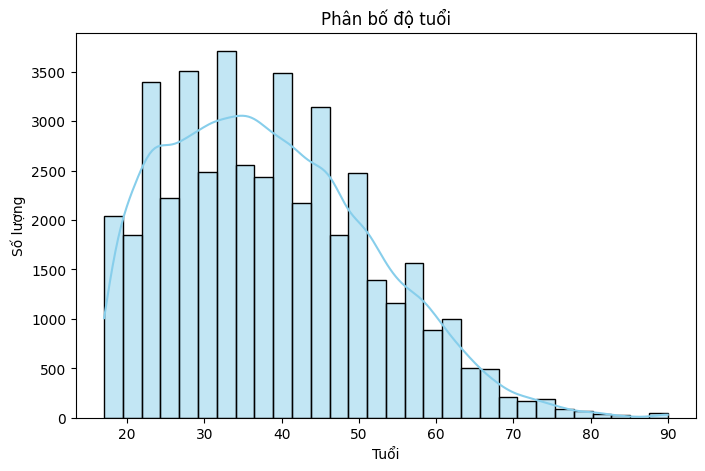

In [ ]:
plt.figure(figsize=(8,5))
sns.histplot(df['age'], bins=30, kde=True, color='skyblue')
plt.title('Phân bố độ tuổi')
plt.xlabel('Tuổi')
plt.ylabel('Số lượng')
plt.show()

📊 Phân bố độ tuổi
* Phân bố tuổi có xu hướng lệch trái, tập trung chủ yếu ở độ tuổi **từ 25 đến 45**.

* Nhóm tuổi **đông nhất**: khoảng 30-35 tuổi.

* Tuổi ngoài **60 trở đi giảm mạnh**, cho thấy **lực lượng lao động chính** là người trẻ và trung niên.

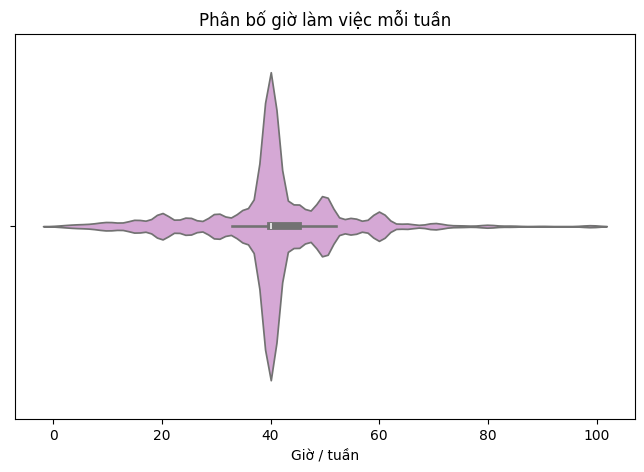

In [ ]:
plt.figure(figsize=(8,5))
sns.violinplot(x=df['hours-per-week'], color='plum')
plt.title('Phân bố giờ làm việc mỗi tuần')
plt.xlabel('Giờ / tuần')
plt.show()

⏱️ Phân bố giờ làm việc mỗi tuần
* Phân bố tập trung **quanh mốc 40 giờ/tuần**, phù hợp với quy chuẩn lao động thông thường.

* Có một số trường hợp làm việc **nhiều hơn 60 giờ**, có thể là công việc đặc thù hoặc outlier.

* Đường phân bố có nhiều đỉnh phụ, phản ánh sự khác biệt theo nhóm công việc.

<ipython-input-21-db1a8f30ac28>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




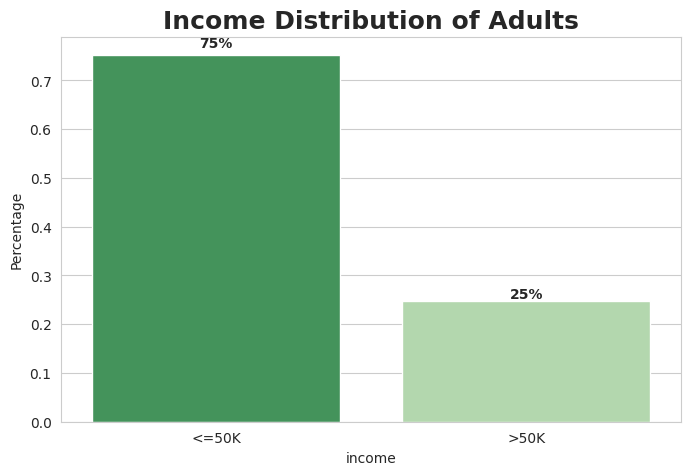

In [ ]:
sns.set_style("whitegrid")
plt.figure(figsize = (8,5))
plt.title('Income Distribution of Adults', fontsize=18, fontweight='bold')
eda_percentage = df['income'].value_counts(normalize = True).rename_axis('income').reset_index(name = 'Percentage')

ax = sns.barplot(x = 'income', y = 'Percentage', data = eda_percentage.head(10), palette='Greens_r')
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    ax.annotate(f'{height:.0%}', (x + width/2, y + height*1.02), ha='center', fontweight='bold')

Trong phần EDA, tôi muốn bắt đầu bằng cách phân tích biến mục tiêu của chúng tôi trước. Chúng tôi đã bắt gặp một quan sát rất rõ ràng!

* Số người kiếm được hơn 50 nghìn đô la một năm là một phần ba số người kiếm được ít hơn nó.

* Chúng ta cũng nên nhớ rằng dữ liệu này đã được thu thập vào năm 1996, vì vậy 50 nghìn đô la của TME đó, có thể không giống nhau trong thời gian ngày nay!

In [ ]:
def age_group(x):
    '''
        Phân nhóm đối tượng
        Args:
               x -> int : tuổi của 1 đối tượng
        Return:
               str : nhóm tuổi của đối tượng

    '''
    x = int(x)
    x = abs(x)
    if( 18 < x < 31 ):
        return "19-30"
    if( 30 < x < 41 ):
        return "31-40"
    if( 40 < x < 51 ):
        return "41-50"
    if( 50 < x < 61 ):
        return "51-60"
    if( 60 < x < 71 ):
        return "61-70"
    else:
        return "Greater than 70"

df['age_group'] = df['age'].apply(age_group)

<ipython-input-22-abb903dcce20>:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



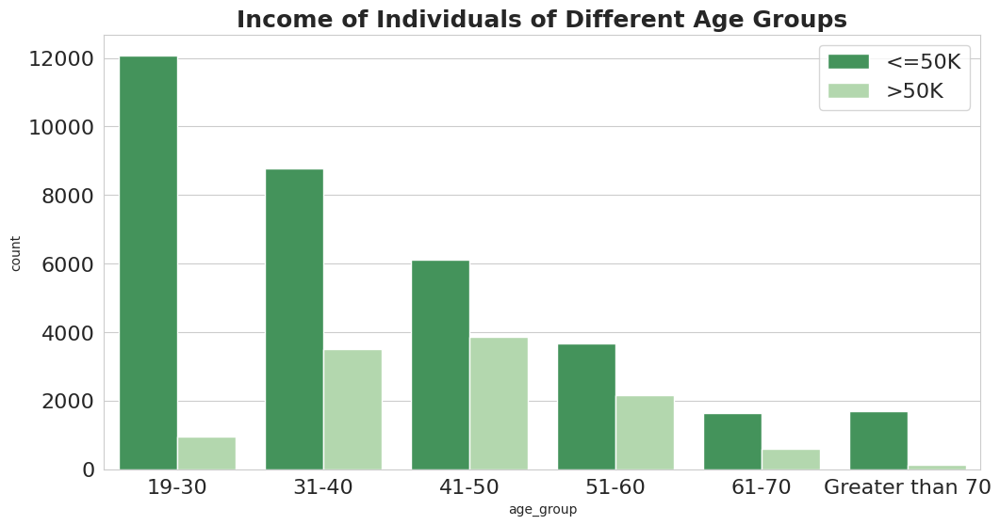

In [ ]:
plt.figure(figsize=(12,6))
order_list = ['19-30', '31-40', '41-50', '51-60', '61-70', 'Greater than 70']
# Melt the DataFrame to convert it to long form
df_melted = pd.melt(df, id_vars=['age_group'], value_vars=['income'])

# Now use the melted DataFrame with sns.countplot
sns.countplot(x='age_group', hue='value', data=df_melted, palette='Greens_r', order=order_list)

plt.title('Income of Individuals of Different Age Groups', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.show()

Chúng tôi thực hiện một quan sát thú vị ở đây. Chúng tôi thấy rằng những người kiếm được tăng hơn 50 nghìn đô la khi tuổi tăng lên đến một mức độ nhất định.

* Như người ta có thể tưởng tượng, số người kiếm được hơn 50k là không đáng kể trong số những người trong độ tuổi 19-30.

* Đối với những người trong độ tuổi nhóm 41-50 và 51-60, số người kiếm được hơn 50k khá tương đương với những người kiếm được ít hơn nó!

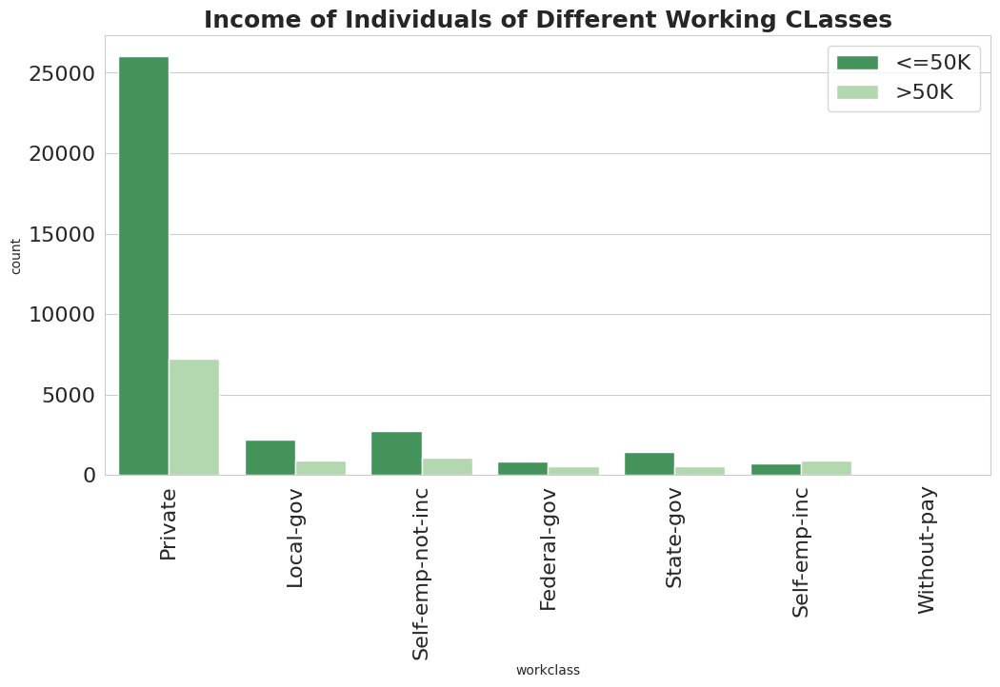

In [ ]:
plt.figure(figsize=(12,6))
# Melt the DataFrame to convert it to long form
df_melted = pd.melt(df, id_vars=['workclass'], value_vars=['income'])

# Now use the melted DataFrame with sns.countplot
sns.countplot(x='workclass', hue='value', data=df_melted, palette='Greens_r')

plt.title('Income of Individuals of Different Working CLasses', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16,rotation = 90)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.show()

Trong biểu đồ trên, chúng tôi đã tách biệt thu nhập của người lớn trên cơ sở các tầng lớp lao động khác nhau của họ.

* Thật thú vị khi thấy rằng tự làm chủ là hạng mục duy nhất mà số người kiếm được hơn 50 nghìn đô la vượt quá những người kiếm được ít hơn so với nó! Có thể có lợi khi đề xuất rằng khi bạn xử lý doanh nghiệp của riêng mình, khởi nghiệp, v.v., bạn có nhiều khả năng kiếm được tốt hơn nếu nó thành công!

* Những người làm việc trong khu vực tư nhân phải đối mặt với sự khác biệt đáng kể giữa các khoản thanh toán của họ, nơi hơn 75% trong số họ kiếm được ít hơn 50 nghìn đô la một năm!

* Có một sự khác biệt rất phút giữa số người có thu nhập nhiều hơn hoặc ít hơn 50 nghìn đô la một năm làm việc cho Chính phủ liên bang.

* Những người thuộc danh mục không trả tiền và không bao giờ làm việc hầu như không chứa bất kỳ dữ liệu nào trong cả hai danh mục.

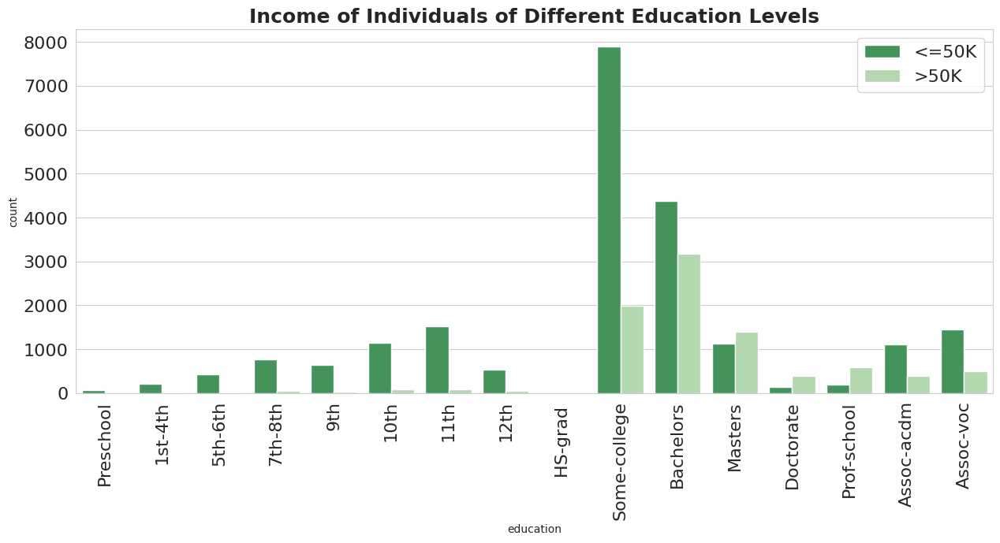

In [ ]:
plt.figure(figsize=(15,6))
order_list = ['Preschool', '1st-4th', '5th-6th', '7th-8th', '9th', '10th', '11th', '12th',
                'HS-grad ', 'Some-college', 'Bachelors', 'Masters', 'Doctorate', 'Prof-school',
              'Assoc-acdm', 'Assoc-voc']
# Melt the DataFrame to convert it to long form
df_melted = pd.melt(df, id_vars=['education'], value_vars=['income'])

# Now use the melted DataFrame with sns.countplot
sns.countplot(x='education', hue='value', data=df_melted, palette='Greens_r', order= order_list)
plt.title('Income of Individuals of Different Education Levels', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16,rotation = 90)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.show()

Chúng ta có thể rút ra một vài kết luận sâu sắc từ biểu đồ này.

* Đối với những người đã hoàn thành giáo dục của họ cho đến tiêu chuẩn thứ 12, chỉ có một số ít trong số họ kiếm được hơn 50 nghìn đô la mỗi năm. Hầu hết mọi người cuối cùng kiếm được dưới 50K!

* Đối với những người thuộc loại Cử nhân, Thạc sĩ, Tiến sĩ, Giáo sư ở cấp độ giáo dục, có nhiều người kiếm được hơn 50 nghìn đô la một năm so với số người kiếm được ít hơn so với nó.

* Trong trường hợp của Assoc-Acad hoặc PGS-VOC, có một vài người kiếm được hơn 50 nghìn đô la mỗi năm!

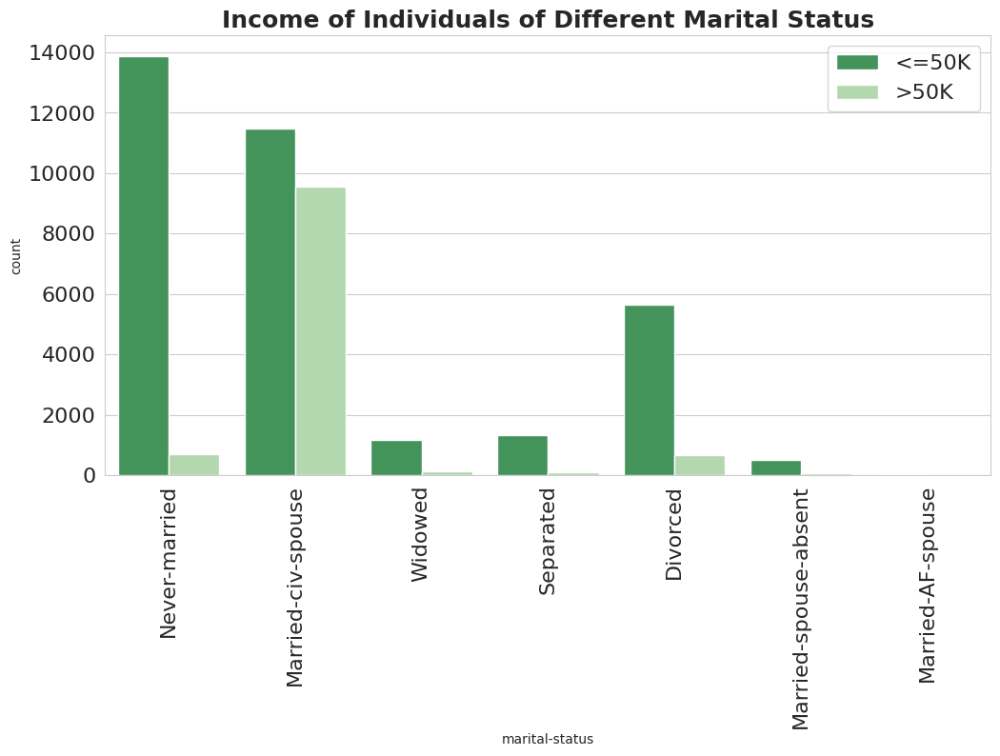

In [ ]:
plt.figure(figsize=(12,6))
# Melt the DataFrame to convert it to long form
df_melted = pd.melt(df, id_vars=['marital-status'], value_vars=['income'])

# Now use the melted DataFrame with sns.countplot
sns.countplot(x='marital-status', hue='value', data=df_melted, palette='Greens_r')

plt.title('Income of Individuals of Different Marital Status', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16,rotation = 90)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.show() # Added show() to display plot

* Một điều cần lưu ý ở đây là vợ chồng đã kết hôn là hạng mục duy nhất có số lượng người tương đương thuộc về cả hai loại.

* Đối với những người khác, có ít hơn 25% người lớn kiếm được hơn 50 nghìn đô la mỗi năm.

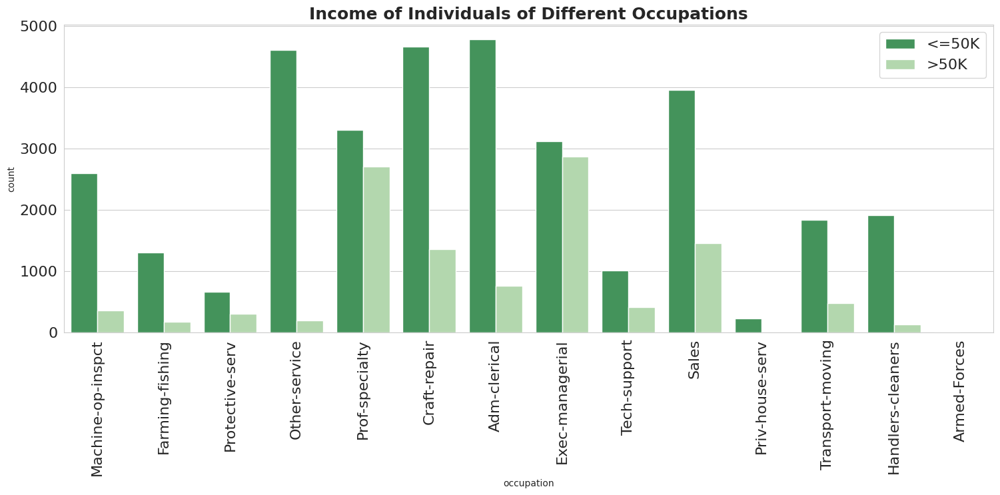

In [ ]:
plt.figure(figsize=(18,6))
# Melt the DataFrame to convert it to long form
df_melted = pd.melt(df, id_vars=['occupation'], value_vars=['income'])

# Now use the melted DataFrame with sns.countplot
sns.countplot(x='occupation', hue='value', data=df_melted, palette='Greens_r')
plt.title('Income of Individuals of Different Occupations', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16,rotation = 90)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.show() # Display the plot

Một vài điểm cần lưu ý ở đây:-

* Người lớn trong vai trò điều hành thực thi có khả năng kiếm được hơn 50 nghìn đô la mỗi năm.

* Có gần 33% tính xác suất cho một người trưởng thành trong chuyên gia chuyên nghiệp để kiếm được hơn 50 nghìn đô la mỗi năm.

* Người lớn làm việc trong câu cá nông nghiệp, kiểm tra máy móc, dịch vụ khác, ADM-công cụ, vận chuyển vận chuyển rất ít có khả năng kiếm được hơn 50 nghìn đô la mỗi năm.

* Khoảng 25% số người làm việc bán hàng kiếm được hơn 50 nghìn đô la mỗi năm.

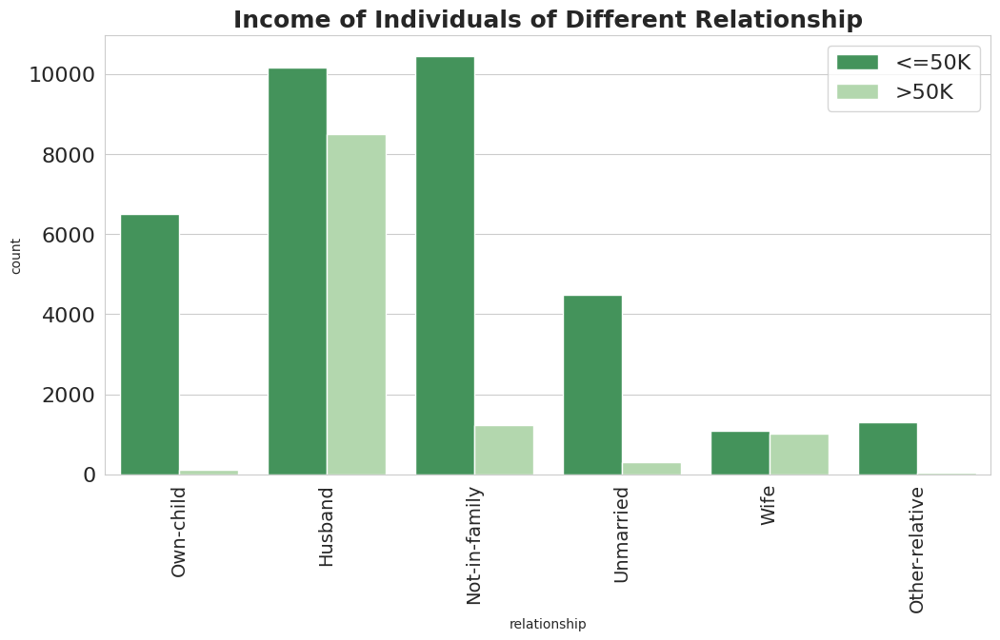

In [ ]:
plt.figure(figsize=(12,6))
# Melt the DataFrame to convert it to long form
df_melted = pd.melt(df, id_vars=['relationship'], value_vars=['income'])

# Now use the melted DataFrame with sns.countplot
sns.countplot(x='relationship', hue='value', data=df_melted, palette='Greens_r')

plt.title('Income of Individuals of Different Relationship', fontsize=18, fontweight='bold')
plt.xticks(fontsize=14, rotation=90)  # Rotated x-axis labels for better readability
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.show() # Display the plot

* Vợ có khả năng kiếm được hơn 50 nghìn đô la một năm.

* Đối với những người chồng, mặc dù đáng kể, có ít khả năng họ kiếm được hơn 50 nghìn đô la mỗi năm.

* Chỉ có một số ít người chưa lập gia đình kiếm được hơn 50 nghìn đô la mỗi năm.

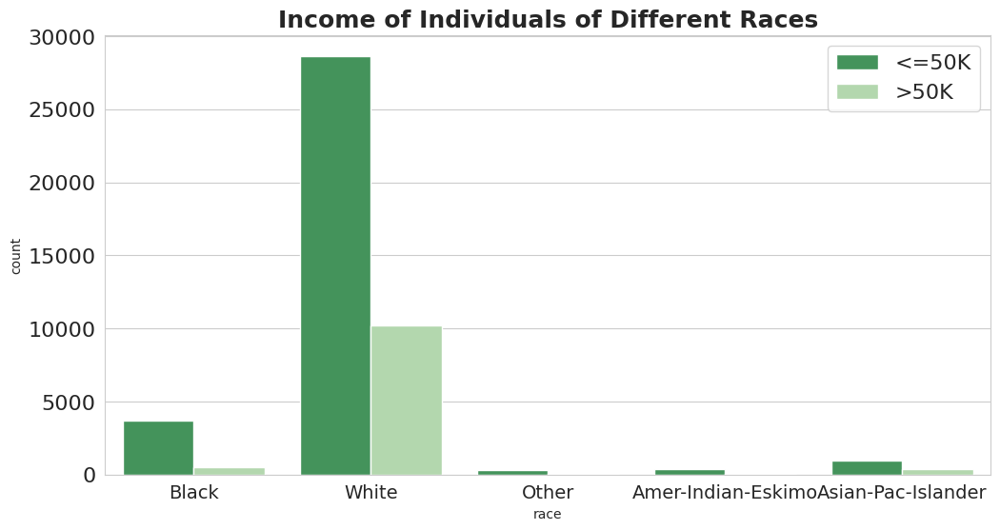

In [ ]:
plt.figure(figsize=(12,6))
# Use the 'x' and 'hue' parameters directly with your DataFrame columns
sns.countplot(x='race', hue='income', data=df, palette='Greens_r')
plt.title('Income of Individuals of Different Races', fontsize=18, fontweight='bold')
plt.xticks(fontsize=14)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.show()

Một điểm quan trọng cần chú ý ở đây là, ngoại trừ người da trắng có rất ít người thuộc các chủng tộc khác nhau. Do đó, người ta có thể không nhận thấy tỷ lệ phần trăm và mối quan hệ chính xác của những người kiếm được hơn 50 nghìn đô la mỗi năm.

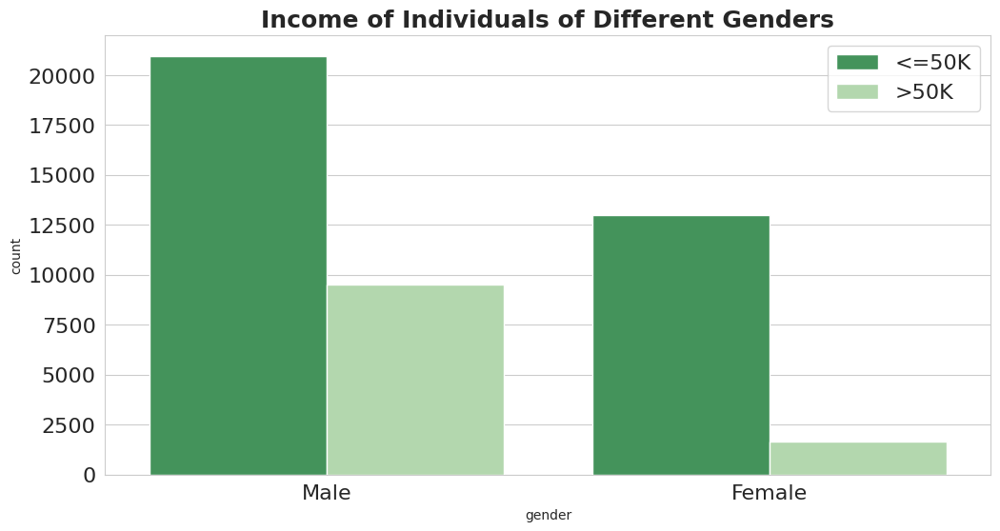

In [ ]:
plt.figure(figsize=(12,6))
#order_list = ['19-30', '31-40', '41-50', '51-60', '61-70', 'Greater than 70']
# Replace 'sex' with the actual column name in your DataFrame
# Assuming the column name is 'gender', update the code as follows:
sns.countplot(x='gender', hue = df['income'], data=df, palette='Greens_r')  # Assuming 'gender' is the correct column
plt.title('Income of Individuals of Different Genders', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)

* Chúng ta có thể thấy một khoảng cách đáng kể trong thu nhập giữa nam và nữ ở đây.

* Đối với nữ, có ít hơn 10% người lớn kiếm được hơn 50 nghìn đô la một năm.

* Trong trường hợp nam giới có gần 33% trong số họ kiếm được hơn 50 nghìn đô la một năm.

## c. Phát hiện dữ liệu ngoại lai: Trình bày các phương pháp để xác định giá trị ngoại lai và đề xuất phương pháp xử lý.

Tôi sẽ xử lý outlier cho các cột **Capital Gain, Capital Loss và Hours per Week**.

Mình sẽ dùng phương pháp **IQR (Interquartile Range)** - rất phổ biến trong EDA để phát hiện và xử lý outlier.

In [ ]:
def remove_outliers_iqr(df, column):
    '''
        Loại bỏ các giá trị ngoại lai
        Args:
              df -> Dataframe: dataset
              column -> str: cột cần xử lý
        Return:
              df -> Dataframe: dataset sau khi xử lý
    '''
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 3.0 * IQR
    upper_bound = Q3 + 3.0 * IQR

    print(f"{column}: giữ lại từ {lower_bound} đến {upper_bound}")

    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

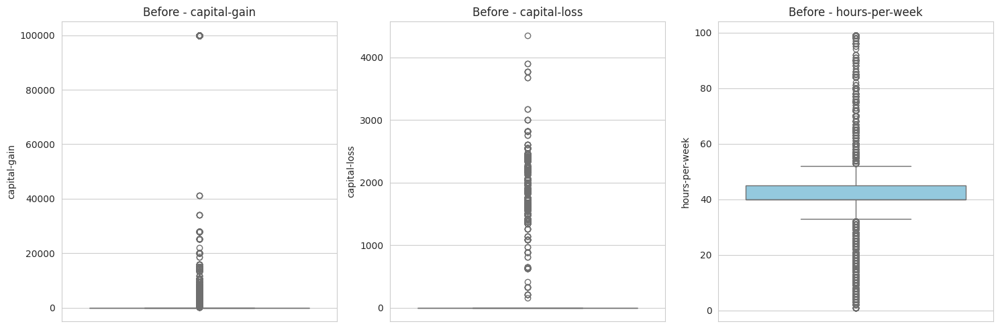

In [ ]:
# Các cột cần xử lý
columns = ['capital-gain', 'capital-loss', 'hours-per-week']

# Vẽ boxplot trước khi xử lý outlier
plt.figure(figsize=(15, 5))
for i, col in enumerate(columns):
    plt.subplot(1, 3, i + 1)
    sns.boxplot(y=df[col], color='skyblue')
    plt.title(f'Before - {col}')
plt.tight_layout()
plt.show()

In [ ]:
# Các cột số lượng cần kiểm tra outliers
columns = ['capital-gain', 'capital-loss', 'hours-per-week']

# Hàm tìm outliers bằng IQR (dạng DataFrame)
def get_outlier_rows(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers_df = data[(data[column] < lower) | (data[column] > upper)]
    return outliers_df

# In các outlier dạng DataFrame cho từng cột
for col in columns:
    outlier_rows = get_outlier_rows(df, col)
    print(f"\n📌 Outliers in column '{col}' — Tổng số dòng: {len(outlier_rows)}")
    display(outlier_rows)


📌 Outliers in column 'capital-gain' — Tổng số dòng: 3790


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income,age_group
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,1,41-50
7,63,Self-emp-not-inc,104626,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,3103,0,32,United-States,1,61-70
10,65,Private,184454,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,6418,0,40,United-States,1,61-70
14,48,Private,279724,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,3103,0,48,United-States,1,41-50
25,45,Self-emp-not-inc,432824,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,7298,0,90,United-States,1,41-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48796,66,Federal-gov,47358,10th,6,Married-civ-spouse,Craft-repair,Husband,White,Male,3471,0,40,United-States,0,61-70
48799,57,Local-gov,110417,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,99999,0,40,United-States,1,51-60
48819,38,Private,139180,Bachelors,13,Divorced,Prof-specialty,Unmarried,Black,Female,15020,0,45,United-States,1,31-40
48829,65,Self-emp-not-inc,99359,Prof-school,15,Never-married,Prof-specialty,Not-in-family,White,Male,1086,0,60,United-States,0,61-70



📌 Outliers in column 'capital-loss' — Tổng số dòng: 2140


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income,age_group
52,21,Private,214399,Some-college,10,Never-married,Other-service,Own-child,White,Female,0,1721,24,United-States,0,19-30
82,24,Private,83141,Some-college,10,Separated,Other-service,Not-in-family,White,Male,0,1876,40,United-States,0,19-30
129,41,Private,239296,Masters,14,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,2415,50,United-States,1,41-50
143,43,Self-emp-inc,214503,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,1887,45,United-States,1,41-50
154,40,State-gov,67874,Bachelors,13,Married-civ-spouse,Adm-clerical,Husband,White,Male,0,1887,45,United-States,1,31-40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48722,53,Private,304504,Some-college,10,Married-civ-spouse,Transport-moving,Husband,White,Male,0,1887,45,United-States,1,51-60
48724,18,Private,41381,HS-grad,9,Never-married,Sales,Own-child,White,Female,0,1602,20,United-States,0,Greater than 70
48726,61,Private,190682,HS-grad,9,Widowed,Craft-repair,Not-in-family,Black,Female,0,1669,50,United-States,0,61-70
48739,36,Private,237943,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,1977,45,United-States,1,31-40



📌 Outliers in column 'hours-per-week' — Tổng số dòng: 11889


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income,age_group
5,34,Private,198693,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,0,31-40
7,63,Self-emp-not-inc,104626,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,3103,0,32,United-States,1,61-70
9,55,Private,104996,7th-8th,4,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,10,United-States,0,51-60
16,20,State-gov,444554,Some-college,10,Never-married,Other-service,Own-child,White,Male,0,0,25,United-States,0,19-30
17,43,Private,128354,HS-grad,9,Married-civ-spouse,Adm-clerical,Wife,White,Female,0,0,30,United-States,0,41-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48825,31,Private,199655,Masters,14,Divorced,Other-service,Not-in-family,Other,Female,0,0,30,United-States,0,31-40
48826,39,Local-gov,111499,Assoc-acdm,12,Married-civ-spouse,Adm-clerical,Wife,White,Female,0,0,20,United-States,1,31-40
48829,65,Self-emp-not-inc,99359,Prof-school,15,Never-married,Prof-specialty,Not-in-family,White,Male,1086,0,60,United-States,0,61-70
48834,32,Private,116138,Masters,14,Never-married,Tech-support,Not-in-family,Asian-Pac-Islander,Male,0,0,11,Taiwan,0,31-40


In [ ]:
# Xử lý outlier
df = remove_outliers_iqr(df, 'capital-gain')
df = remove_outliers_iqr(df, 'capital-loss')
df = remove_outliers_iqr(df, 'hours-per-week')

capital-gain: giữ lại từ 0.0 đến 0.0
capital-loss: giữ lại từ 0.0 đến 0.0
hours-per-week: giữ lại từ 25.0 đến 60.0


Cột	Lý do xử lý outlier
* capital-gain	Có nhiều giá trị cực lớn (up to 100,000)
* capital-loss	Chủ yếu là 0, nhưng cũng có vài giá trị rất cao
* hours-per-week	Một số người làm > 80 giờ/tuần là không phổ biến

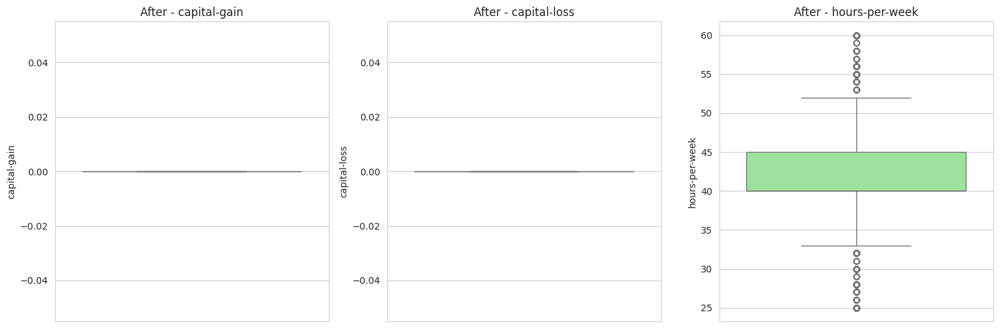

In [ ]:
# Vẽ boxplot sau khi xử lý outlier
plt.figure(figsize=(15, 5))
for i, col in enumerate(columns):
    plt.subplot(1, 3, i + 1)
    sns.boxplot(y=df[col], color='lightgreen')
    plt.title(f'After - {col}')
plt.tight_layout()
plt.show()

## d. Nhận xét tổng quan về tập dữ liệu:Đưa ra các đặc điểm nổi bật của dữ liệu dựa trên các phân tích trên.

In [ ]:
# Vẽ bar chart phân bố income bằng Plotly
fig = px.histogram(df_cleaned, x='income', color='income',
                   title='Distribution of Income',
                   labels={'income': 'Income'},
                   color_discrete_sequence=['#636EFA', '#EF553B'])

fig.show()

📊 Nhận xét về phân bố thu nhập (income):

* Dữ liệu thu nhập chia thành 2 nhóm: <=50K và >50K.

* Tỷ lệ cá nhân có thu nhập <=50K chiếm đa số, phản ánh sự mất cân bằng trong phân bố thu nhập.

* Điều này có thể ảnh hưởng đến hiệu suất mô hình học máy, đặc biệt trong các bài toán phân loại (classification) — cần xem xét cân bằng dữ liệu nếu cần.

In [ ]:
# Create a boxplot
fig = px.box(
    df,
    x='income',  # Income category on the x-axis
    y='age',  # Age distribution on the y-axis
    title='Age Distribution by Income',
    labels={'income': 'Income Category', 'age': 'Age'}
)
fig.show()

📌 Nhận xét:
* Người có thu nhập >50K thường lớn tuổi hơn → cho thấy kinh nghiệm hoặc thời gian làm việc dài hơn có thể ảnh hưởng đến thu nhập.

* Nhóm <=50K có nhiều giá trị ngoại lệ ở độ tuổi rất trẻ và rất già, cho thấy thu nhập thấp xảy ra ở cả đầu và cuối chu kỳ làm việc.

* Median (trung vị) của nhóm >50K cao hơn hẳn nhóm còn lại → khẳng định mối quan hệ giữa tuổi và thu nhập là đáng chú ý.

In [ ]:
# KDE-like plot using Plotly
fig = px.histogram(
    df,
    x="age",
    color="income",
    histnorm="density",  # Normalize histogram to represent density
    barmode="overlay",   # Overlay the distributions
    nbins=30,            # Number of bins for smoother appearance
    opacity=0.5,         # Transparency for overlapping
    title="Age Distribution by Income"
)

# Customize axes
fig.update_layout(
    xaxis_title="Age",
    yaxis_title="Density",
    legend_title="Income Category"
)

fig.show()

📌 Nhận xét:
* Nhóm thu nhập <=50K chiếm ưu thế ở độ tuổi trẻ hơn (đỉnh xuất hiện khoảng 20-30 tuổi).

* Nhóm thu nhập >50K xuất hiện mạnh mẽ hơn từ 35 tuổi trở lên, phân bố rộng hơn và trải dài đến tuổi cao.

* Điều này cho thấy thu nhập cao có xu hướng đi kèm với độ tuổi lớn hơn, có thể phản ánh yếu tố như thâm niên, vị trí công việc, hoặc trình độ học vấn.

In [ ]:
fig = px.histogram(
    df,
    x='fnlwgt',
    nbins=20,  # Số lượng bins
    title='fnlwgt Distribution',
    labels={'fnlwgt': 'Final Weight'},
    opacity=0.75
)

fig.update_layout(
    xaxis_title='fnlwgt',
    yaxis_title='Frequency',
    bargap=0.05
)

fig.show()

📌 Nhận xét:
* Biến fnlwgt có phân bố lệch trái (left-skewed), tập trung nhiều ở giá trị thấp.

* Giá trị cao hiếm hơn, có thể là outlier hoặc đại diện cho những cá nhân có trọng số khảo sát lớn.

* Phân tích này giúp hiểu rõ hơn về độ đại diện của mỗi cá nhân trong dữ liệu.

In [ ]:
# Create a boxplot
fig = px.box(
    df,
    x='educational-num',  # educational-num  on the x-axis
    y='workclass',  # workclass distribution on the y-axis
    title='workclass Distribution by educational-num',
    labels={'educational-num': 'educational-num', 'workclass': 'workclass'}
)
fig.show()

📌 Nhận xét:

* Trình độ học vấn (educational-num) khác biệt rõ giữa các nhóm workclass.

* Nhóm Federal-gov và Self-emp-inc có xu hướng học vấn cao hơn, thể hiện qua median cao và phân bố hẹp.

* Nhóm Private và Self-emp-not-inc có phân bố rộng, cho thấy sự đa dạng về học vấn.

* Nhóm Without-pay và Never-worked có học vấn thấp hơn, số lượng rất ít.

✅ Kết luận: Trình độ học vấn là yếu tố ảnh hưởng rõ rệt đến loại hình công việc mà cá nhân có thể đảm nhận.


In [ ]:
# Đếm số lượng mẫu theo mỗi quốc gia
country_counts = df['native-country'].value_counts().reset_index()
# Đổi tên cột cho rõ ràng
country_counts.columns = ['Country', 'Count']
country_counts_cleaned = country_counts[country_counts['Country'] != '?']
# Hiển thị bảng dữ liệu
print(country_counts_cleaned)

                       Country  Count
0                United-States  29119
1                       Mexico    765
3                  Philippines    218
4                  Puerto-Rico    143
5                      Germany    135
6                  El-Salvador    114
7                       Canada    108
8                         Cuba    104
9                        India     95
10          Dominican-Republic     88
11                     Jamaica     82
12                       China     81
13                     England     75
14                       Italy     75
15                   Guatemala     70
16                    Columbia     65
17                      Poland     63
18                       South     62
19                       Japan     61
20                     Vietnam     60
21                    Portugal     57
22                       Haiti     55
23                      Taiwan     38
24                   Nicaragua     36
25                        Peru     34
26          

In [ ]:
# Vẽ biểu đồ
fig = px.bar(
    country_counts_cleaned.head(5),
    x='Count',
    y='Country',
    orientation='h',
    title='Top 5 quốc gia có số lượng mẫu cao nhất',
    labels={'Country': 'Quốc gia', 'Count': 'Số lượng'},
    height=500
)
fig.show()

* Hoa Kỳ (United-States) chiếm tỷ lệ áp đảo trong dữ liệu.

* Một số quốc gia như Mexico, Philippines, và Germany có số lượng tương đối.

* Cần cân nhắc xử lý mất cân bằng nếu xây dựng mô hình liên quan đến quốc gia.

In [ ]:
# Đếm số lượng theo gender và tạo DataFrame đúng chuẩn
gender_counts = df['gender'].value_counts().reset_index()
gender_counts.columns = ['Gender', 'Count']

# Vẽ bar chart nằm ngang
fig = px.bar(
    gender_counts,
    x='Count',
    y='Gender',
    orientation='h',
    title='Gender Distribution',
    labels={'Gender': 'Giới tính', 'Count': 'Số lượng'},
    color='Gender'
)
fig.show()

* Nam giới chiếm tỷ lệ cao hơn rõ rệt so với nữ giới trong tập dữ liệu (~32,000 mẫu).

* Dữ liệu cho thấy mất cân bằng giới tính trong lực lượng lao động.

* Cơ hội đào tạo hoặc thu hút lao động nữ vào các lĩnh vực nam giới đang chiếm ưu thế.

* Xem xét chênh lệch thu nhập giữa giới để đề xuất chính sách công bằng hơn.

* Tối ưu chiến dịch quảng bá hoặc sản phẩm phù hợp giới tính chiếm ưu thế.

* Khai thác thị trường chưa được phục vụ tốt: phụ nữ trong lực lượng lao động.

In [ ]:
df_filtered = df[df['workclass'] != '?']
workclass_counts = df_filtered['workclass'].value_counts().reset_index()
workclass_counts.columns = ['Workclass', 'Count']

fig = px.bar(
    workclass_counts,
    x='Count',
    y='Workclass',
    orientation='h',
    title='Distribution of Workclass',
    labels={'Workclass': 'Workclass', 'Count': 'Count'},
    color='Workclass'
)
fig.show()

* **Private sector** chiếm tỷ lệ cao nhất — cho thấy phần lớn người dân làm việc ngoài nhà nước.

* **Self-employed** và **Government** (Local/Federal) có tỷ lệ nhỏ hơn nhưng ổn định.

* **Các công ty tuyển dụng** có thể tập trung khai thác nhóm lao động tư nhân — nguồn ứng viên phong phú.

* **Chính phủ** hoặc nhà đầu tư có thể phân bổ ngân sách đào tạo phù hợp cho nhóm lao động tự do và làm công ăn lương.

* **Start-up/Doanh nghiệp nhỏ** có thể ưu tiên tuyển từ nhóm **Private** — do có số lượng lớn và dễ tiếp cận.

* Nếu đầu tư vào **bảo hiểm, giáo dục nghề, fintech,** nhóm này là khách hàng **tiềm năng.**

In [ ]:
# Chuẩn bị lại dữ liệu
edu_counts = df['education'].value_counts().sort_values(ascending=True).reset_index()
edu_counts.columns = ['Education', 'Count']  # Đặt tên đúng cột

# Vẽ biểu đồ
fig = px.bar(
    edu_counts,
    x='Count',
    y='Education',
    orientation='h',
    title='Education Level Distribution',
    labels={'Education': 'Education Level', 'Count': 'Count'},
    color='Education'
)
fig.show()

* **HS-graduate** và **Some-college** chiếm tỷ lệ cao nhất — đây là nhóm có trình độ phổ biến trong dân số lao động.

* Nhóm **Bachelors, Masters, và Doctorate** chiếm tỷ lệ nhỏ hơn đáng kể.

* Một phần lớn dân số vẫn dừng lại ở mức học phổ thông hoặc chưa hoàn tất đại học.

* **Doanh nghiệp tuyển dụng phổ thông hoặc trung cấp** nên tập trung vào nhóm "HS-graduate" và "Some-college".

* **Các cơ sở đào tạo nghề/ngắn hạn** có tiềm năng lớn nếu nhắm vào nhóm chưa hoàn tất đại học.

* **Đầu tư vào EdTech hoặc khóa học online** có thể khai thác nhóm trung bình học vấn - họ có nhu cầu nâng cao kỹ năng để tăng thu nhập.

* **Ngân hàng/tài chính** có thể phân nhóm sản phẩm theo học vấn, vì học vấn liên quan đến **thu nhập và khả năng trả nợ.**

In [ ]:
fig = px.histogram(
    df,
    x='educational-num',
    nbins=20,
    title='Distribution of Educational Number',
    labels={'educational-num': 'Years of Education'},
    color_discrete_sequence=['#636EFA']
)
fig.show()

🔹 **Tập trung ở mức 9-10 năm học** → Phần lớn người trong dữ liệu có trình độ tương đương **tốt nghiệp phổ thông hoặc cao đẳng ngắn hạn** → Thị trường tiềm năng cho các **khóa học nghề, kỹ năng mềm, chứng chỉ nghề nghiệp.**

🔹 **Số người có trình độ cao (≥13 năm học) ít hơn đáng kể → Có thể phát triển các** chương trình đào tạo chuyên sâu hoặc trực tuyến nhắm đến **nhóm nhỏ có khả năng chi trả cao.**

🔹 **Giáo dục cơ bản vẫn chiếm đa số** → Cơ hội mở rộng thị trường trong lĩnh vực **giáo dục đại trà, luyện thi, bổ túc văn hóa.**

In [ ]:
fig = px.sunburst(
    df,
    path=['gender', 'marital-status'],
    title='Marital Status by Gender',
    branchvalues='total'
)

# Tăng kích thước và giãn khoảng chữ
fig.update_layout(
    width=700,
    height=700,
    uniformtext=dict(minsize=12, mode='hide'),
    margin=dict(t=50, l=0, r=0, b=0)
)

fig.show()

🔹 **Tỷ lệ kết hôn cao ở cả nam và nữ** → Cho thấy nhu cầu ổn định cuộc sống, **tiềm năng cho sản phẩm/dịch vụ gia đình, tài chính dài hạn, bất động sản.**

🔹 **Nam giới có tỷ lệ “Never-married” cao hơn nữ** → Gợi ý nhóm độc thân nam là thị trường tiềm năng cho **dịch vụ hẹn hò, giải trí, tiêu dùng cá nhân.**

🔹 **Nữ có tỷ lệ “Widowed” cao hơn rõ rệt** → Mở ra cơ hội tiếp cận nhóm khách hàng trung niên/lớn tuổi với **dịch vụ y tế, chăm sóc sức khỏe, an sinh xã hội.**

In [ ]:
# Lọc bỏ các giá trị '?' trong occupation
df_filtered = df[df['occupation'] != '?']

# Tạo DataFrame đếm occupation đúng định dạng
occupation_counts = df_filtered['occupation'].value_counts().reset_index()
occupation_counts.columns = ['Occupation', 'Count']

# Vẽ biểu đồ
fig = px.bar(
    occupation_counts,
    x='Count',
    y='Occupation',
    orientation='h',
    title='Occupation Distribution',
    labels={'Occupation': 'Occupation', 'Count': 'Count'},
    color='Occupation'
)
fig.show()

* 🔝 **Nhóm nghề “Exec-managerial”, “Prof-specialty”, “Craft-repair”** chiếm đa số → đại diện cho lao động có trình độ và **thu nhập ổn định.**

* 📉 Các nghề lao động tay chân như “Farming-fishing”, “Handlers-cleaners” ít phổ biến hơn → xu hướng chuyển dịch sang khối chuyên môn.

* 💼 Thị trường tiềm năng cho **sản phẩm tài chính, công cụ hỗ trợ nghề nghiệp, đào tạo kỹ năng chuyên sâu.**

In [ ]:
relationship_counts = df['relationship'].value_counts().reset_index()
relationship_counts.columns = ['Relationship', 'Count']

fig = px.bar(
    relationship_counts,
    x='Count',
    y='Relationship',
    orientation='h',
    title='Relationship Roles Distribution',
    labels={'Relationship': 'Relationship', 'Count': 'Count'},
    color='Relationship'
)
fig.show()

* **"Husband" và "Not-in-family"** là hai nhóm lớn nhất → Phản ánh cấu trúc hộ gia đình phổ biến và sự độc lập trong cư trú.

* Nhóm **"Own-child" và "Other-relative"** chiếm tỷ lệ thấp → Tập trung vào người trưởng thành, ít dữ liệu trẻ nhỏ hoặc phụ thuộc.

* **Tiếp thị sản phẩm gia đình, nhà ở,** tài chính nên hướng đến nhóm **đã lập gia đình (Husband, Wife)** - có xu hướng ổn định, nhu cầu dài hạn.

* Nhóm **"Not-in-family"** phù hợp với các sản phẩm cá nhân hóa, linh hoạt, như căn hộ studio, bảo hiểm cá nhân, dịch vụ online.

* **Đầu tư bất động sản** có thể cân nhắc tách phân khúc theo kiểu quan hệ hộ gia đình để tối ưu tiếp cận.

In [ ]:
fig = px.pie(
    df,
    names='race',
    title='Race Distribution',
    hole=0.3,
    color_discrete_sequence=px.colors.qualitative.Pastel,
    width=700,   # chiều rộng (pixels)
    height=600   # chiều cao (pixels)
)
fig.show()

* Giới tính: Phân bố **gần cân bằng** → Thiết kế sản phẩm/dịch vụ **phi giới tính** hoặc tùy biến linh hoạt.

* Quốc gia: **Hoa Kỳ áp đảo** về số lượng → Nên **tập trung chiến lược vào thị trường Mỹ.**

* Chủng tộc: Chủ yếu **người da trắng** → Phù hợp tiếp thị **đại chúng tại Mỹ**; muốn mở rộng cần bổ sung dữ liệu đa văn hóa.

* Trình độ học vấn: Phân tầng rõ → Cơ hội phát triển **giải pháp giáo dục cá nhân hóa.**

* Nghề nghiệp & Workclass: Nhóm **Private và chuyên môn chiếm đa số** → Tiềm năng tiếp cận nhóm **lao động ổn định, thu nhập tốt.**

* Tình trạng hôn nhân: Tỷ lệ **kết hôn cao** → Gợi mở nhu cầu về **tiêu dùng gia đình, nhà ở, tài chính dài hạn.**

# 3. Phân tích phân phối xác suất

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32690 entries, 0 to 48839
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              32690 non-null  int64 
 1   workclass        32690 non-null  object
 2   fnlwgt           32690 non-null  int64 
 3   education        32690 non-null  object
 4   educational-num  32690 non-null  int64 
 5   marital-status   32690 non-null  object
 6   occupation       32690 non-null  object
 7   relationship     32690 non-null  object
 8   race             32690 non-null  object
 9   gender           32690 non-null  object
 10  capital-gain     32690 non-null  int64 
 11  capital-loss     32690 non-null  int64 
 12  hours-per-week   32690 non-null  int64 
 13  native-country   32690 non-null  object
 14  income           32690 non-null  object
dtypes: int64(6), object(9)
memory usage: 4.0+ MB


* Kiểu dữ liệu: int64 (liên tục rời rạc).

* Ý nghĩa: Tuổi của cá nhân - yếu tố thường liên quan mạnh đến **thu nhập, nghề nghiệp, nhu cầu học tập và tiêu dùng.**

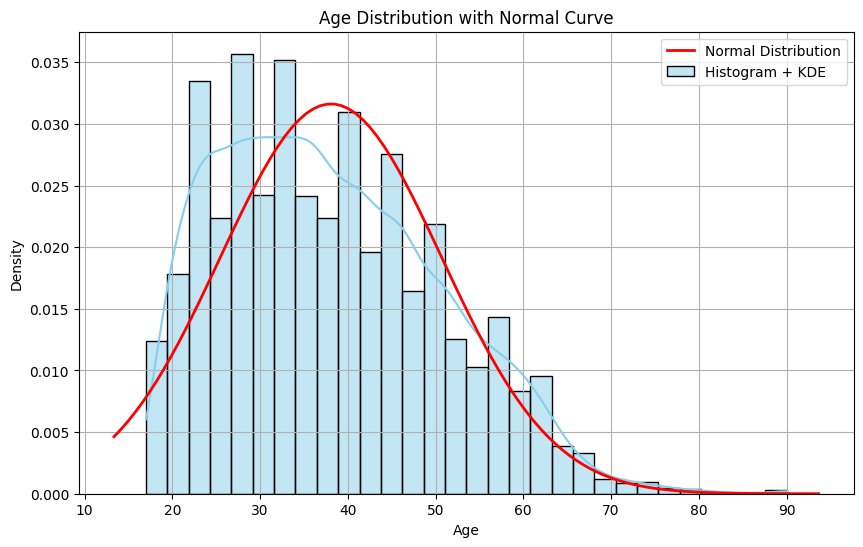

In [ ]:
# Vẽ histogram và overlay đường chuẩn
plt.figure(figsize=(10, 6))
sns.histplot(df['age'], kde=True, stat="density", bins=30, color='skyblue', label='Histogram + KDE')

# Overlay đường chuẩn
mean = df['age'].mean()
std = df['age'].std()
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mean, std)
plt.plot(x, p, 'r', linewidth=2, label='Normal Distribution')

plt.title('Age Distribution with Normal Curve')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from scipy.stats import shapiro

stat, p = shapiro(df['age'].sample(5000, random_state=42))  # Lấy mẫu 5000
print('Shapiro-Wilk Test: Statistic = %.4f, p-value = %.4f' % (stat, p))

Shapiro-Wilk Test: Statistic = 0.9677, p-value = 0.0000


In [ ]:
from scipy.stats import kstest, zscore

age_z = zscore(df['age'])
stat, p = kstest(age_z, 'norm')
print('Kolmogorov-Smirnov Test: Statistic = %.4f, p-value = %.4f' % (stat, p))

Kolmogorov-Smirnov Test: Statistic = 0.0691, p-value = 0.0000


* Hình dạng của phân phối age **lệch trái nhẹ**, **không hoàn toàn tuân theo** phân phối chuẩn.

* Tuổi phổ biến rơi vào **khoảng 25-45 tuổi.**

* Sự thiếu đối xứng và có **đuôi dài bên phải** cho thấy không phải phân phối chuẩn hoàn toàn.

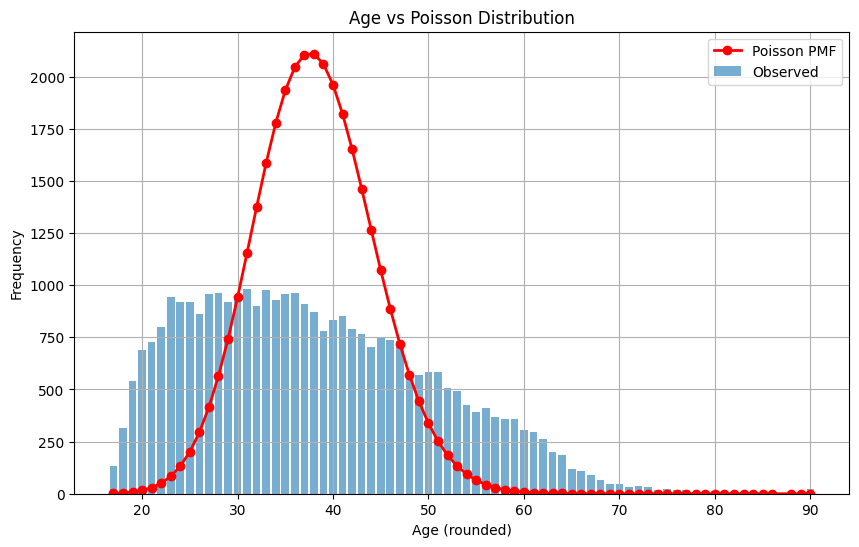

In [ ]:
from scipy.stats import poisson

# Làm tròn dữ liệu tuổi thành số nguyên
age_int = df['age'].round().astype(int)

# Tính lambda (trung bình)
lambda_poisson = age_int.mean()

# Đếm tần suất quan sát
obs_counts = age_int.value_counts().sort_index()
k_values = obs_counts.index
expected_pmf = poisson.pmf(k_values, mu=lambda_poisson)

# Chuẩn hóa để phù hợp tần suất
expected_freq = expected_pmf * len(age_int)

# Vẽ biểu đồ
plt.figure(figsize=(10, 6))
plt.bar(k_values, obs_counts, width=0.8, alpha=0.6, label='Observed')
plt.plot(k_values, expected_freq, 'ro-', label='Poisson PMF', linewidth=2)

plt.title('Age vs Poisson Distribution')
plt.xlabel('Age (rounded)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.show()

* Poisson phù hợp với các biến đếm (như số lần giao dịch, sự kiện...) chứ không phù hợp cho dữ liệu liên tục như tuổi.

* Probability Mass Function của Poisson không khớp với histogram thực tế → Không nên dùng Poisson để mô hình hóa độ tuổi.

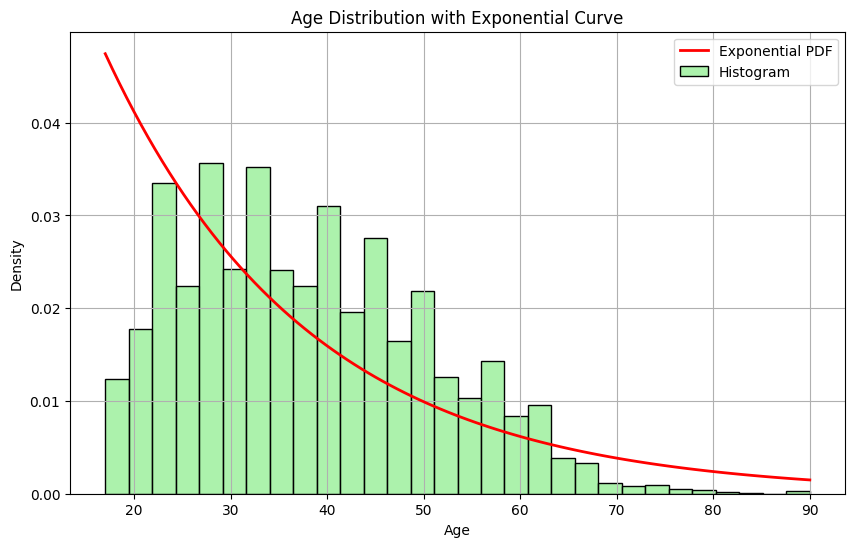

📊 Exponential K-S Test:
  - Statistic = 0.1683
  - p-value   = 0.0000
  ❌ Không tuân theo phân phối exponential.


In [ ]:
from scipy.stats import expon, kstest

# Fit tham số cho phân phối mũ
loc_exp, scale_exp = expon.fit(df['age'])

# Vẽ histogram và overlay exponential
plt.figure(figsize=(10, 6))
sns.histplot(df['age'], stat='density', bins=30, color='lightgreen', label='Histogram')

# Overlay Exponential PDF
x = np.linspace(df['age'].min(), df['age'].max(), 100)
pdf_exp = expon.pdf(x, loc=loc_exp, scale=scale_exp)
plt.plot(x, pdf_exp, 'r-', label='Exponential PDF', linewidth=2)

plt.title('Age Distribution with Exponential Curve')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.show()

# K-S test
ks_stat_exp, p_val_exp = kstest(df['age'], 'expon', args=(loc_exp, scale_exp))

print("📊 Exponential K-S Test:")
print(f"  - Statistic = {ks_stat_exp:.4f}")
print(f"  - p-value   = {p_val_exp:.4f}")
if p_val_exp < 0.05:
    print("  ❌ Không tuân theo phân phối exponential.")
else:
    print("  ✅ Có thể tuân theo phân phối exponential.")

* Dữ liệu không giảm dần mạnh như đường cong phân phối mũ → Không phù hợp.

* Thực tế, dữ liệu tuổi thường không theo mô hình "thời gian chờ đợi cho một sự kiện", nên phân phối mũ thường chỉ phù hợp khi xử lý dữ liệu thời gian giữa sự kiện.

# 4. Kiểm định giả thuyết

Có sự khác biệt về số giờ làm việc trung bình mỗi tuần giữa nam và nữ không?

In [ ]:
from scipy.stats import ttest_ind

def gender_hours_ttest(df: pd.DataFrame) -> None:
    '''
        Thực hiện kiểm định t-test giữa số giờ làm việc mỗi tuần của nam và nữ.

        Args:
              df (pd.DataFrame): Dữ liệu đã được load và tiền xử lý.
        Return:

               None
    '''
    # Trực quan hóa bằng Plotly
    fig = px.box(df,
                 x='gender',
                 y='hours-per-week',
                 color='gender',
                 title="📦 Số giờ làm việc mỗi tuần theo giới tính",
                 labels={'gender': 'Giới tính', 'hours-per-week': 'Số giờ làm việc/tuần'},
                 color_discrete_sequence=px.colors.qualitative.Set2)
    fig.update_layout(showlegend=False)
    fig.show()

    # Tách nhóm
    male = df[df['gender'] == 'Male']['hours-per-week']
    female = df[df['gender'] == 'Female']['hours-per-week']

    # Kiểm định
    t_stat, p_val = ttest_ind(male, female)
    print(f"T-statistic: {t_stat:.3f} | P-value: {p_val:.5f}")

    # Diễn giải
    alpha = 0.05
    if p_val < alpha:
        print("✅ Có sự khác biệt có ý nghĩa thống kê giữa nam và nữ về số giờ làm việc.")
    else:
        print("❌ Không có sự khác biệt đáng kể giữa nam và nữ về số giờ làm việc.")

In [ ]:
gender_hours_ttest(df)

T-statistic: 33.745 | P-value: 0.00000
✅ Có sự khác biệt có ý nghĩa thống kê giữa nam và nữ về số giờ làm việc.


* Kết quả kiểm định t-test cho thấy **sự khác biệt có ý nghĩa** thống kê giữa nam và nữ về số giờ làm việc mỗi tuần.

* T-statistic = 33.745, P-value < 0.00001, nhỏ hơn ngưỡng ý nghĩa 0.05 → **bác bỏ giả thuyết không.**

* Nam giới có xu hướng **làm việc nhiều giờ** hơn nữ giới, thể hiện rõ qua phân phối và boxplot.

In [ ]:
from scipy.stats import f_oneway

def anova_education_hours(df: pd.DataFrame) -> None:
    '''
        Kiểm định ANOVA: Education ảnh hưởng đến Hours-per-week không?

        Args:
              df (pd.DataFrame): Dữ liệu đã được load và tiền xử lý.

        Return:
                None
    '''
    # Trực quan hóa bằng Plotly
    fig = px.box(df,
                 x='education',
                 y='hours-per-week',
                 color='education',
                 title="📚 Số giờ làm việc mỗi tuần theo trình độ học vấn",
                 labels={'education': 'Trình độ học vấn', 'hours-per-week': 'Số giờ làm việc/tuần'},
                 color_discrete_sequence=px.colors.qualitative.Set3)
    fig.update_layout(xaxis_tickangle=-45, showlegend=False)
    fig.show()

    # Chuẩn bị dữ liệu cho ANOVA
    groups = [group['hours-per-week'].values for _, group in df.groupby('education')]

    # ANOVA
    f_stat, p_val = f_oneway(*groups)
    print(f"F-statistic: {f_stat:.3f} | P-value: {p_val:.5f}")

    # Diễn giải
    if p_val < 0.05:
        print("✅ Có sự khác biệt có ý nghĩa thống kê về số giờ làm việc giữa các trình độ học vấn.")
    else:
        print("❌ Không có sự khác biệt đáng kể về số giờ làm việc giữa các trình độ học vấn.")

In [ ]:
anova_education_hours(df)

F-statistic: 45.738 | P-value: 0.00000
✅ Có sự khác biệt có ý nghĩa thống kê về số giờ làm việc giữa các trình độ học vấn.


Kết quả kiểm định One-Way ANOVA cho thấy:

* F-statistic = 45.738,

* P-value = 0.00000 (p < 0.05)

✅ Kết luận: Có sự khác biệt có ý nghĩa thống kê về số giờ làm việc trung bình mỗi tuần giữa các nhóm trình độ học vấn.

🔍 Thực tế: Những người có trình độ học vấn khác nhau có xu hướng làm việc với số giờ khác nhau, phản ánh sự phân hóa nghề nghiệp và yêu cầu công việc theo trình độ.

# 5. Phân tích tương quan giữa các biến




In [ ]:
df['income']=df['income'].map({'<=50K': 0, '>50K': 1})

<ipython-input-43-1b25a10f63e9>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Pearson correlation
pearson_corr = numerical_df.corr(method='pearson')
print("📊 Pearson Correlation:\n", pearson_corr)

# Spearman correlation
spearman_corr = numerical_df.corr(method='spearman')
print("\n📊 Spearman Correlation:\n", spearman_corr)

📊 Pearson Correlation:
                       age    fnlwgt  educational-num  capital-gain  \
age              1.000000 -0.075590         0.037269      0.079649   
fnlwgt          -0.075590  1.000000        -0.041992     -0.004118   
educational-num  0.037269 -0.041992         1.000000      0.126982   
capital-gain     0.079649 -0.004118         0.126982      1.000000   
capital-loss     0.059258 -0.004359         0.081719     -0.032137   
hours-per-week   0.101604 -0.018712         0.146463      0.083868   
income           0.236839 -0.007227         0.332981      0.221071   

                 capital-loss  hours-per-week    income  
age                  0.059258        0.101604  0.236839  
fnlwgt              -0.004359       -0.018712 -0.007227  
educational-num      0.081719        0.146463  0.332981  
capital-gain        -0.032137        0.083868  0.221071  
capital-loss         1.000000        0.054141  0.148679  
hours-per-week       0.054141        1.000000  0.227146  
income   

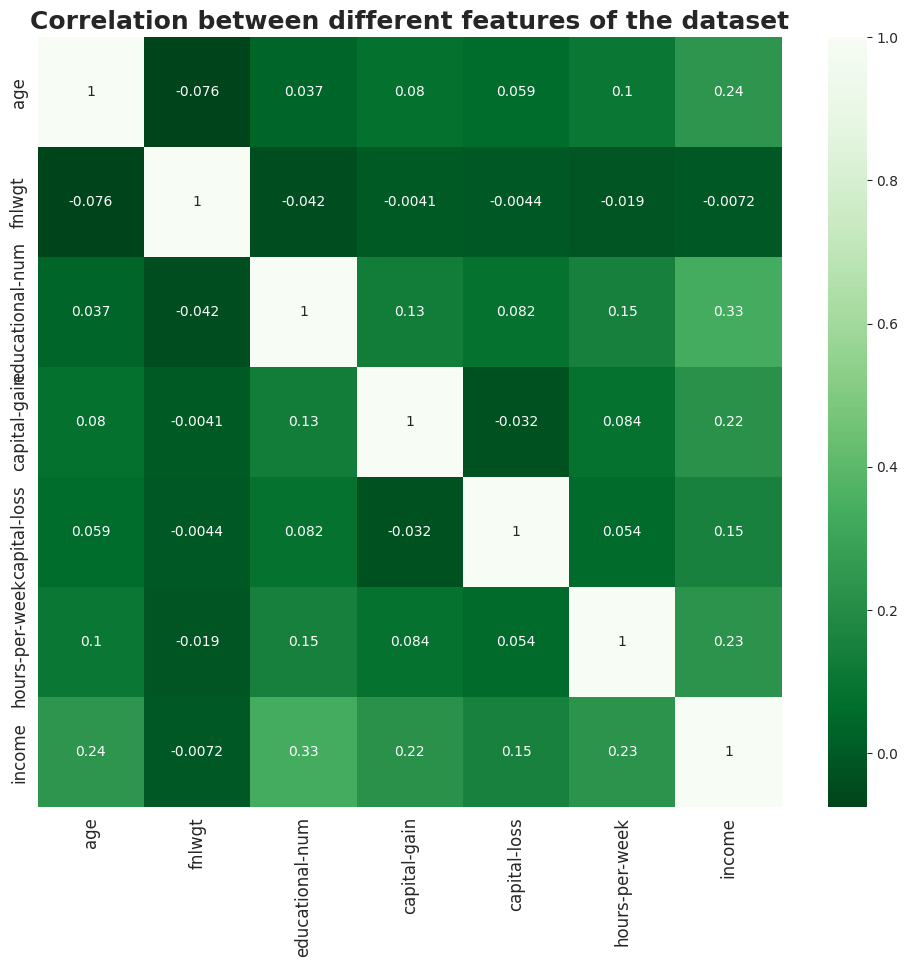

In [ ]:
numerical_df = df.select_dtypes(include=['number'])

plt.figure(figsize=(12, 10))
plt.title("Correlation between different features of the dataset", fontsize=18, fontweight='bold')
sns.heatmap(numerical_df.corr(), cmap='Greens_r', annot=True)
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12, rotation=90)
#plt.legend(fontsize=12) # Remove the legend as it's not relevant for a heatmap
plt.show()

Ở đây, chúng tôi đã cố gắng vẽ một bản đồ tương quan để xem liệu các tính năng độc lập có liên quan đến các tính năng phụ thuộc hay không.

* Chúng tôi thấy rằng hầu hết các tính năng đều tương quan tích cực với biến income.

* Một điều quan trọng cần lưu ý ở đây là, chúng tôi đã không đề cập đến các kiểu dữ liệu đối tượng trong biểu đồ tương quan này

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.



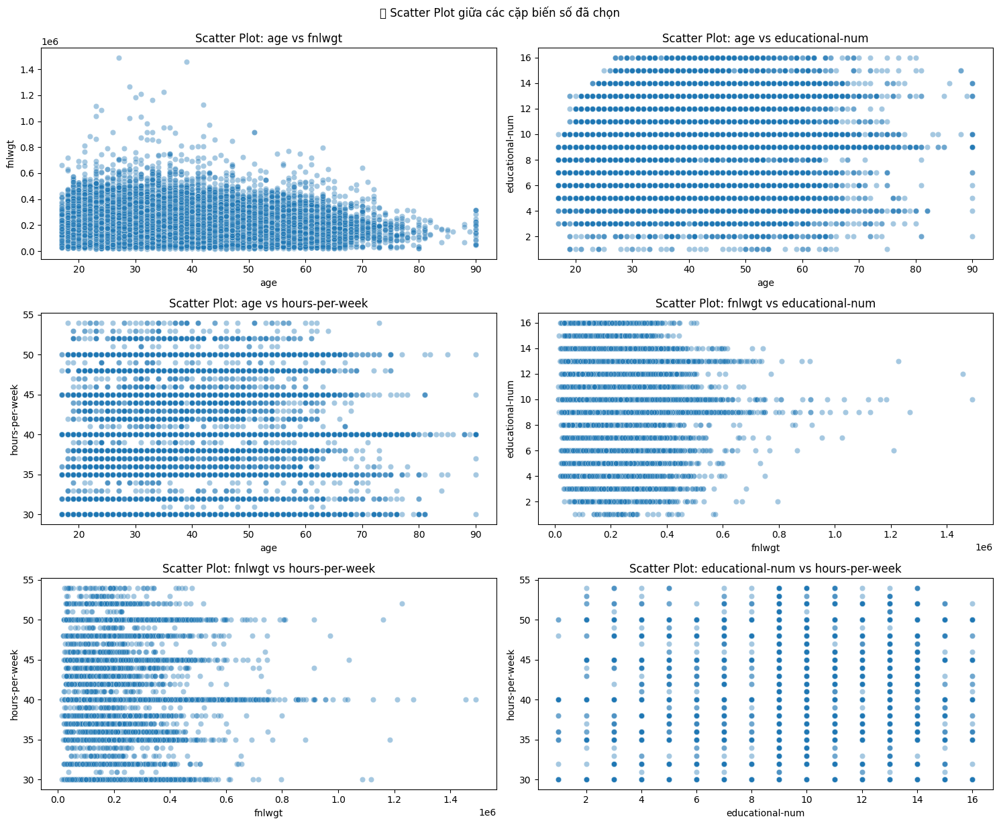

In [ ]:
from itertools import combinations

# Các biến số cần trực quan
num_cols = ['age', 'fnlwgt', 'educational-num', 'hours-per-week']
df_numeric = df[num_cols]

# Tạo biểu đồ scatter plot cho từng cặp biến
combs = list(combinations(num_cols, 2))
plt.figure(figsize=(15, 12))
for i, (x_var, y_var) in enumerate(combs, 1):
    plt.subplot(3, 2, i)
    sns.scatterplot(data=df_numeric, x=x_var, y=y_var, alpha=0.4)
    plt.title(f'Scatter Plot: {x_var} vs {y_var}')
plt.tight_layout()
plt.suptitle("📊 Scatter Plot giữa các cặp biến số đã chọn", y=1.02)
plt.show()

✅ 1. Mối quan hệ yếu giữa các biến:
Các scatter plot cho thấy phần lớn các cặp biến số như fnlwgt với age hay hours-per-week phân bố rải rác, **không có mối quan hệ tuyến tính rõ ràng** → chứng tỏ **tương quan yếu hoặc không đáng kể.**

✅ 2. Cặp biến có xu hướng dễ nhận thấy:

* educational-num và age: có xu hướng tăng nhẹ theo độ tuổi, thể hiện rằng người lớn tuổi có **xu hướng học cao hơn, tuy không rõ ràng.**

* hours-per-week so với educational-num: phân bố khá phân tán nhưng có thể thấy một số **nhóm học vấn cao làm việc nhiều giờ hơn.**

# Code 5: Students Performance Dataset

# Import libraries and load data

In [ ]:
import pandas as pd
import missingno as msno
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [22]:
import pandas as pd
import kagglehub
import os
# Download latest version
path = kagglehub.dataset_download("spscientist/students-performance-in-exams")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/students-performance-in-exams


In [23]:
csv_file_path = os.path.join(path, os.listdir(path)[0]) #This line finds the first file in the `path` directory

# Read the CSV file
df = pd.read_csv(csv_file_path)

# 2. Khám phá dữ liệu (Exploratory Data Analysis - EDA)

## a. Tóm tắt thông tin dữ liệu:

In [ ]:
df

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75
...,...,...,...,...,...,...,...,...
995,female,group E,master's degree,standard,completed,88,99,95
996,male,group C,high school,free/reduced,none,62,55,55
997,female,group C,high school,free/reduced,completed,59,71,65
998,female,group D,some college,standard,completed,68,78,77


In [ ]:
df.shape

(1000, 8)

### Kiểm tra số lượng bản ghi và số lượng biển số.

In [ ]:
so_luong_ban_ghi, so_luong_bien_so = df.shape

print(f"Số lượng bản ghi: {so_luong_ban_ghi}")
print(f"Số lượng biến số: {so_luong_bien_so}")

Số lượng bản ghi: 1000
Số lượng biến số: 8


### Kiểu dữ liệu của từng biến.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   gender                       1000 non-null   object
 1   race/ethnicity               1000 non-null   object
 2   parental level of education  1000 non-null   object
 3   lunch                        1000 non-null   object
 4   test preparation course      1000 non-null   object
 5   math score                   1000 non-null   int64 
 6   reading score                1000 non-null   int64 
 7   writing score                1000 non-null   int64 
dtypes: int64(3), object(5)
memory usage: 62.6+ KB


In [ ]:
df.columns

Index(['gender', 'race/ethnicity', 'parental level of education', 'lunch',
       'test preparation course', 'math score', 'reading score',
       'writing score'],
      dtype='object')

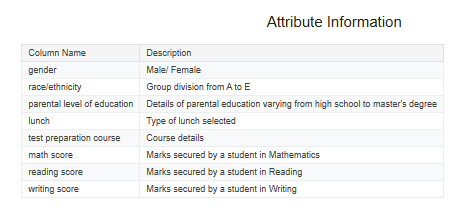

### Kiểm tra dữ liệu thiếu

In [ ]:
missing_plot(df)

In [ ]:
df.isna().sum()

,0
gender,0
race/ethnicity,0
parental level of education,0
lunch,0
test preparation course,0
math score,0
reading score,0
writing score,0


### Kiểm tra dữ liệu trùng lặp

In [ ]:
duplicated_rows = df[df.duplicated(keep=False)]
print("\nSố lượng bản ghi trùng lặp:", duplicated_rows.shape[0])


Số lượng bản ghi trùng lặp: 0


In [24]:
duplicate_plot(df)

## b. Phân tích thống kê mô tả:

### Tính các thống kê như trung bình, trung vị, độ lệch chuẩn, tứ phân vị.

In [ ]:
df.describe()

,math score,reading score,writing score
count,1000.00000,1000.000000,1000.000000
mean,66.08900,69.169000,68.054000
std,15.16308,14.600192,15.195657
min,0.00000,17.000000,10.000000
25%,57.00000,59.000000,57.750000
50%,66.00000,70.000000,69.000000
75%,77.00000,79.000000,79.000000
max,100.00000,100.000000,100.000000


### Trực quan hoá bằng các biểu đồ phù hợp (ít nhất 3 loại biểu đồ) để nhận diện xu hướng dữ liệu.

In [ ]:
df['Percentage'] = (df['math score']+df['reading score']+df['writing score'])/3

In [ ]:
def Grade(Percentage):
    '''
        Hàm đánh giá học lực dựa vào điểm trung bình
        Input:
              Percentage(int): Điểm trung bình
        Return:
                character: Học lực
    '''

    if (Percentage >= 95):return 'O'
    if (Percentage >= 81):return 'A'
    if (Percentage >= 71):return 'B'
    if (Percentage >= 61):return 'C'
    if (Percentage >= 51):return 'D'
    if (Percentage >= 41):return 'E'
    else: return 'F'

df["grade"] = df.apply(lambda x : Grade(x["Percentage"]), axis=1)

In [ ]:
df.head(10)

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score,Percentage,grade
0,female,group B,bachelor's degree,standard,none,72,72,74,72.666667,B
1,female,group C,some college,standard,completed,69,90,88,82.333333,A
2,female,group B,master's degree,standard,none,90,95,93,92.666667,A
3,male,group A,associate's degree,free/reduced,none,47,57,44,49.333333,E
4,male,group C,some college,standard,none,76,78,75,76.333333,B
5,female,group B,associate's degree,standard,none,71,83,78,77.333333,B
6,female,group B,some college,standard,completed,88,95,92,91.666667,A
7,male,group B,some college,free/reduced,none,40,43,39,40.666667,F
8,male,group D,high school,free/reduced,completed,64,64,67,65.000000,C
9,female,group B,high school,free/reduced,none,38,60,50,49.333333,E


In [ ]:
sns.set(style='whitegrid')

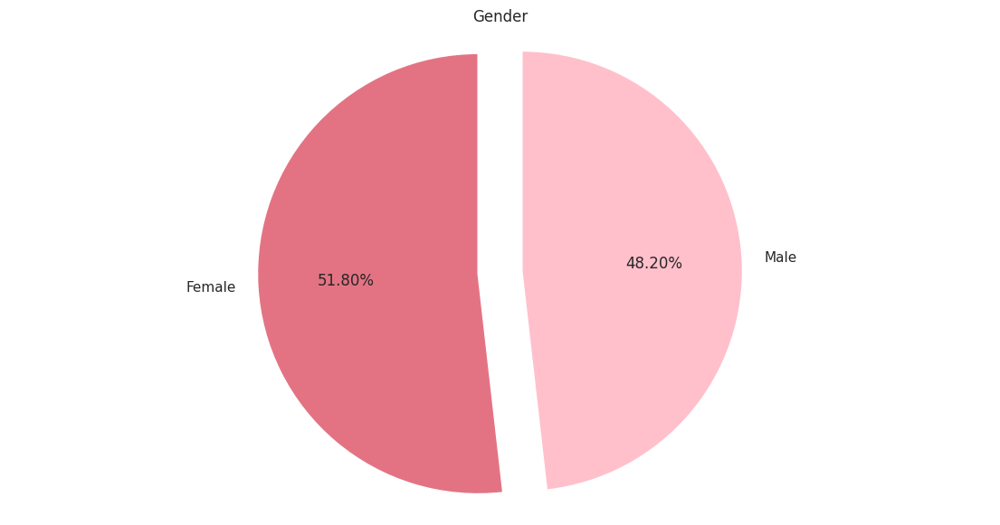

In [ ]:

plt.figure(figsize=(14, 7))
labels=['Female', 'Male']
plt.pie(df['gender'].value_counts(),labels=labels,explode=[0.1,0.1],
        autopct='%1.2f%%',colors=['#E37383','#FFC0CB'], startangle=90)
plt.title('Gender')
plt.axis('equal')
plt.show()

* Trong tổng số học sinh, 51,89% là nữ trong khi 48,20% là nam.

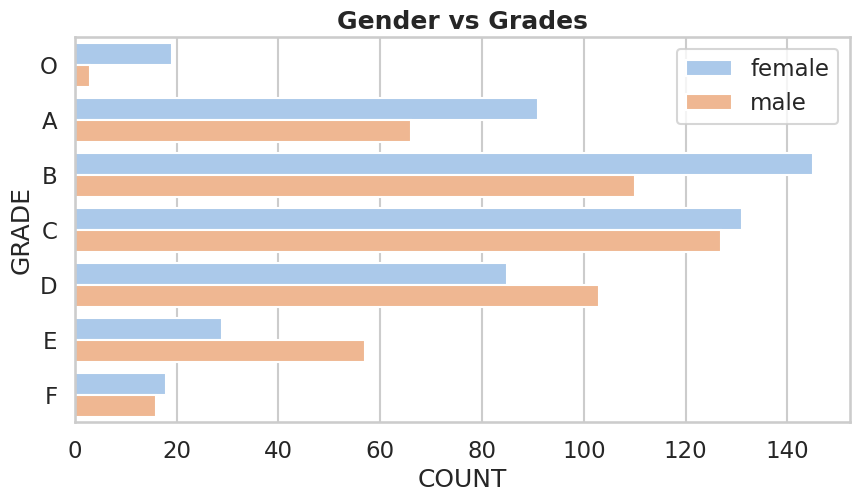

In [ ]:
plt.figure(figsize=(10,5))
sns.set_context("talk",font_scale=1)
sns.set_palette("pastel")
ax = sns.countplot(y="grade", hue="gender", data=df, order=["O","A","B","C","D","E","F"])
ax.legend(loc='upper right',frameon=True)
plt.title('Gender vs Grades', fontsize=18, fontweight='bold')
ax.set(xlabel='COUNT',ylabel='GRADE')
plt.show()

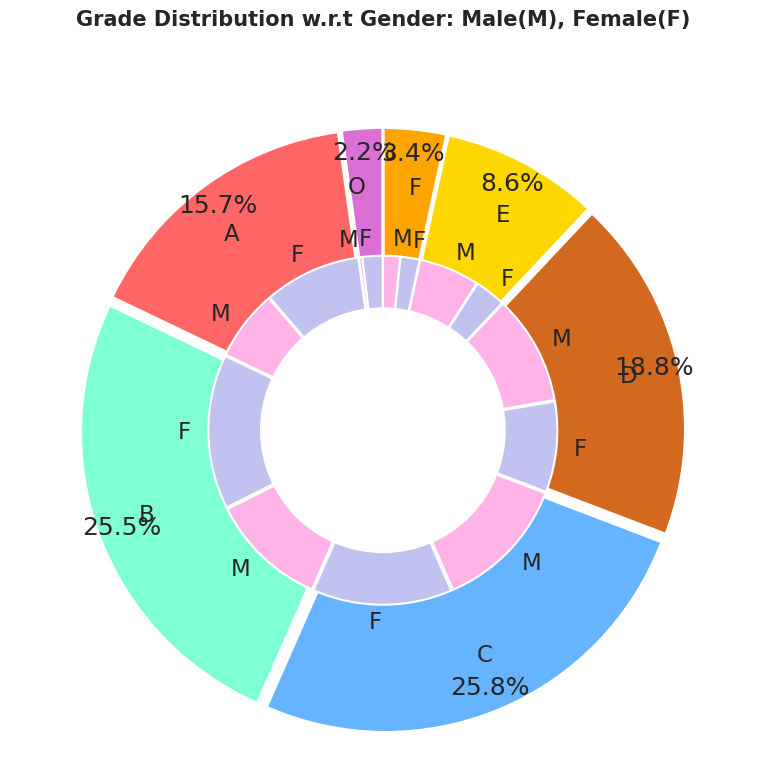

In [ ]:
plt.figure(figsize=(8, 8))
labels =["O","A","B","C","D","E","F"]
values = [22,157,255,258,188,86,34]
labels_gender = ["F","M","F","M","F","M","F","M","F","M","F","M","F","M"]
sizes_gender = [19,3,91,66,145,110,131,127,85,103,29,57,18,16]
colors = ['orchid', '#ff6666', 'aquamarine', '#66b3ff','chocolate','gold','orange']
colors_gender = ['#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6']
explode = (0.3,0.3,0.3,0.3,0.3,0.3,0.3)
explode_gender = (0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1)
#Plot
plt.pie(values, labels=labels,autopct='%1.1f%%' ,pctdistance=0.92, labeldistance=0.80,colors=colors, startangle=90,frame=True, explode=explode,radius=12)
plt.pie(sizes_gender,labels=labels_gender,colors=colors_gender,startangle=90, explode=explode_gender,radius=7)
#Draw circle
centre_circle = plt.Circle((0,0),5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Grade Distribution w.r.t Gender: Male(M), Female(F)', fontsize=15, fontweight='bold',y=1.1)

# show plot

plt.axis('equal')
plt.tight_layout()
plt.show()

Từ hình dung trên, chúng tôi suy ra:

* Phần lớn các học sinh kiếm được một lớp O là nữ.

* Đa số học sinh nhận được lớp B theo sau là C.

* Nhiều học sinh nữ nhận được lớp A và B so với học sinh nam.

* Nhiều con trai nhận được lớp D và E.

* Số lượng gần như tương tự của cả hai, nam và nữ, có lớp F.

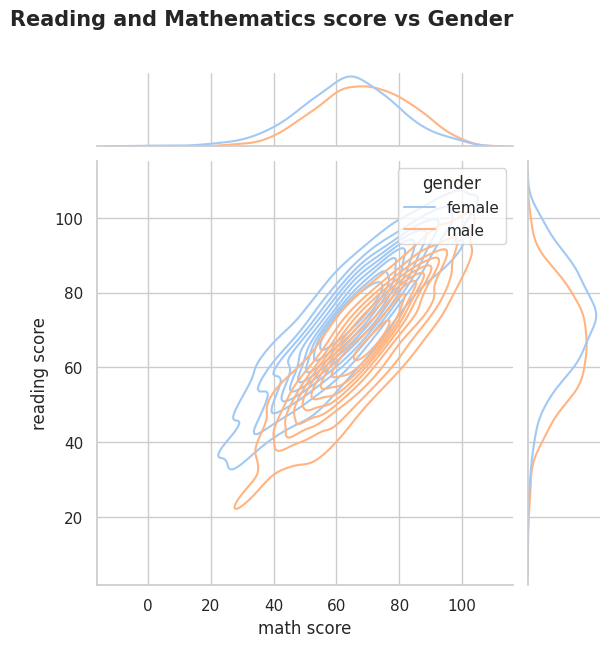

In [ ]:
sns.set_context("notebook")
sns.jointplot(data=df, x="math score", y="reading score", hue="gender", kind="kde")
plt.title('Reading and Mathematics score vs Gender', fontsize=15, fontweight='bold',y=1.3,loc="right")
plt.show()

* Chúng ta có thể thấy mối quan hệ giữa đọc và điểm toán và phân phối giới tính của họ.

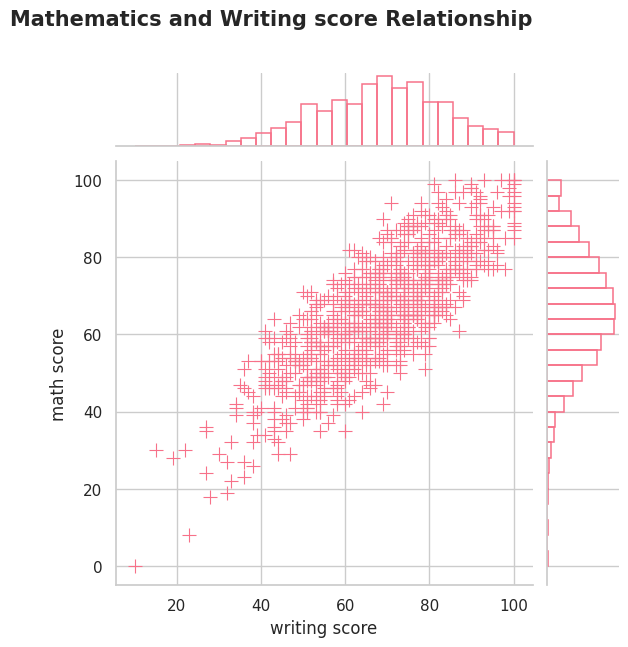

In [ ]:
sns.set_palette("husl", 9)
sns.jointplot(
    data=df, x="writing score", y="math score",
    marker="+", s=100, marginal_kws=dict(bins=25, fill=False),
)
plt.title('Mathematics and Writing score Relationship', fontsize=15, fontweight='bold',y=1.3,loc="right")
plt.show()

* Hầu hết các sinh viên rơi vào khoảng 40 đến 85 điểm trong cả hai khóa học, toán học và viết.

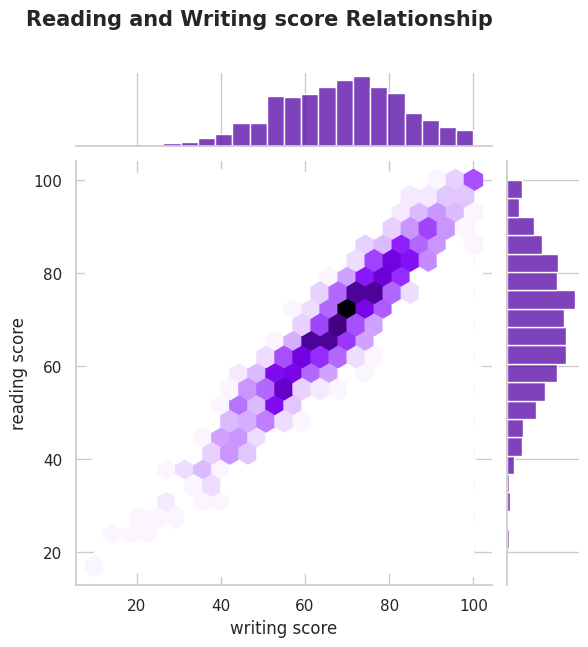

In [ ]:
sns.set_palette("plasma")
sns.jointplot(data=df, x="writing score", y="reading score", kind="hex")
plt.title('Reading and Writing score Relationship', fontsize=15, fontweight='bold',y=1.3,loc="right")
plt.show()

* Điểm trung bình trong cả hai khóa học, đọc và viết, là khoảng 70.

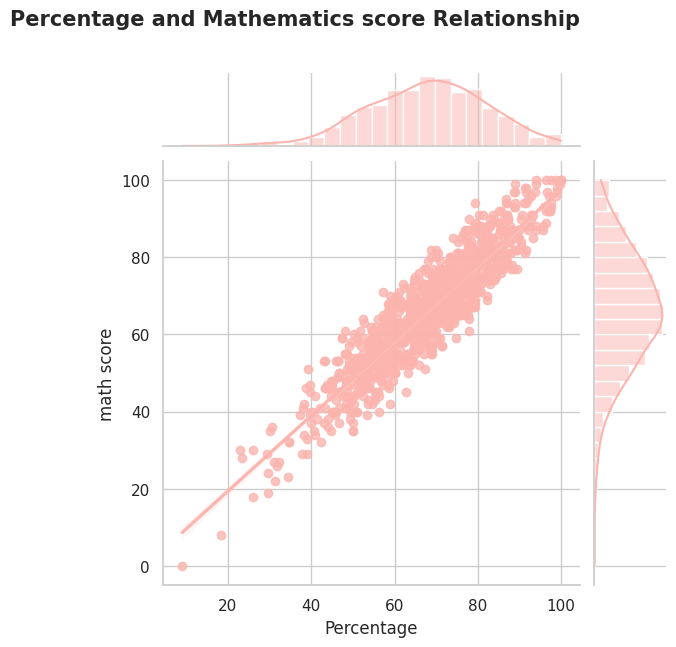

In [ ]:
sns.set_palette("Pastel1")
sns.jointplot(data=df, x="Percentage", y="math score", kind="reg")
plt.title('Percentage and Mathematics score Relationship', fontsize=15, fontweight='bold',y=1.3,loc="right")
plt.show()

* Chúng ta có thể thấy rằng trong mối quan hệ giữa tỷ lệ phần trăm và điểm toán học, hầu hết học sinh đã ghi được trong phạm vi từ 50 đến 80.

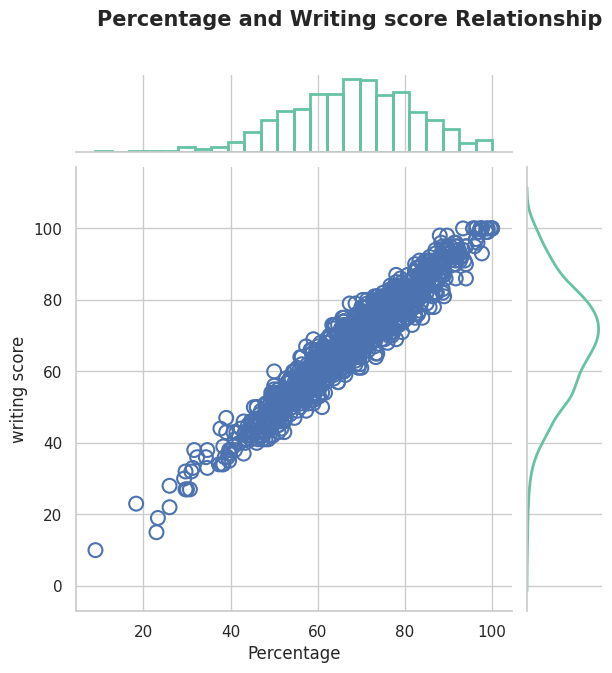

In [ ]:
sns.set_palette("Set2")
g = sns.JointGrid()
x, y = df["Percentage"], df["writing score"]
sns.scatterplot(x=x, y=y, ec="b", fc="none", s=100, linewidth=1.5, ax=g.ax_joint)
sns.histplot(x=x, fill=False, linewidth=2, ax=g.ax_marg_x)
sns.kdeplot(y=y, linewidth=2, ax=g.ax_marg_y)
plt.title('Percentage and Writing score Relationship', fontsize=15, fontweight='bold',y=1.3,loc="right")
plt.show()

* Từ hình dung trên, chúng tôi suy luận rằng hầu hết sinh viên đã ghi được trong phạm vi từ 60 đến 80, điều này cũng cấu thành tỷ lệ phần trăm chung.

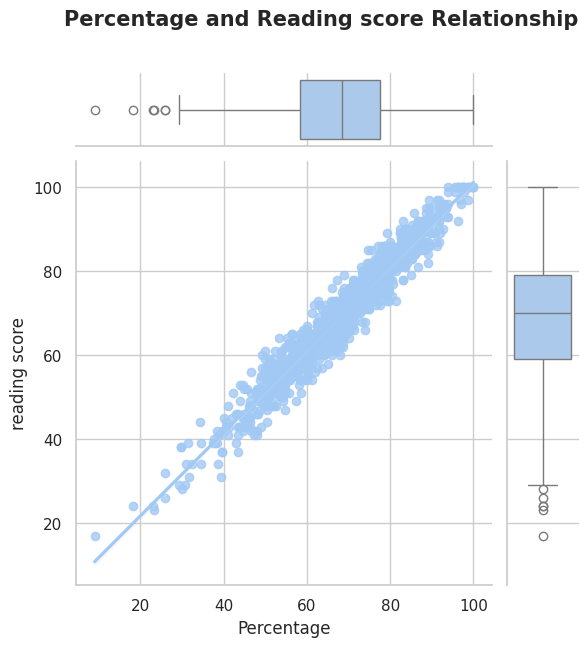

In [ ]:
sns.set_context("notebook")
sns.set_palette("pastel")
g = sns.JointGrid(data=df, x="Percentage", y="reading score")
g.plot(sns.regplot, sns.boxplot)
plt.title('Percentage and Reading score Relationship', fontsize=15, fontweight='bold',y=1.3,loc="right")
plt.show()

* Chúng tôi có thể kết luận rằng hầu hết các sinh viên có điểm đọc tốt, ngoại trừ một số ít.

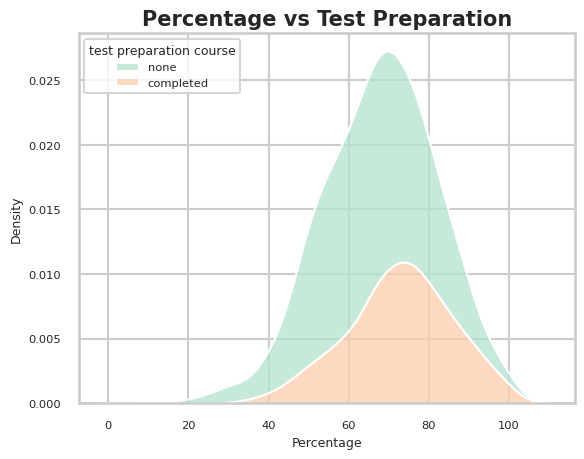

In [ ]:
sns.set_context("talk",font_scale=0.5)
sns.set_palette("Pastel2")
sns.kdeplot(data=df, x="Percentage", hue="test preparation course", multiple="stack")
plt.title('Percentage vs Test Preparation',fontsize=15, fontweight='bold')

plt.show()

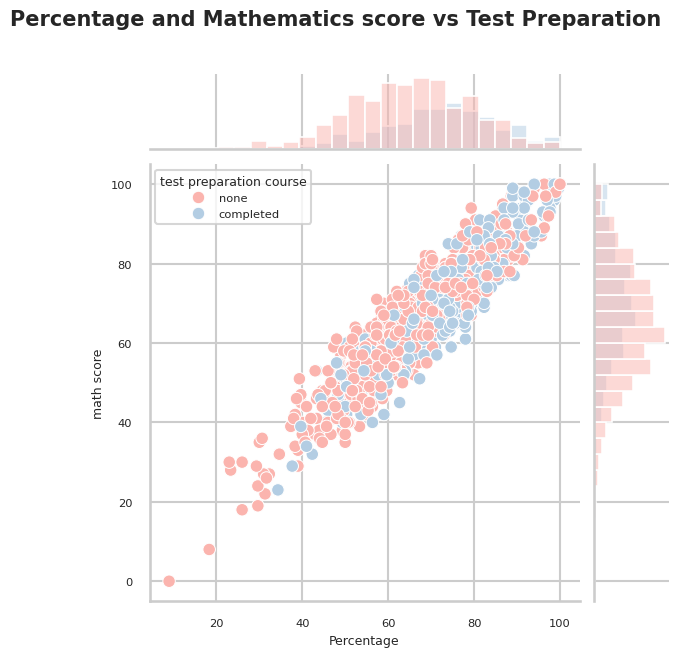

In [ ]:
sns.set_palette("Pastel1")
g = sns.JointGrid(data=df, x="Percentage", y="math score", hue="test preparation course")
g.plot(sns.scatterplot, sns.histplot)
plt.title('Percentage and Mathematics score vs Test Preparation ', fontsize=15, fontweight='bold',y=1.3,loc="right")
plt.show()

Từ hình dung trên, chúng ta có thể suy ra rằng:

* Học sinh đã hoàn thành các chế phẩm kiểm tra của họ chắc chắn đã đạt điểm tốt hơn.

* Trong khi một vài sinh viên không hoàn thành các chế phẩm kiểm tra của họ đã không hoạt động tốt như vậy.

* Chúng ta có thể nhận thấy rằng có rất ít người đã ghi được đặc biệt tốt so với những người khác ngay cả khi họ không hoàn thành sự thay đổi thử nghiệm của họ.

* Ngoài ra, có rất ít người đã hoàn thành việc chuẩn bị kiểm tra nhưng vẫn đạt tỷ lệ phần trăm thấp.

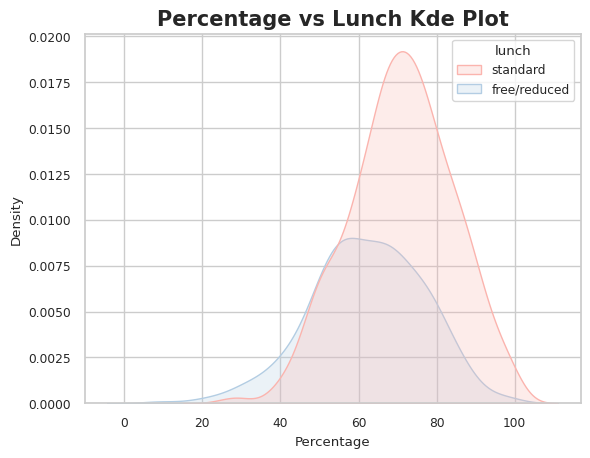

In [ ]:

sns.set_context("notebook",font_scale=0.8)
sns.kdeplot(data=df, x="Percentage", hue="lunch", multiple="layer",fill=True)
plt.xlabel('Percentage')
plt.title('Percentage vs Lunch Kde Plot',fontsize=15, fontweight='bold')

plt.show()

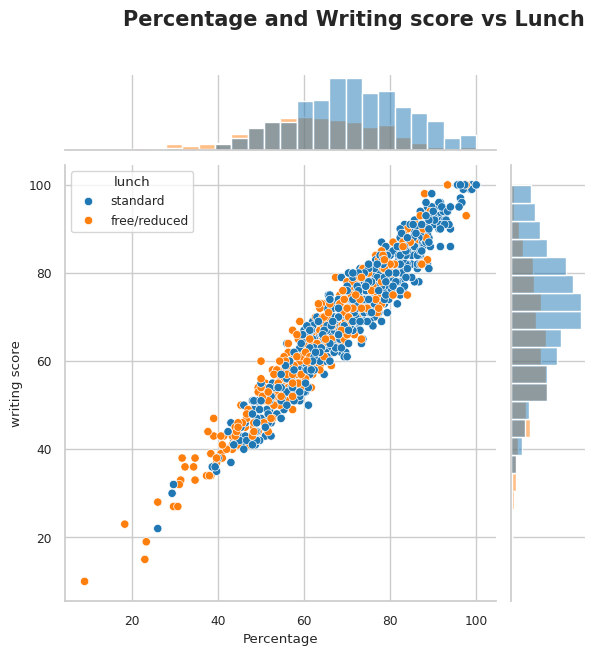

In [ ]:
sns.set_palette("tab10")
g = sns.JointGrid(data=df, x="Percentage", y="writing score", hue="lunch")
g.plot(sns.scatterplot, sns.histplot)
plt.title('Percentage and Writing score vs Lunch', fontsize=15, fontweight='bold',y=1.3,loc="right")
plt.show()

Lưu ý phạm vi 75 đến 100 trong trực quan hóa trên.

* Học sinh đã ăn trưa tiêu chuẩn đã hoạt động rất tốt.

* Học sinh đã ăn trưa miễn phí/giảm đã không hoạt động tốt như vậy.

Điều rất rõ ràng là thực phẩm và chất dinh dưỡng đóng một vai trò quan trọng trong sự phát triển của một học sinh, cả về thể chất và học thuật. Dinh dưỡng đóng một vai trò quan trọng trong sự phát triển lành mạnh của trẻ em. Thực phẩm bổ dưỡng cung cấp cho cơ thể và tâm trí năng lượng cần thiết để phát triển, cảm thấy tốt, hoạt động, giữ sức khỏe và học hỏi. Học sinh có thể học tốt hơn khi chúng được nuôi dưỡng tốt, và ăn các bữa ăn lành mạnh có liên quan đến các lớp cao hơn, trí nhớ và sự tỉnh táo tốt hơn, và xử lý thông tin nhanh hơn.

Học sinh khỏe mạnh là người học giỏi hơn

## c. Phát hiện dữ liệu ngoại lai: Trình bày các phương pháp để xác định giá trị ngoại lai và đề xuất phương pháp xử lý.

In [ ]:
num_cols = ['math score', 'reading score', 'writing score', 'Percentage']

for col in num_cols:
    outliers = detect_outliers_iqr(df, col)
    if not outliers.empty:
        print(f"Cột {col} có {len(outliers)} giá trị ngoại lai")
        print(outliers)

Cột math score có 8 giá trị ngoại lai
     gender race/ethnicity parental level of education         lunch  \
17   female        group B            some high school  free/reduced   
59   female        group C            some high school  free/reduced   
145  female        group C                some college  free/reduced   
338  female        group B            some high school  free/reduced   
466  female        group D          associate's degree  free/reduced   
787  female        group B                some college      standard   
842  female        group B                 high school  free/reduced   
980  female        group B                 high school  free/reduced   

    test preparation course  math score  reading score  writing score  \
17                     none          18             32             28   
59                     none           0             17             10   
145                    none          22             39             33   
338                  

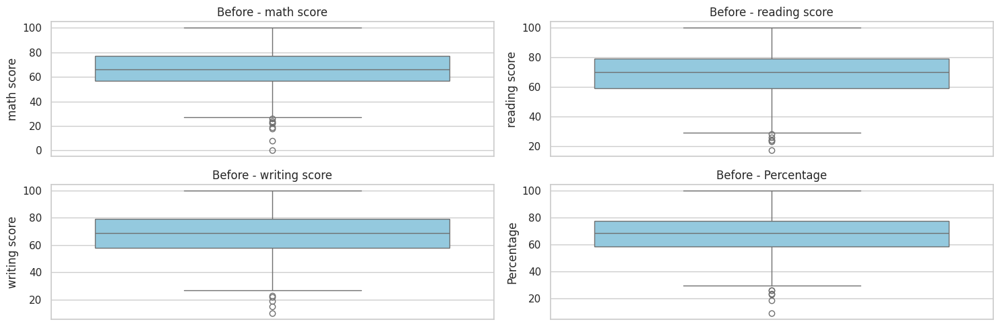

In [ ]:
# Vẽ boxplot trước khi xử lý outlier
plt.figure(figsize=(15, 5))
for i, col in enumerate(num_cols):
    # Changed to accommodate 4 subplots in a 2x2 grid
    plt.subplot(2, 2, i + 1)
    sns.boxplot(y=df[col], color='skyblue')
    plt.title(f'Before - {col}')
plt.tight_layout()
plt.show()

In [ ]:
for i in num_cols:
    df = remove_outliers_iqr(df, i)

math score: giữ lại từ -3.0 đến 137.0
reading score: giữ lại từ -1.0 đến 139.0
writing score: giữ lại từ -6.0 đến 142.75
Percentage: giữ lại từ 0.3333333333333286 đến 135.66666666666669


In [ ]:
df = df[df['math score'] >= 0]
df = df[df['reading score'] >= 0]
df = df[df['writing score'] >= 0]

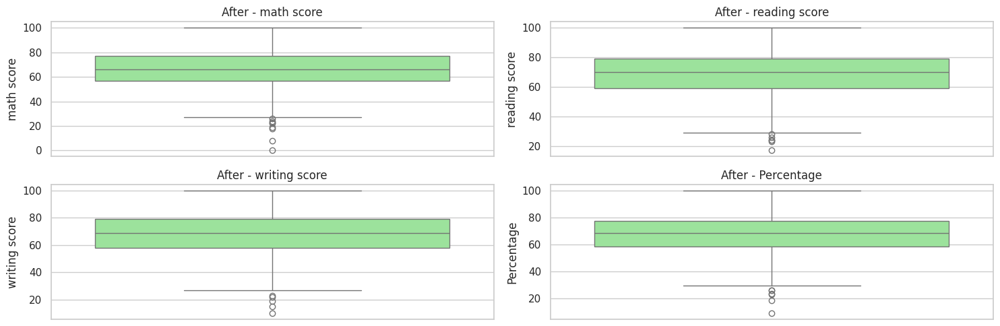

In [ ]:
# Vẽ boxplot sau khi xử lý outlier
plt.figure(figsize=(15, 5))
for i, col in enumerate(num_cols):
    # Changed to accommodate 4 subplots in a 2x2 grid
    plt.subplot(2, 2, i + 1)
    sns.boxplot(y=df[col], color='lightgreen')
    plt.title(f'After - {col}')
plt.tight_layout()
plt.show()

## d. Nhận xét tổng quan về tập dữ liệu:Đưa ra các đặc điểm nổi bật của dữ liệu dựa trên các phân tích trên.

* Hiệu suất của học sinh có tương quan với các yếu tố như bữa trưa, chủng tộc và trình độ học vấn của cha mẹ.

* Con cái có tỷ lệ vượt qua cao hơn và cũng đạt được điểm số cao nhất.

* Hiệu suất của học sinh không cho thấy mối tương quan mạnh mẽ với việc hoàn thành khóa học chuẩn bị kiểm tra.

* Hoàn thành một khóa học chuẩn bị đã được chứng minh là có lợi.

# 3. Phân tích phân phối xác suất

In [ ]:
df[(df['race/ethnicity']=='group B')]

,gender,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score,Percentage,grade
0,female,group B,bachelor's degree,standard,none,72,72,74,72.666667,B
2,female,group B,master's degree,standard,none,90,95,93,92.666667,A
5,female,group B,associate's degree,standard,none,71,83,78,77.333333,B
6,female,group B,some college,standard,completed,88,95,92,91.666667,A
7,male,group B,some college,free/reduced,none,40,43,39,40.666667,F
...,...,...,...,...,...,...,...,...,...,...
969,female,group B,bachelor's degree,standard,none,75,84,80,79.666667,B
976,male,group B,some college,free/reduced,completed,60,62,60,60.666667,D
980,female,group B,high school,free/reduced,none,8,24,23,18.333333,F
982,male,group B,some high school,standard,completed,79,85,86,83.333333,A


In [ ]:
df["grade"].value_counts()

,count
grade,
C,258
B,255
D,188
A,157
E,86
F,34
O,22


In [ ]:
df["grade"].index.sort_values()

RangeIndex(start=0, stop=1000, step=1)

In [ ]:
df[df['grade']=='F'].groupby('gender').count()

,race/ethnicity,parental level of education,lunch,test preparation course,math score,reading score,writing score,Percentage,grade
gender,,,,,,,,,
female,18,18,18,18,18,18,18,18,18
male,16,16,16,16,16,16,16,16,16


In [ ]:
df["race/ethnicity"].value_counts()

,count
race/ethnicity,
group C,319
group D,262
group B,190
group E,140
group A,89


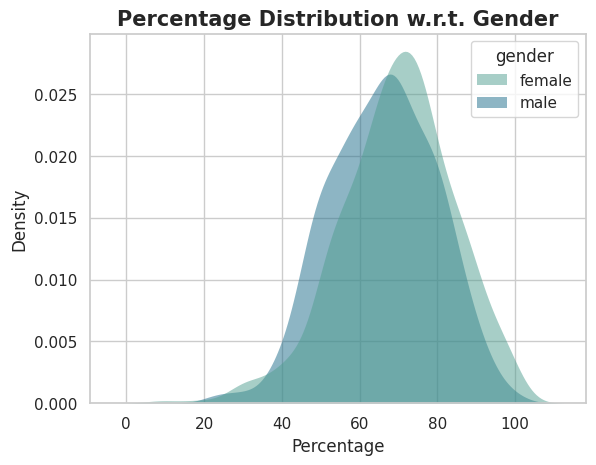

In [ ]:
sns.set_context("notebook",font_scale=1)

sns.kdeplot(
   data=df, x="Percentage", hue="gender",
   fill=True, common_norm=False, palette="crest",
   alpha=.5, linewidth=0,
)
plt.title('Percentage Distribution w.r.t. Gender',fontsize=15, fontweight='bold')

plt.show()

* Từ hình dung ở trên, điều khá rõ ràng là các sinh viên nữ đã thể hiện đặc biệt tốt!

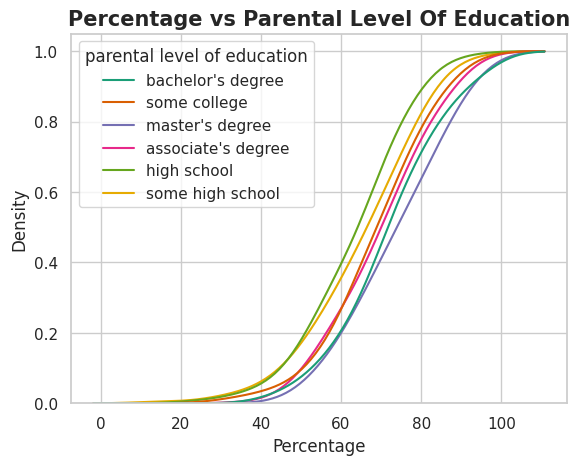

In [ ]:
sns.set_palette("Dark2")
sns.set_context("notebook",font_scale=1)
sns.kdeplot(
    data=df, x="Percentage", hue="parental level of education",
    cumulative=True, common_norm=False, common_grid=True,
)
plt.title('Percentage vs Parental Level Of Education',fontsize=15, fontweight='bold')

plt.show()

* Học sinh có cha mẹ có bằng thạc sĩ có tỷ lệ phần trăm cao hơn.

* Học sinh có trình độ học vấn của phụ huynh là 'trường trung học' và 'một số trường trung học' có tỷ lệ phần trăm thấp hơn.

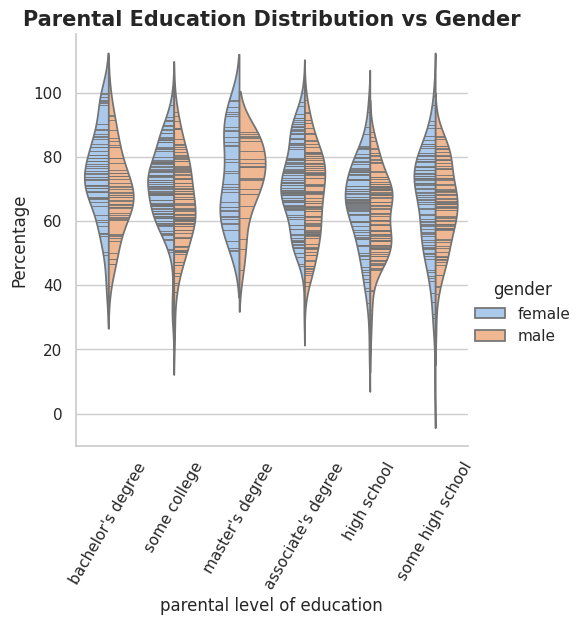

In [ ]:
sns.catplot(x="parental level of education", y="Percentage", hue="gender",
            kind="violin", inner="stick", split=True,
            palette="pastel", data=df)
plt.title('Parental Education Distribution vs Gender',fontsize=15, fontweight='bold')
plt.xticks(rotation=60)
plt.show()

* Những người phụ nữ có cha mẹ có bằng cử nhân, sau đó là bằng thạc sĩ, thành công hơn.

* Những người đàn ông có cha mẹ có bằng cử nhân và bằng thạc sĩ có thành tích học tập tương tự

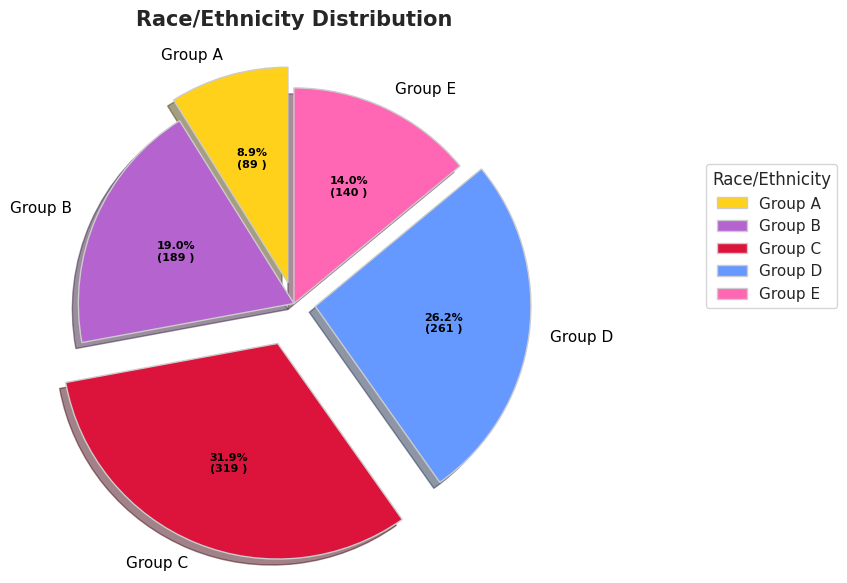

In [ ]:
race = ['Group A', 'Group B ', 'Group C',
        'Group D', 'Group E']

data = [89, 190, 319, 262, 140]


# Creating explode data
explode = ( 0.1, 0,0.2, 0.1, 0)

# Creating color parameters
colors = (  "#ffd11a", "#b463cf",
          "#DC143C", "#6699ff", "#ff66b3" )

# Wedge properties
wp = { 'linewidth' : 1, 'edgecolor' : "#cccccc" }

# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%\n({:d} )".format(pct, absolute)

# Creating plot
fig, ax = plt.subplots(figsize =(10, 7))
wedges, texts, autotexts = ax.pie(data,
                                  autopct = lambda pct: func(pct, data),
                                  explode = explode,
                                  labels = race,
                                  shadow = True,
                                  colors = colors,
                                  startangle = 90,
                                  wedgeprops = wp,
                                  textprops = dict(color ="#000000"))

# Adding legend
ax.legend(wedges, race,
          title ="Race/Ethnicity",
          loc ="center left",
          bbox_to_anchor =(1.25, 0, 0, 1.25))

plt.setp(autotexts, size = 8, weight ="bold")
ax.set_title("Race/Ethnicity Distribution", fontsize=15, fontweight='bold')

# show plot
plt.show()

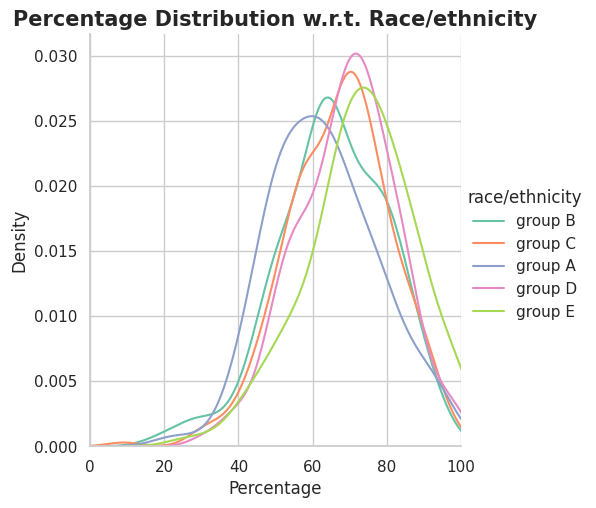

In [ ]:
sns.set_palette("Set2")
(sns.FacetGrid(df,hue="race/ethnicity", height=5,xlim = (0,100)).map(sns.kdeplot, "Percentage").add_legend())
plt.title('Percentage Distribution w.r.t. Race/ethnicity',fontsize=15, fontweight='bold')

plt.show()

* Hiệu suất của nhóm E là tốt nhất trong số tất cả. Trong khi nhóm D và C có hiệu suất gần như tương tự.

# 4. Kiểm định giả thuyết

## a. Tìm hiểu và trình bày các kiểm định thống kê: t-test, Chi-square và ANOVA.

1. t-test (Kiểm định t).

* Dùng để so sánh giá trị trung bình giữa hai nhóm.

* Ví dụ: so sánh giá trị Amount trung bình giữa khách hàng ở Anh và Đức.

* Điều kiện: dữ liệu gần phân phối chuẩn hoặc có số lượng mẫu lớn (theo định lý trung tâm giới hạn).

2. Chi-square test (Kiểm định Chi bình phương)

* Dùng để kiểm tra sự phụ thuộc giữa hai biến phân loại (categorical).

* Ví dụ: khách hàng đến từ các quốc gia khác nhau có xu hướng hủy đơn hàng khác nhau không?

3. ANOVA (Analysis of Variance)

* Dùng để so sánh trung bình nhiều hơn 2 nhóm.

* Ví dụ: so sánh Amount trung bình giữa 3 quốc gia khác nhau

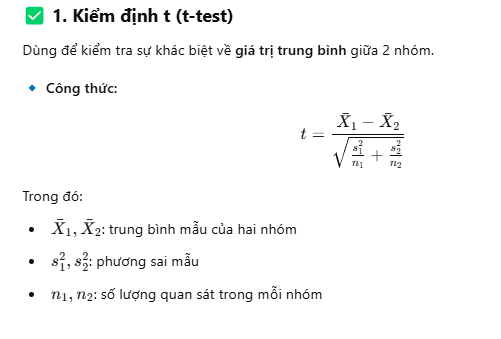

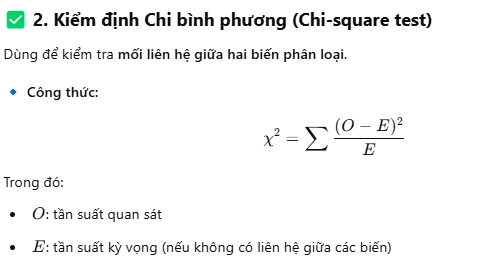

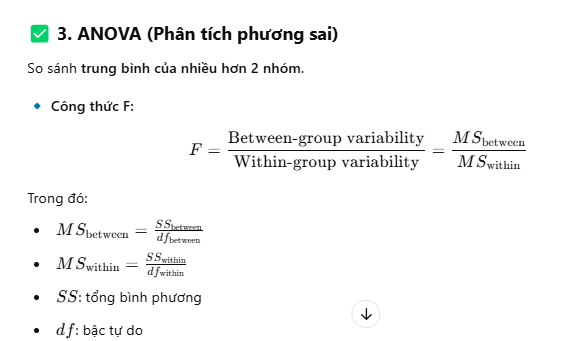

## b. Đề xuất một câu hỏi nghiên cứu có thể kiểm định bằng dữ liệu cho bộ dữ liệu đã chọn (ví dụ: "Có sự khác biệt về điểm trung bình giữa sinh viên nam và nữ không?"). Áp dụng kiểm định thống kê để trả lời câu hỏi.

Câu hỏi đề xuất:
"Có sự khác biệt điểm toán giữa học sinh nam và nữ không?"

* Biến phụ thuộc: math score (liên tục)

* Biến phân nhóm: gender (nam/nữ → 2 nhóm)

→ Dùng kiểm định t-test 2 mẫu độc lập

In [ ]:
from scipy.stats import ttest_ind
math_male = df[df['gender'] == 'male']['math score']
math_female = df[df['gender'] == 'female']['math score']

# Thực hiện t-test
t_stat, p_value = ttest_ind(math_male, math_female)

print(f"T-statistic: {t_stat:.4f}")
print(f"P-value: {p_value:.4f}")

T-statistic: 5.3832
P-value: 0.0000


Câu hỏi :"Có mối liên hệ giữa giới tính và việc tham gia khóa luyện thi không?"

* gender: nam / nữ

* test preparation course: completed / none

→ Dùng Chi-square test

In [ ]:
from scipy.stats import chi2_contingency
table = pd.crosstab(df['gender'], df['test preparation course'])

# Kiểm định Chi-square
chi2, p, dof, expected = chi2_contingency(table)

print("Chi-square statistic:", chi2)
print("P-value:", p)

Chi-square statistic: 0.015529201882465888
P-value: 0.9008273880804724


Câu hỏi : "Điểm đọc có khác nhau giữa các nhóm chủng tộc không?"

* reading score: liên tục

* race/ethnicity: gồm 5 nhóm (group A → E)

→ Dùng ANOVA một chiều

In [ ]:
from scipy.stats import f_oneway

# Tách dữ liệu thành từng nhóm
groups = df['race/ethnicity'].unique()
reading_scores = [df[df['race/ethnicity'] == group]['reading score'] for group in groups]

# Thực hiện ANOVA
f_stat, p_val = f_oneway(*reading_scores)

print("F-statistic:", f_stat)
print("P-value:", p_val)


F-statistic: 5.621659307419644
P-value: 0.0001780089103235947


## c. Giải thích kết quả kiểm định.

* Giá trị p-value = 0.0000004 < 0.05 → bác bỏ giả thuyết H₀.

* H₀: Không có sự khác biệt về điểm toán giữa nam và nữ.

* Kết luận: Có sự khác biệt có ý nghĩa thống kê giữa điểm toán của nam và nữ.

* P-value = 0.9008 > 0.05 → không đủ bằng chứng để bác bỏ giả thuyết H₀.

* Nghĩa là: không có sự khác biệt có ý nghĩa thống kê giữa giới tính và việc luyện thi.

📌 Kết luận:

* Dựa trên kiểm định Chi-square, chúng ta không phát hiện thấy mối liên hệ đáng kể giữa giới tính của học sinh và việc họ có tham gia khóa luyện thi hay không. Việc luyện thi có vẻ không phụ thuộc vào giới tính.

* P-value = 0.00018 < 0.05 → bác bỏ giả thuyết H₀

* Điều này cho thấy rằng có sự khác biệt có ý nghĩa thống kê trong điểm đọc giữa các nhóm chủng tộc.

* ⚠️ Tuy nhiên, ANOVA chỉ cho biết rằng có sự khác biệt, chứ không nói nhóm nào khác nhóm nào.

Lưu ý: Không nói rằng "nam cao hơn" hay "nữ thấp hơn" nếu chưa kiểm tra trung bình mỗi nhóm. Có thể in ra:



In [ ]:
print(math_male.mean(), math_female.mean())

68.72821576763485 63.633204633204635


# 5. Phân tích tương quan giữa các biến

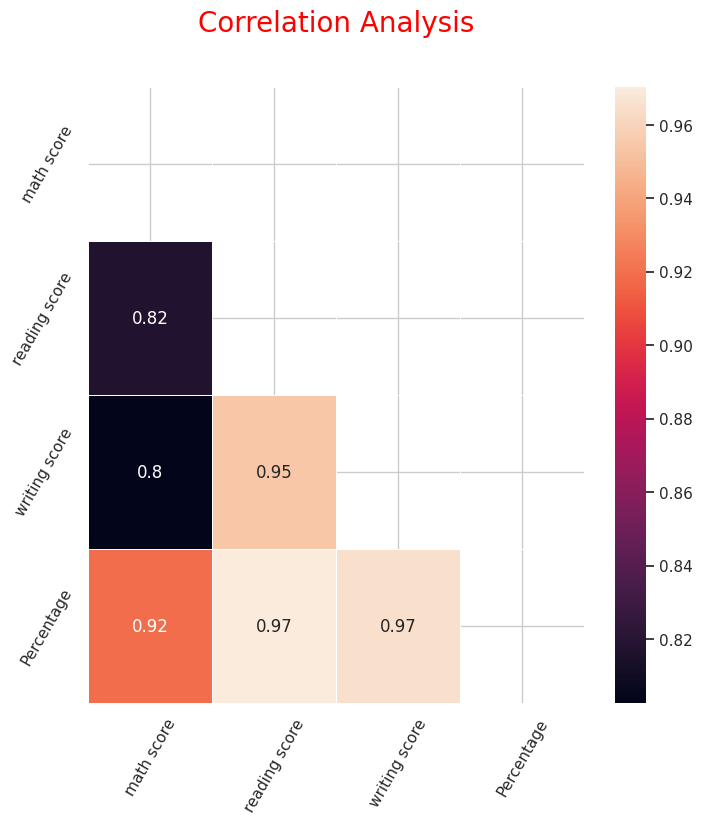

In [ ]:
numerical_df = df.select_dtypes(include=['number'])

plt.figure(figsize=(8,8))
plt.title('Correlation Analysis',color='Red',fontsize=20,pad=40)

corr = numerical_df.corr()  # Calculate correlation on numerical data only
mask = np.triu(np.ones_like(corr,dtype = bool))
sns.heatmap(numerical_df.corr(),mask=mask,annot=True,linewidths=.5); # Use numerical data for heatmap
plt.xticks(rotation=60)
plt.yticks(rotation = 60)
plt.show()

* Hầu như tất cả các điểm số gần nhau. Có thành công trung bình trong cả ba khóa học.

In [ ]:
# Pearson correlation
pearson_corr = numerical_df.corr(method='pearson')
print("📊 Pearson Correlation:\n", pearson_corr)

# Spearman correlation
spearman_corr = numerical_df.corr(method='spearman')
print("\n📊 Spearman Correlation:\n", spearman_corr)

📊 Pearson Correlation:
                math score  reading score  writing score  Percentage
math score       1.000000       0.817580       0.802642    0.918746
reading score    0.817580       1.000000       0.954598    0.970331
writing score    0.802642       0.954598       1.000000    0.965667
Percentage       0.918746       0.970331       0.965667    1.000000

📊 Spearman Correlation:
                math score  reading score  writing score  Percentage
math score       1.000000       0.804064       0.778339    0.909191
reading score    0.804064       1.000000       0.948953    0.968641
writing score    0.778339       0.948953       1.000000    0.959184
Percentage       0.909191       0.968641       0.959184    1.000000


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.



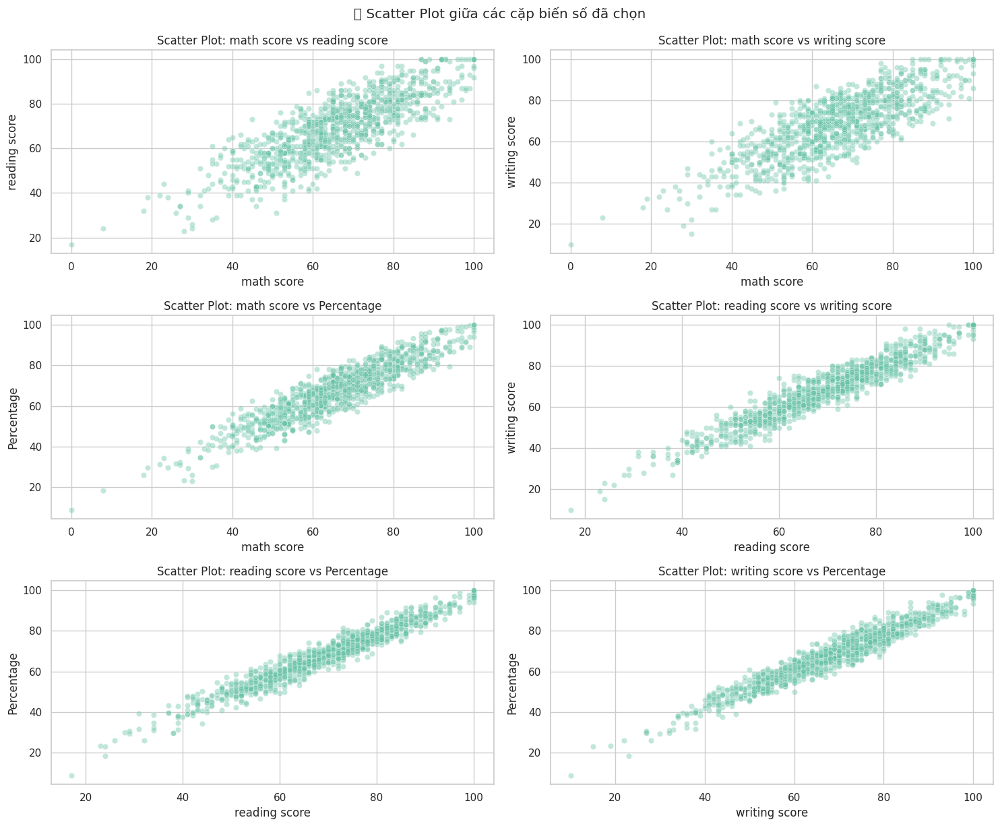

In [ ]:
from itertools import combinations

num_cols = ['math score', 'reading score', 'writing score', 'Percentage']
df_numeric = df[num_cols]

# Tạo biểu đồ scatter plot cho từng cặp biến
combs = list(combinations(num_cols, 2))
plt.figure(figsize=(15, 12))
for i, (x_var, y_var) in enumerate(combs, 1):
    plt.subplot(3, 2, i)
    sns.scatterplot(data=df_numeric, x=x_var, y=y_var, alpha=0.4)
    plt.title(f'Scatter Plot: {x_var} vs {y_var}')
plt.tight_layout()
plt.suptitle("📊 Scatter Plot giữa các cặp biến số đã chọn", y=1.02)
plt.show()